## Objective: Find out what author studies, by their abstracts.

In [5]:
import pandas as pd
import json
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
# https://www.kaggle.com/Cornell-University/arxiv
METADATA_PATH='./data/arxiv-metadata-oai-snapshot.json'

In [6]:
%%time

titles = []
abstracts = []
ids = []
authors = []
update_dates = []

with open(METADATA_PATH) as f_in:
    for i,line in enumerate(f_in):
        row = json.loads(line)

        titles.append(row["title"])
        abstracts.append(row["abstract"])
        ids.append(row["id"])
        authors.append(row["authors"]) 
        update_dates.append(row["update_date"])
        
df_papers = pd.DataFrame({
    'id' : ids,
    'title' : titles,
    'abstract' : abstracts,
    'authors' : authors,
    'update_date' : update_dates,
})

del titles, abstracts, ids, authors, update_dates

CPU times: user 25.3 s, sys: 2 s, total: 27.3 s
Wall time: 27.3 s


In [7]:
print("using arXiv data up to", df_papers.update_date.max())

using arXiv data up to 2020-11-21


In [8]:
# https://www.kaggle.com/aashita/word-clouds-of-various-shapes
def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), 
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'We', 'paper', 'new'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='black',
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    width=800, 
                    height=400,
                    mask = mask,
                    min_word_length = 4,
                    #normalize_plurals = True, 
                    #collocations = True,      
                    #collocation_threshold = 10      
                         )
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'black', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout()  


In [9]:
def get_papers(author):
    return df_papers[df_papers.authors.str.contains(author)]

In [10]:
def show(author):
    papers = get_papers(author)
    if len(papers) == 0:
        print("No papers found")
        return False
    display(papers)
    plot_wordcloud(list(papers.abstract))
    return True

,id,title,abstract,authors,update_date
671962,1510.08005,Nonzero temperature Entanglement Negativity of...,We show that the bipartite logarithmic entan...,"Nicholas E. Sherman, Trithep Devakul, Matthew ...",2016-02-24
765900,1609.00422,Nuclear relaxation rates in the Herbertsmithit...,Local spectral functions and Nuclear Magneti...,"Nicholas E. Sherman, Takashi Imai and Rajiv R....",2016-12-26
912385,1711.05375,Structure Factors of the Kagome-Lattice Heisen...,We compute the real-space spin correlations ...,Nicholas E. Sherman and Rajiv R. P. Singh,2018-01-31
1194228,1910.10309,A dynamical Toric Code model with fusion and d...,We introduce a two-parameter family of pertu...,"Bruno Nachtergaele, Nicholas E. Sherman",2020-03-11


True

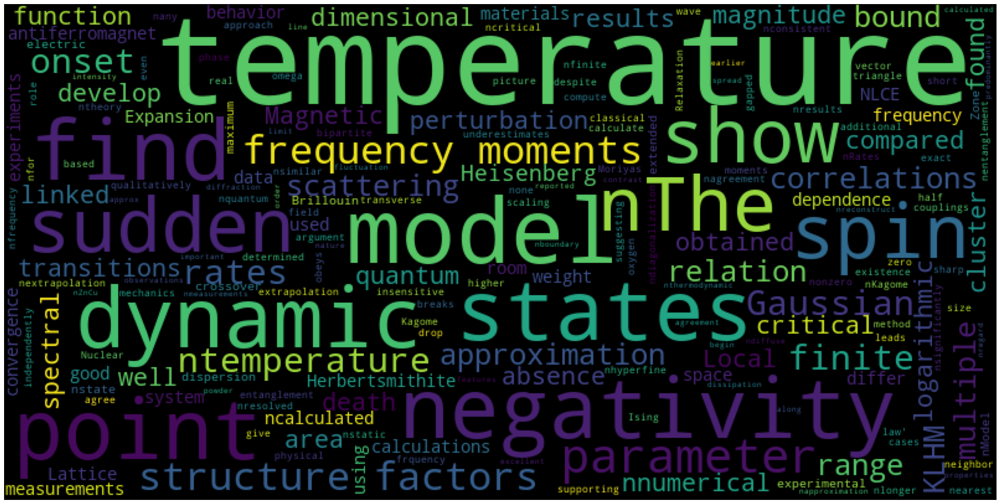

In [11]:
show("Nicholas E. Sherman")

In [12]:
%matplotlib notebook
# prevents the matplotlib from plotting the wordcloud

In [13]:
show("Nicholas E. Sherman")

,id,title,abstract,authors,update_date
671962,1510.08005,Nonzero temperature Entanglement Negativity of...,We show that the bipartite logarithmic entan...,"Nicholas E. Sherman, Trithep Devakul, Matthew ...",2016-02-24
765900,1609.00422,Nuclear relaxation rates in the Herbertsmithit...,Local spectral functions and Nuclear Magneti...,"Nicholas E. Sherman, Takashi Imai and Rajiv R....",2016-12-26
912385,1711.05375,Structure Factors of the Kagome-Lattice Heisen...,We compute the real-space spin correlations ...,Nicholas E. Sherman and Rajiv R. P. Singh,2018-01-31
1194228,1910.10309,A dynamical Toric Code model with fusion and d...,We introduce a two-parameter family of pertu...,"Bruno Nachtergaele, Nicholas E. Sherman",2020-03-11


<IPython.core.display.Javascript object>

True

## Case study: Berkeley CS
https://www2.eecs.berkeley.edu/Faculty/Lists/list.html
```js
new Array(...document.getElementsByClassName("media-heading")).map(x => x.innerText)
```

In [16]:
profs_cal = [
  "Pieter Abbeel",
  "Rediet Abebe",
  "Elad Alon",
  "Venkat Anantharam",
  "Gopala Krishna Anumanchipalli",
  "Murat Arcak",
  "Ana C. Arias",
  "Krste Asanović",
  "Babak Ayazifar",
  "Jonathan Bachrach",
  "Michael Ball",
  "David Bamman",
  "Brian A. Barsky",
  "Peter Bartlett",
  "Alexandre Bayen",
  "Lenore Blum",
  "Jeffrey Bokor",
  "Christian Borgs",
  "Bernhard Boser",
  "Aydin Buluç",
  "Duncan Callaway",
  "John F. Canny",
  "Jose M. Carmena",
  "Sarah Chasins",
  "Jennifer Chayes",
  "Alvin Cheung",
  "Alessandro Chiesa",
  "John Chuang",
  "Steven Conolly",
  "Thomas Courtade",
  "Natacha Crooks",
  "Trevor Darrell",
  "James Demmel",
  "John DeNero",
  "Anca Dragan",
  "Prabal Dutta",
  "Alexei A. Efros",
  "Laurent El Ghaoui",
  "Hany Farid",
  "Ronald S. Fearing",
  "Armando Fox",
  "Gerald Friedland",
  "Robert Full",
  "Jack Gallant",
  "Dan Garcia",
  "Sanjam Garg",
  "Ali Ghodsi",
  "Ken Goldberg",
  "Shafi Goldwasser",
  "Joseph Gonzalez",
  "Nika Haghtalab",
  "Moritz Hardt",
  "Björn Hartmann",
  "Marti A. Hearst",
  "Joseph M. Hellerstein",
  "Paul N. Hilfinger",
  "Chenming Hu",
  "Joshua Hug",
  "Christopher Hunn",
  "Nilah Ioannidis",
  "Ali Javey",
  "Jiantao Jiao",
  "Michael Jordan",
  "Anthony D. Joseph",
  "Angjoo Kanazawa",
  "Boubacar Kanté",
  "Randy H. Katz",
  "Kurt Keutzer",
  "Tsu-Jae King Liu",
  "Daniel Klein",
  "John D. Kubiatowicz",
  "Edward A. Lee",
  "Sergey Levine",
  "Jennifer Listgarten",
  "Chunlei Liu",
  "Michael Lustig",
  "Yi Ma",
  "Michel Maharbiz",
  "Jitendra Malik",
  "Rikky Muller",
  "Jelani Nelson",
  "Andrew R. Neureuther",
  "Ren Ng",
  "Clark Nguyen",
  "Ali Niknejad",
  "Borivoje Nikolic",
  "James O'Brien",
  "Bruno Olshausen",
  "Aditya Parameswaran",
  "Shyam Parekh",
  "David A. Patterson",
  "Eric Paulos",
  "Vern Paxson",
  "Robert Pilawa-Podgurski",
  "Kristofer Pister",
  "Kameshwar Poolla",
  "Raluca Ada Popa",
  "Jan M. Rabaey",
  "Jonathan Ragan-Kelley",
  "Prasad Raghavendra",
  "Kannan Ramchandran",
  "Gireeja Ranade",
  "Satish Rao",
  "Sylvia Ratnasamy",
  "Ben Recht",
  "Jaijeet Roychowdhury",
  "Stuart J. Russell",
  "Anant Sahai",
  "Sayeef Salahuddin",
  "Niloufar Salehi",
  "Seth R. Sanders",
  "Alberto L. Sangiovanni-Vincentelli",
  "S. Shankar Sastry",
  "Koushik Sen",
  "Sanjit A. Seshia",
  "Osama Shana'a",
  "Sophia Shao",
  "Scott Shenker",
  "Jonathan Shewchuk",
  "Alistair Sinclair",
  "Alp Sipahigil",
  "Somayeh Sojoudi",
  "Dawn Song",
  "Yun S. Song",
  "Costas J. Spanos",
  "Jacob Steinhardt",
  "Ion Stoica",
  "Vladimir Stojanovic",
  "Bernd Sturmfels",
  "Vivek Subramanian",
  "Avishay Tal",
  "Grigory Tikhomirov",
  "Claire Tomlin",
  "Pravin Varaiya",
  "Umesh Vazirani",
  "Alexandra von Meier",
  "David A. Wagner",
  "Martin Wainwright",
  "Laura Waller",
  "John Wawrzynek",
  "Nicholas Weaver",
  "Ming C. Wu",
  "Eli Yablonovitch",
  "Katherine A. Yelick",
  "Nir Yosef",
  "Bin Yu",
  "Stella Yu",
  "Avideh Zakhor"
]

In [17]:
for p in profs_cal:
    print(p)
    if show(p):
        name = p.replace(" ", "_").replace('\\\\?', "").replace("'?", "")
        plt.savefig(f"./berkeleyeecs/{name}.png")
    plt.close()

Pieter Abbeel


,id,title,abstract,authors,update_date
286334,1109.1966,The path inference filter: model-based low-lat...,We consider the problem of reconstructing ve...,"Timothy Hunter, Pieter Abbeel, and Alexandre B...",2015-03-19
343811,1205.4810,Safe Exploration in Markov Decision Processes,In environments with uncertain dynamics expl...,"Teodor Mihai Moldovan, Pieter Abbeel",2012-07-10
354580,1207.1366,Learning Factor Graphs in Polynomial Time & Sa...,We study computational and sample complexity...,"Pieter Abbeel, Daphne Koller, Andrew Y. Ng",2012-07-09
393009,1212.3393,Large Scale Estimation in Cyberphysical System...,Controlling and analyzing cyberphysical and ...,"Timothy Hunter, Tathagata Das, Matei Zaharia, ...",2012-12-17
397194,1301.0604,Discriminative Probabilistic Models for Relati...,"In many supervised learning tasks, the entit...","Ben Taskar, Pieter Abbeel, Daphne Koller",2013-01-07
...,...,...,...,...,...
1328336,2008.00614,Dynamics Generalization via Information Bottle...,Despite the significant progress of deep rei...,"Xingyu Lu, Kimin Lee, Pieter Abbeel, Stas Tiomkin",2020-08-04
1329547,2008.01825,Robust Reinforcement Learning using Adversaria...,Reinforcement Learning (RL) is an effective ...,Eugene Vinitsky and Yuqing Du and Kanaad Parva...,2020-09-24
1349822,2009.08319,Decoupling Representation Learning from Reinfo...,In an effort to overcome limitations of rewa...,"Adam Stooke, Kimin Lee, Pieter Abbeel, and Mic...",2020-10-01
1361019,2010.04689,LaND: Learning to Navigate from Disengagements,Consistently testing autonomous mobile robot...,"Gregory Kahn, Pieter Abbeel, Sergey Levine",2020-10-12


<IPython.core.display.Javascript object>

Rediet Abebe


,id,title,abstract,authors,update_date
792036,1611.06589,Fair Division via Social Comparison,"In the classical cake cutting problem, a res...","Rediet Abebe, Jon Kleinberg, David Parkes",2018-02-27
888989,1709.04123,Mitigating Overexposure in Viral Marketing,In traditional models for word-of-mouth reco...,"Rediet Abebe, Lada Adamic, Jon Kleinberg",2017-11-10
936794,1801.07863,Opinion Dynamics with Varying Susceptibility t...,A long line of work in social psychology has...,"Rediet Abebe, Jon Kleinberg, David Parkes, Cha...",2018-01-29
946456,1802.06916,Simplicial Closure and higher-order link predi...,Networks provide a powerful formalism for mo...,"Austin R. Benson, Rediet Abebe, Michael T. Sch...",2018-12-13
991380,1806.05740,Using Search Queries to Understand Health Info...,"The lack of comprehensive, high-quality heal...","Rediet Abebe, Shawndra Hill, Jennifer Wortman ...",2019-04-18
1041019,1810.09832,Mechanism Design for Social Good,"Across various domains--such as health, educ...","Rediet Abebe, Kira Goldner",2018-10-24
1100183,1903.07797,A Truthful Cardinal Mechanism for One-Sided Ma...,We revisit the well-studied problem of desig...,"Rediet Abebe, Richard Cole, Vasilis Gkatzelis,...",2020-01-22
1152077,1907.07541,A Conjectural Brouwer Inequality for Higher-Di...,We present a generalization of Brouwer's con...,Rediet Abebe,2019-07-18
1216779,1912.04883,Roles for Computing in Social Change,A recent normative turn in computer science ...,"Rediet Abebe, Solon Barocas, Jon Kleinberg, Ka...",2020-07-10
1271073,2004.06303,Quantifying Community Characteristics of Mater...,While most mortality rates have decreased in...,"Rediet Abebe, Salvatore Giorgi, Anna Tedijanto...",2020-04-15


<IPython.core.display.Javascript object>

Elad Alon


,id,title,abstract,authors,update_date
440493,1306.5709,Physical Principles for Scalable Neural Recording,Simultaneously measuring the activities of a...,"Adam H. Marblestone, Bradley M. Zamft, Yael G....",2020-02-04
443924,1307.2196,"Neural Dust: An Ultrasonic, Low Power Solution...",A major hurdle in brain-machine interfaces (...,"Dongjin Seo, Jose M. Carmena, Jan M. Rabaey, E...",2013-07-09
1199933,1911.01339,Optimizing the LO Distribution Architecture of...,Wireless networks at millimeter wavelengths ...,"Greg LaCaille, Antonio Puglielli, Elad Alon, B...",2019-11-05


<IPython.core.display.Javascript object>

Venkat Anantharam


,id,title,abstract,authors,update_date
121207,0904.4541,Evaluation of Marton's Inner Bound for the Gen...,The best known inner bound on the two-receiv...,Amin Aminzadeh Gohari and Venkat Anantharam,2011-05-31
121208,0904.4542,A Generalized Cut-Set Bound,"In this paper, we generalize the well known ...",Amin Aminzadeh Gohari and Venkat Anantharam,2009-04-30
181445,1003.5638,Integral representation of Skorokhod reflection,We show that a certain integral representati...,Venkat Anantharam and Takis Konstantopoulos,2010-03-30
198441,1006.5166,On Marton's Inner Bound for the General Broadc...,We establish several new results on Marton's...,"Amin Aminzadeh Gohari, Abbas El Gamal and Venk...",2016-11-18
234292,1012.4924,Information-Theoretic Capacity and Error Expon...,This paper studies the Shannon regime for th...,Venkat Anantharam and Francois Baccelli,2015-03-17
260770,1105.1505,Generating Dependent Random Variables Over Net...,In this paper we study the problem of genera...,Amin Aminzadeh Gohari and Venkat Anantharam,2011-07-06
275158,1107.3166,"Stable, scalable, decentralized P2P file shari...",P2P systems provide a scalable solution for ...,"Barlas O\u{g}uz, Venkat Anantharam, Ilkka Norros",2011-07-21
319572,1202.0898,On Marton's inner bound for broadcast channels,Marton's inner bound is the best known achie...,"Amin Gohari, Chandra Nair and Venkat Anantharam",2012-02-07
359569,1207.6355,The Entropy Power Inequality and Mrs. Gerber's...,Shannon's Entropy Power Inequality can be vi...,Varun Jog and Venkat Anantharam,2012-07-31
393482,1212.3866,Agnostic insurability of model classes,"Motivated by problems in insurance, our task...",Narayana Santhanam and Venkat Anantharam,2013-05-02


<IPython.core.display.Javascript object>

Gopala Krishna Anumanchipalli
No papers found
Murat Arcak


,id,title,abstract,authors,update_date
7190,0705.3188,A passivity-based stability criterion for a cl...,This paper presents a stability test for a c...,Murat Arcak and Eduardo D. Sontag,2007-05-23
140385,0908.2614,On spatially uniform behavior in reaction-diff...,We present a condition which guarantees spat...,Murat Arcak,2009-08-19
313464,1201.1477,A Broad Dynamical Model for Pattern Formation ...,Many patterning events in multi-cellular org...,Murat Arcak,2012-01-09
391356,1212.1740,A Graph Partitioning Approach to Predict Patte...,We analyze pattern formation on a network of...,"Ana S. Rufino Ferreira, Murat Arcak",2014-07-25
450761,1308.0586,A note on norm-based Lyapunov functions via co...,It is well know that for globally contractiv...,Samuel Coogan and Murat Arcak,2013-08-05
458802,1309.1794,An Adaptive Algorithm for Synchronization in D...,We present an adaptive algorithm that guaran...,S. Yusef Shafi and Murat Arcak,2013-09-10
543183,1407.6426,Pattern Formation with a Compartmental Lateral...,We propose a compartmental lateral inhibitio...,"Ana Sofia Rufino Ferreira, Justin Hsia, Murat ...",2014-07-25
546743,1408.1437,Traffic Network Control from Temporal Logic Sp...,We propose a framework for generating a sign...,"Samuel Coogan, Ebru Aydin Gol, Murat Arcak, Ca...",2016-06-23
558779,1409.6354,A Compartmental Model for Traffic Networks and...,We propose a macroscopic traffic network flo...,Samuel Coogan and Murat Arcak,2015-05-25
563107,1410.2006,Compositional Performance Certification of Int...,A compositional performance certification me...,"Chris Meissen, Laurent Lessard, Murat Arcak, A...",2015-08-27


<IPython.core.display.Javascript object>

Ana C. Arias


,id,title,abstract,authors,update_date
949777,1802.10237,An EMG Gesture Recognition System with Flexibl...,EMG-based gesture recognition shows promise ...,"Ali Moin, Andy Zhou, Abbas Rahimi, Simone Bena...",2018-04-06
1251012,2003.00657,Wireless User-Generic Ear EEG,In the past few years it has been demonstrat...,"Ryan Kaveh, Justin Doong, Andy Zhou, Carolyn S...",2020-04-30


<IPython.core.display.Javascript object>

Krste Asanović
No papers found
Babak Ayazifar
No papers found
Jonathan Bachrach
No papers found
Michael Ball


,id,title,abstract,authors,update_date
1369025,2010.12695,Adding Interactive Visual Syntax to Textual Code,Many programming problems call for turning g...,"Leif Andersen, Michael Ballantyne, Matthias Fe...",2020-10-27


<IPython.core.display.Javascript object>

David Bamman


,id,title,abstract,authors,update_date
378361,1210.4567,Gender identity and lexical variation in socia...,We present a study of the relationship betwe...,"David Bamman, Jacob Eisenstein, and Tyler Schn...",2014-05-13
414530,1303.2873,Inferring Social Rank in an Old Assyrian Trade...,We present work in jointly inferring the uni...,"David Bamman, Adam Anderson and Noah A. Smith",2013-03-13
428587,1305.1319,New Alignment Methods for Discriminative Book ...,We consider the unsupervised alignment of th...,David Bamman and Noah A. Smith,2013-05-08
436875,1306.2091,A framework for (under)specifying dependency s...,We introduce a framework for lightweight dep...,"Nathan Schneider, Brendan O'Connor, Naomi Saph...",2013-06-18
683380,1512.00728,Annotating Character Relationships in Literary...,We present a dataset of manually annotated r...,"Philip Massey, Patrick Xia, David Bamman and N...",2015-12-03
932337,1801.03406,DeepSeek: Content Based Image Search & Retrieval,Most of the internet today is composed of di...,"Tanya Piplani, David Bamman",2018-01-12
1124554,1905.06118,Learning to Groove with Inverse Sequence Trans...,We explore models for translating abstract m...,"Jon Gillick, Adam Roberts, Jesse Engel, Dougla...",2019-07-29
1213036,1912.01140,An Annotated Dataset of Coreference in English...,We present in this work a new dataset of cor...,"David Bamman, Olivia Lewke and Anya Mansoor",2020-05-18
1218875,1912.06979,Breaking Speech Recognizers to Imagine Lyrics,We introduce a new method for generating tex...,"Jon Gillick, David Bamman",2019-12-17
1278750,2004.13980,Measuring Information Propagation in Literary ...,We present the task of modeling information ...,"Matthew Sims, David Bamman",2020-10-08


<IPython.core.display.Javascript object>

Brian A. Barsky
No papers found
Peter Bartlett


,id,title,abstract,authors,update_date
178052,1003.2245,Optimal Allocation Strategies for the Dark Poo...,We study the problem of allocating stocks to...,Alekh Agarwal and Peter Bartlett and Max Dama,2010-03-12
254283,1104.0729,Online and Batch Learning Algorithms for Data ...,We introduce new online and batch algorithms...,"Afshin Rostamizadeh, Alekh Agarwal, Peter Bart...",2012-02-19
422841,1304.3708,Advice-Efficient Prediction with Expert Advice,Advice-efficient prediction with expert advi...,Yevgeny Seldin and Peter Bartlett and Koby Cra...,2013-04-15
431592,1305.4324,Horizon-Independent Optimal Prediction with Lo...,We study online learning under logarithmic l...,"Peter Bartlett, Peter Grunwald, Peter Harremoe...",2013-05-21
852589,1705.09048,Convergence of Langevin MCMC in KL-divergence,Langevin diffusion is a commonly used tool f...,Xiang Cheng and Peter Bartlett,2017-11-02
852937,1705.09396,Approximate and Stochastic Greedy Optimization,We consider two greedy algorithms for minimi...,Nan Ye and Peter Bartlett,2018-11-19
860434,1706.05699,Gradient Diversity: a Key Ingredient for Scala...,It has been experimentally observed that dis...,"Dong Yin, Ashwin Pananjady, Max Lam, Dimitris ...",2018-01-09
863233,1706.08498,Spectrally-normalized margin bounds for neural...,This paper presents a margin-based multiclas...,"Peter Bartlett, Dylan J. Foster, Matus Telgarsky",2017-12-06
951631,1803.01498,Byzantine-Robust Distributed Learning: Towards...,"In large-scale distributed learning, securit...","Dong Yin, Yudong Chen, Kannan Ramchandran, Pet...",2018-03-06
990998,1806.05358,Defending Against Saddle Point Attack in Byzan...,We study robust distributed learning that in...,"Dong Yin, Yudong Chen, Kannan Ramchandran, Pet...",2020-07-30


<IPython.core.display.Javascript object>

Alexandre Bayen


,id,title,abstract,authors,update_date
286334,1109.1966,The path inference filter: model-based low-lat...,We consider the problem of reconstructing ve...,"Timothy Hunter, Pieter Abbeel, and Alexandre B...",2015-03-19
410957,1302.6617,Arriving on time: estimating travel time distr...,Most optimal routing problems focus on minim...,"Timothy Hunter, Aude Hofleitner, Jack Reilly, ...",2013-02-28
546999,1408.1693,"Computing the log-determinant of symmetric, di...",We present new algorithms for computing the ...,"Timothy Hunter, Ahmed El Alaoui, Alexandre Bayen",2014-08-11
554085,1409.1660,Building-in-Briefcase (BiB),A building's environment has profound influe...,"Kevin Weekly, Ming Jin, Han Zou, Christopher H...",2014-09-08
565357,1410.4256,Anatomy of a Crash,Transportation networks constitute a critica...,"Aude Marzuoli, Emmanuel Boidot, Eric Feron, Pa...",2014-10-17
739168,1606.01261,Minimizing Regret on Reflexive Banach Spaces a...,We study a general version of the adversaria...,"Maximilian Balandat, Walid Krichene, Claire To...",2016-06-07
845464,1705.01923,MOBILITY21: Strategic Investments for Transpor...,America's transportation infrastructure is t...,"Rahul Mangharam, Megan Reyerson, Steve Viscell...",2017-05-05
972719,1804.11026,A unified software framework for solving traff...,We describe a software framework for solving...,"Juliette Ugirumurera, Gabriel Gomes, Emily Por...",2018-05-01
1063694,1812.06120,Simulation to Scaled City: Zero-Shot Policy Tr...,"Using deep reinforcement learning, we train ...","Kathy Jang, Eugene Vinitsky, Behdad Chalaki, B...",2019-02-26
1068411,1812.10837,On the Approximability of Time Disjoint Walks,We introduce the combinatorial optimization ...,"Alexandre Bayen, Jesse Goodman, Eugene Vinitsky",2020-02-19


<IPython.core.display.Javascript object>

Lenore Blum


,id,title,abstract,authors,update_date
1382598,2011.09850,A Theoretical Computer Science Perspective on ...,"The quest to understand consciousness, once ...",Manuel Blum and Lenore Blum,2020-11-20


<IPython.core.display.Javascript object>

Jeffrey Bokor


,id,title,abstract,authors,update_date
70651,0806.4638,Spin-dependent scattering in a silicon transistor,The scattering of conduction electrons off n...,"Rogerio de Sousa, Cheuk Chi Lo, Jeffrey Bokor",2009-07-25
80329,0809.0037,Simulation Studies of Nanomagnet-Based Archite...,We report a simulation study on interacting ...,"David Carlton, Nathan Emley, Eduard Tuchfeld, ...",2015-05-13
96957,0812.0831,Diameter-Dependent Electron Mobility of InAs N...,Temperature-dependent I-V and C-V spectrosco...,"Alexandra Ford, Johnny Ho, Yu-Lun Chueh, Yu-Ch...",2015-05-13
465498,1310.0495,Bottom-up Graphene Nanoribbon Field-Effect Tra...,Recently developed processes have enabled bo...,"Patrick B. Bennett, Zahra Pedramrazi, Ali Mada...",2015-06-17
511389,1403.6490,Speed and Reliability of Nanomagnetic Logic Te...,Nanomagnetic logic is an energy efficient co...,"Zheng Gu, Mark E. Nowakowski, David B. Carlton...",2014-03-27
542894,1407.6137,Deterministic Domain Wall Motion Orthogonal To...,Deterministic control of domain walls orthog...,"Debanjan Bhowmik, Mark E. Nowakowski, Long You...",2014-07-24
548463,1408.3157,Sub-nanosecond signal propagation in anisotrop...,Energy efficient nanomagnetic logic (NML) co...,"Zheng Gu, Mark E. Nowakowski, David B. Carlton...",2015-05-20
553045,1409.0620,Switching of Perpendicularly Polarized Nanomag...,Spin orbit torque (SOT) provides an efficien...,"Long You, OukJae Lee, Debanjan Bhowmik, Domini...",2016-01-05
725608,1604.06441,Model for multi-shot all-thermal all-optical s...,All optical magnetic switching (AOS) is a re...,"Jon Gorchon, Yang Yang, Jeffrey Bokor",2016-07-27
737879,1605.09764,The role of electron and phonon temperatures i...,Ultrafast optical heating of the electrons i...,"Jon Gorchon, Richard B. Wilson, Yang Yang, Aks...",2016-11-09


<IPython.core.display.Javascript object>

Christian Borgs


,id,title,abstract,authors,update_date
23455,0709.1190,Belief-Propagation for Weighted b-Matchings on...,We consider the general problem of finding t...,"Mohsen Bayati, Christian Borgs, Jennifer Chaye...",2015-03-13
31929,0710.4982,First to Market is not Everything: an Analysis...,"In this paper, we provide a rigorous analysi...","Christian Borgs, Jennifer Chayes, Constantinos...",2011-09-07
53004,0803.1244,Moments of Two-Variable Functions and the Uniq...,For a symmetric bounded measurable function ...,"Christian Borgs, Jennifer Chayes, Laszlo Lovasz",2008-12-08
155788,0911.1767,A Natural Dynamics for Bargaining on Exchange ...,Bargaining networks model the behavior of a ...,"Yashodhan Kanoria, Mohsen Bayati, Christian Bo...",2010-05-10
170874,1002.0115,Left and right convergence of graphs with boun...,The theory of convergent graph sequences has...,"Christian Borgs, Jennifer Chayes, Jeff Kahn, L...",2010-02-02
184019,1004.2079,Bargaining dynamics in exchange networks,We consider a one-sided assignment market or...,"Mohsen Bayati, Christian Borgs, Jennifer Chaye...",2015-03-14
206275,1008.1516,The Hitchhiker's Guide to Affiliation Networks...,We propose a new class of game-theoretic mod...,"Christian Borgs, Jennifer Chayes, Jian Ding, B...",2010-09-23
225750,1011.3058,Tight Bounds for Mixing of the Swendsen-Wang A...,We study two widely used algorithms for the ...,"Christian Borgs, Jennifer T. Chayes, Prasad Te...",2010-11-16
316886,1201.4899,Finding Endogenously Formed Communities,A central problem in e-commerce is determini...,"Maria-Florina Balcan, Christian Borgs, Mark Br...",2012-03-02
321445,1202.2771,Multi-Scale Matrix Sampling and Sublinear-Time...,A fundamental problem arising in many applic...,"Christian Borgs, Michael Brautbar, Jennifer Ch...",2015-03-20


<IPython.core.display.Javascript object>

Bernhard Boser
No papers found
Aydin Buluç
No papers found
Duncan Callaway


,id,title,abstract,authors,update_date
978160,1805.05115,How much energy storage do modern power system...,The central question we seek to address in t...,Autumn Preskill and Duncan Callaway,2018-05-15
992430,1806.06790,Towards Distributed Energy Services: Decentral...,The implementation of optimal power flow (OP...,"Roel Dobbe, Oscar Sondermeijer, David Fridovic...",2019-08-15
1276287,2004.11517,Computational Experiment Design for Operations...,Computer simulations that demonstrate the va...,"Jose Daniel Lara, Jonathan T. Lee, Duncan Call...",2020-09-01


<IPython.core.display.Javascript object>

John F. Canny


,id,title,abstract,authors,update_date
1009030,1807.11824,t-SNE-CUDA: GPU-Accelerated t-SNE and its Appl...,Modern datasets and models are notoriously d...,"David M. Chan, Roshan Rao, Forrest Huang, John...",2018-08-01
1062178,1812.04604,Diagnostic Visualization for Deep Neural Netwo...,The internal states of most deep neural netw...,"Biye Jiang, David M. Chan, Tianhao Zhang, John...",2018-12-12
1109439,1904.04399,Sketchforme: Composing Sketched Scenes from Te...,Sketching and natural languages are effectiv...,Forrest Huang and John F. Canny,2019-04-10


<IPython.core.display.Javascript object>

Jose M. Carmena


,id,title,abstract,authors,update_date
440493,1306.5709,Physical Principles for Scalable Neural Recording,Simultaneously measuring the activities of a...,"Adam H. Marblestone, Bradley M. Zamft, Yael G....",2020-02-04
443924,1307.2196,"Neural Dust: An Ultrasonic, Low Power Solution...",A major hurdle in brain-machine interfaces (...,"Dongjin Seo, Jose M. Carmena, Jan M. Rabaey, E...",2013-07-09
875568,1708.00556,"WAND: A 128-channel, closed-loop, wireless art...",Closed-loop neuromodulation systems aim to t...,"Andy Zhou, Samantha R. Santacruz, Benjamin C. ...",2018-05-30
1004798,1807.07590,StimDust: A mm-scale implantable wireless prec...,Neural stimulation is a powerful technique f...,"David K. Piech, Benjamin C. Johnson, Konlin Sh...",2020-02-18
1127822,1905.09386,A Sub-mm$^3$ Ultrasonic Free-floating Implant ...,"A 0.8 mm$^3$ wireless, ultrasonically powere...","Mohammad Meraj Ghanbari, David K. Piech, Konli...",2019-07-18


<IPython.core.display.Javascript object>

Sarah Chasins


,id,title,abstract,authors,update_date
793067,1611.07620,Using SyGuS to Synthesize Reactive Motion Plans,We present an approach for synthesizing reac...,"Sarah Chasins (UC Berkeley), Julie L. Newcomb ...",2016-11-24


<IPython.core.display.Javascript object>

Jennifer Chayes


,id,title,abstract,authors,update_date
23455,0709.1190,Belief-Propagation for Weighted b-Matchings on...,We consider the general problem of finding t...,"Mohsen Bayati, Christian Borgs, Jennifer Chaye...",2015-03-13
31929,0710.4982,First to Market is not Everything: an Analysis...,"In this paper, we provide a rigorous analysi...","Christian Borgs, Jennifer Chayes, Constantinos...",2011-09-07
53004,0803.1244,Moments of Two-Variable Functions and the Uniq...,For a symmetric bounded measurable function ...,"Christian Borgs, Jennifer Chayes, Laszlo Lovasz",2008-12-08
155788,0911.1767,A Natural Dynamics for Bargaining on Exchange ...,Bargaining networks model the behavior of a ...,"Yashodhan Kanoria, Mohsen Bayati, Christian Bo...",2010-05-10
170874,1002.0115,Left and right convergence of graphs with boun...,The theory of convergent graph sequences has...,"Christian Borgs, Jennifer Chayes, Jeff Kahn, L...",2010-02-02
184019,1004.2079,Bargaining dynamics in exchange networks,We consider a one-sided assignment market or...,"Mohsen Bayati, Christian Borgs, Jennifer Chaye...",2015-03-14
206275,1008.1516,The Hitchhiker's Guide to Affiliation Networks...,We propose a new class of game-theoretic mod...,"Christian Borgs, Jennifer Chayes, Jian Ding, B...",2010-09-23
321445,1202.2771,Multi-Scale Matrix Sampling and Sublinear-Time...,A fundamental problem arising in many applic...,"Christian Borgs, Michael Brautbar, Jennifer Ch...",2015-03-20
324707,1202.6033,The Power of Local Information in Social Networks,We study the power of \textit{local informat...,Christian Borgs and Michael Brautbar and Jenni...,2013-10-15
390500,1212.0884,Maximizing Social Influence in Nearly Optimal ...,"Diffusion is a fundamental graph process, un...","Christian Borgs, Michael Brautbar, Jennifer Ch...",2016-06-23


<IPython.core.display.Javascript object>

Alvin Cheung


,id,title,abstract,authors,update_date
360843,1208.0271,Automatic Partitioning of Database Applications,Database-backed applications are nearly ubiq...,"Alvin Cheung, Owen Arden, Samuel Madden, Andre...",2012-08-02
362585,1208.2013,Inferring SQL Queries Using Program Synthesis,Developing high-performance applications tha...,Alvin Cheung and Armando Solar-Lezama and Samu...,2015-03-20
363497,1208.2925,Using Program Synthesis for Social Recommendat...,This paper presents a new approach to select...,"Alvin Cheung, Armando Solar-Lezama, Samuel Madden",2012-08-15
687675,1512.05023,Packet Transactions: High-level Programming fo...,"Many algorithms for congestion control, sche...","Anirudh Sivaraman, Mihai Budiu, Alvin Cheung, ...",2016-02-02
729779,1605.01664,PipeGen: Data Pipe Generator for Hybrid Analytics,We develop a tool called PipeGen for efficie...,"Brandon Haynes, Alvin Cheung and Magdalena Bal...",2016-05-17
750112,1607.02561,Database-Backed Web Applications in the Wild: ...,Most modern database-backed web applications...,"Cong Yan, Alvin Cheung, Shan Lu",2016-11-24
752373,1607.04822,HoTTSQL: Proving Query Rewrites with Univalent...,Every database system contains a query optim...,"Shumo Chu, Konstantin Weitz, Alvin Cheung, Dan...",2016-08-09
793070,1611.07623,Leveraging Parallel Data Processing Frameworks...,Many parallel data frameworks have been prop...,"Maaz Bin Safeer Ahmad, Alvin Cheung",2016-11-24
843272,1704.08760,Learning a Neural Semantic Parser from User Fe...,We present an approach to rapidly and easily...,"Srinivasan Iyer, Ioannis Konstas, Alvin Cheung...",2017-05-01
938733,1801.09802,Automatically Leveraging MapReduce Frameworks ...,MapReduce is a popular programming paradigm ...,Maaz Bin Safeer Ahmad and Alvin Cheung,2018-06-20


<IPython.core.display.Javascript object>

Alessandro Chiesa


,id,title,abstract,authors,update_date
280118,1108.2080,Going Beyond Pollution Attacks: Forcing Byzant...,Network coding achieves optimal throughput i...,"Raluca Ada Popa, Alessandro Chiesa, Tural Badi...",2011-08-11
280136,1108.2098,Improved Soundness for QMA with Multiple Provers,We present three contributions to the unders...,"Alessandro Chiesa, Michael A. Forbes",2013-02-01
306702,1112.1147,Knightian Auctions,We study single-good auctions in a setting w...,Alessandro Chiesa and Silvio Micali and Zeyuan...,2011-12-07
511293,1403.6394,Bridging Utility Maximization and Regret Minim...,We relate the strategy sets that a player en...,"Alessandro Chiesa, Silvio Micali, Zeyuan Allen...",2014-03-26
511308,1403.6409,Knightian Robustness from Regret Minimization,We consider auctions in which the players ha...,"Alessandro Chiesa, Silvio Micali, Zeyuan Allen...",2014-04-02
511309,1403.6410,Knightian Analysis of the VCG Mechanism in Unr...,We consider auctions in which the players ha...,"Alessandro Chiesa, Silvio Micali, Zeyuan Allen...",2014-03-26
511310,1403.6411,Knightian Robustness of Single-Parameter Domains,We consider players that have very limited k...,"Alessandro Chiesa, Silvio Micali, Zeyuan Allen...",2014-03-26
511312,1403.6413,Knightian Analysis of the Vickrey Mechanism,We analyze the Vickrey mechanism for auction...,"Alessandro Chiesa, Silvio Micali, Zeyuan Allen...",2015-04-27
617572,1504.05667,Digital quantum simulators in a scalable archi...,Resolving quantum many-body problems represe...,"Alessandro Chiesa, Paolo Santini, Dario Gerace...",2017-11-02
779145,1610.03798,On Probabilistic Checking in Perfect Zero Know...,We present the first constructions of single...,Eli Ben-Sasson and Alessandro Chiesa and Micha...,2016-10-13


<IPython.core.display.Javascript object>

John Chuang


,id,title,abstract,authors,update_date
348971,1206.2878,Computational Asymmetry in Strategic Bayesian ...,Among the strategic choices made by today's ...,Sebastian Benthall and John Chuang,2012-06-14
741940,1606.04033,Designing Commercial Therapeutic Robots for Pr...,The migration of robots from the laboratory ...,"Elaine Sedenberg, John Chuang, Deirdre Mulligan",2016-06-30
759907,1608.03445,"Given Enough Eyeballs, All Bugs Are Shallow? R...",Bug bounty programs offer a modern platform ...,"Thomas Maillart, Mingyi Zhao, Jens Grossklags,...",2017-12-04
818829,1702.04235,A Window into the Soul: Biosensing in Public,Biosensed information represents an emerging...,"Elaine Sedenberg, Richmond Wong, John Chuang",2018-05-14
885262,1709.00396,Smile for the Camera: Privacy and Policy Impli...,The introduction of artificial intelligence ...,"Elaine Sedenberg, John Chuang",2017-09-04
1545258,cs/0401010,On the Cost of Participating in a Peer-to-Peer...,"In this paper, we model the cost incurred by...",Nicolas Christin and John Chuang,2007-05-23
1545423,cs/0404040,Near Rationality and Competitive Equilibria in...,A growing body of literature in networked sy...,"Nicolas Christin, Jens Grossklags and John Chuang",2007-05-23


<IPython.core.display.Javascript object>

Steven Conolly
No papers found
Thomas Courtade


,id,title,abstract,authors,update_date
95514,0811.4162,Optimal Encoding Schemes for Several Classes o...,Consider a memoryless degraded broadcast cha...,"Bike Xie, Thomas Courtade, and Richard D. Wesel",2011-10-25
265667,1106.0032,Multiterminal Source Coding with an Entropy-Ba...,"In this paper, we consider a class of multit...",Thomas Courtade and Richard Wesel,2011-06-02
273555,1107.1563,Designing Nonlinear Turbo Codes with a Target ...,"Certain binary asymmetric channels, such as ...","Jiadong Wang, Thomas Courtade, Tsung-Yi Chen, ...",2011-07-11
294375,1110.3069,Multiterminal Source Coding under Logarithmic ...,We consider the classical two-encoder multit...,"Thomas Courtade, Tsachy Weissman",2012-07-12
337972,1204.5710,Information Masking and Amplification: The Sou...,The complementary problems of masking and am...,Thomas Courtade,2016-11-15
373943,1210.0149,LDPC Decoding with Limited-Precision Soft Info...,This paper investigates the application of l...,"Jiadong Wang, Guiqiang Dong, Thomas Courtade, ...",2012-10-02
448337,1307.6609,Compression for Quadratic Similarity Queries,The problem of performing similarity queries...,"Amir Ingber, Thomas Courtade and Tsachy Weissman",2016-11-18
457574,1309.0566,Enhanced Precision Through Multiple Reads for ...,Multiple reads of the same Flash memory cell...,"Jiadong Wang, Kasra Vakilinia, Tsung-Yi Chen, ...",2014-02-20
509578,1403.4679,Justification of Logarithmic Loss via the Bene...,We consider a natural measure of relevance: ...,Jiantao Jiao and Thomas Courtade and Kartik Ve...,2015-12-23
519863,1404.6810,Information Measures: the Curious Case of the ...,Four problems related to information diverge...,"Jiantao Jiao, Thomas Courtade, Albert No, Kart...",2016-11-17


<IPython.core.display.Javascript object>

Natacha Crooks


,id,title,abstract,authors,update_date
772148,1609.06670,Seeing is Believing: A Unified Model for Consi...,This paper introduces a unified model of con...,Natacha Crooks and Youer Pu and Lorenzo Alvisi...,2016-09-22
1030575,1809.10559,Obladi: Oblivious Serializable Transactions in...,This paper presents the design and implement...,Natacha Crooks and Matthew Burke and Ethan Cec...,2018-09-28


<IPython.core.display.Javascript object>

Trevor Darrell


,id,title,abstract,authors,update_date
349335,1206.3242,Multi-View Learning in the Presence of View Di...,Traditional multi-view learning approaches s...,"C. Christoudias, Raquel Urtasun, Trevor Darrell",2012-06-18
378714,1210.4920,Factorized Multi-Modal Topic Model,"Multi-modal data collections, such as corpor...","Seppo Virtanen, Yangqing Jia, Arto Klami, Trev...",2012-10-19
399814,1301.3224,Efficient Learning of Domain-invariant Image R...,We present an algorithm that learns represen...,"Judy Hoffman, Erik Rodner, Jeff Donahue, Trevo...",2017-11-10
401938,1301.5348,Why Size Matters: Feature Coding as Nystrom Sa...,"Recently, the computer vision and machine le...","Oriol Vinyals, Yangqing Jia, Trevor Darrell",2013-04-17
409396,1302.5056,Pooling-Invariant Image Feature Learning,Unsupervised dictionary learning has been a ...,"Yangqing Jia, Oriol Vinyals, Trevor Darrell",2013-02-21
...,...,...,...,...,...
1357858,2010.01528,Remembering for the Right Reasons: Explanation...,The goal of continual learning (CL) is to le...,"Sayna Ebrahimi, Suzanne Petryk, Akash Gokul, W...",2020-10-06
1360977,2010.04647,Learning Invariant Representations and Risks f...,The success of supervised learning hinges on...,"Bo Li and Yezhen Wang, Shanghang Zhang, Dongsh...",2020-10-13
1364574,2010.08244,Auxiliary Task Reweighting for Minimum-data Le...,Supervised learning requires a large amount ...,"Baifeng Shi, Judy Hoffman, Kate Saenko, Trevor...",2020-10-19
1369094,2010.12764,Modularity Improves Out-of-Domain Instruction ...,We propose a modular architecture for follow...,"Rodolfo Corona, Daniel Fried, Coline Devin, Da...",2020-10-27


<IPython.core.display.Javascript object>

James Demmel


,id,title,abstract,authors,update_date
41948,0712.4027,Accurate and Efficient Expression Evaluation a...,We survey and unify recent results on the ex...,"James Demmel, Ioana Dumitriu, Olga Holtz, Plam...",2008-05-21
68172,0806.2159,Communication-optimal parallel and sequential ...,We present parallel and sequential dense QR ...,"James Demmel, Laura Grigori, Mark Hoemmen, and...",2008-08-29
78796,0808.2664,Communication-optimal parallel and sequential ...,We present parallel and sequential dense QR ...,"James Demmel, Laura Grigori, Mark Hoemmen, and...",2008-08-21
82699,0809.2407,Implementing Communication-Optimal Parallel an...,We present parallel and sequential dense QR ...,"James Demmel, Laura Grigori, Mark Hoemmen, Jul...",2008-09-16
108753,0902.2537,Communication-optimal Parallel and Sequential ...,Numerical algorithms have two kinds of costs...,"Grey Ballard, James Demmel, Olga Holtz, Oded S...",2011-02-02
124081,0905.2485,Minimizing Communication in Linear Algebra,In 1981 Hong and Kung proved a lower bound o...,"Grey Ballard, James Demmel, Olga Holtz, Oded S...",2011-09-20
225769,1011.3077,Minimizing Communication for Eigenproblems and...,Algorithms have two costs: arithmetic and co...,"Grey Ballard, James Demmel, and Ioana Dumitriu",2010-11-16
286061,1109.1693,Graph Expansion and Communication Costs of Fas...,The communication cost of algorithms (also k...,"Grey Ballard, James Demmel, Olga Holtz, Oded S...",2011-09-12
321847,1202.3173,Communication-Optimal Parallel Algorithm for S...,Parallel matrix multiplication is one of the...,"Grey Ballard, James Demmel, Olga Holtz, Benjam...",2012-02-16
321851,1202.3177,Strong Scaling of Matrix Multiplication Algori...,A parallel algorithm has perfect strong scal...,"Grey Ballard, James Demmel, Olga Holtz, Benjam...",2012-02-16


<IPython.core.display.Javascript object>

John DeNero


,id,title,abstract,authors,update_date
1046623,1811.01990,Compact Personalized Models for Neural Machine...,We propose and compare methods for gradient-...,"Joern Wuebker, Patrick Simianer, John DeNero",2018-11-07
1052515,1811.07882,Guiding Policies with Language via Meta-Learning,Behavioral skills or policies for autonomous...,"John D. Co-Reyes, Abhishek Gupta, Suvansh Sanj...",2019-01-30
1080906,1901.11359,Adding Interpretable Attention to Neural Trans...,Multi-layer models with multiple attention h...,"Thomas Zenkel, Joern Wuebker, John DeNero",2019-02-01
1279445,2004.14675,End-to-End Neural Word Alignment Outperforms G...,Word alignment was once a core unsupervised ...,"Thomas Zenkel, Joern Wuebker and John DeNero",2020-05-01
1358494,2010.02164,A Streaming Approach For Efficient Batched Bea...,We propose an efficient batching strategy fo...,"Kevin Yang, Violet Yao, John DeNero, Dan Klein",2020-10-08


<IPython.core.display.Javascript object>

Anca Dragan


,id,title,abstract,authors,update_date
695676,1601.03648,Functional Gradient Motion Planning in Reprodu...,We introduce a functional gradient descent t...,Zita Marinho and Anca Dragan and Arun Byravan ...,2016-01-15
741044,1606.03137,Cooperative Inverse Reinforcement Learning,For an autonomous system to be helpful to hu...,"Dylan Hadfield-Menell, Anca Dragan, Pieter Abb...",2016-11-15
776197,1610.00850,Comparing Human-Centric and Robot-Centric Samp...,Motivated by recent advances in Deep Learnin...,"Michael Laskey, Caleb Chuck, Jonathan Lee, Jef...",2017-03-30
793666,1611.08219,The Off-Switch Game,It is clear that one of the primary tools we...,"Dylan Hadfield-Menell, Anca Dragan, Pieter Abb...",2017-06-19
832831,1703.09327,DART: Noise Injection for Robust Imitation Lea...,One approach to Imitation Learning is Behavi...,"Michael Laskey, Jonathan Lee, Roy Fox, Anca Dr...",2018-02-01
841472,1704.06960,Translating Neuralese,Several approaches have recently been propos...,"Jacob Andreas, Anca Dragan, Dan Klein",2018-12-27
853531,1705.09990,Should Robots be Obedient?,"Intuitively, obedience -- following the orde...","Smitha Milli, Dylan Hadfield-Menell, Anca Drag...",2017-05-30
909837,1711.02827,Inverse Reward Design,Autonomous agents optimize the reward functi...,"Dylan Hadfield-Menell, Smitha Milli, Pieter Ab...",2020-10-08
985618,1805.12573,Learning a Prior over Intent via Meta-Inverse ...,A significant challenge for the practical ap...,"Kelvin Xu, Ellis Ratner, Anca Dragan, Sergey L...",2019-10-16
1085282,1902.04198,Preferences Implicit in the State of the World,Reinforcement learning (RL) agents optimize ...,"Rohin Shah, Dmitrii Krasheninnikov, Jordan Ale...",2019-04-22


<IPython.core.display.Javascript object>

Prabal Dutta


,id,title,abstract,authors,update_date
879689,1708.04677,New Directions: Wireless Robotic Materials,We describe opportunities and challenges wit...,"Nikolaus Correll, Prabal Dutta, Richard Han an...",2017-08-17
947010,1802.07470,Slocalization: Sub-{\mu}W Ultra Wideband Backs...,Ultra wideband technology has shown great pr...,"Pat Pannuto, Benjamin Kempke, and Prabal Dutta",2018-11-20
947345,1802.07805,The Signpost Platform for City-Scale Sensing,City-scale sensing holds the promise of enab...,"Joshua Adkins, Branden Ghena, Neal Jackson, Pa...",2018-11-20
1292959,2005.13164,CoVista: A Unified View on Privacy Sensitive M...,Governments around the world have become inc...,"David Culler, Prabal Dutta, Gabe Fierro, Josep...",2020-05-28


<IPython.core.display.Javascript object>

Alexei A. Efros


,id,title,abstract,authors,update_date
342138,1205.3137,Unsupervised Discovery of Mid-Level Discrimina...,The goal of this paper is to discover a set ...,"Saurabh Singh, Abhinav Gupta, Alexei A. Efros",2012-08-21
349807,1206.3714,How important are Deformable Parts in the Defo...,The main stated contribution of the Deformab...,Santosh K. Divvala and Alexei A. Efros and Mar...,2012-06-19
625464,1505.05192,Unsupervised Visual Representation Learning by...,This work explores the use of spatial contex...,Carl Doersch and Abhinav Gupta and Alexei A. E...,2016-01-19
664434,1510.00477,Learning a Discriminative Model for the Percep...,What makes an image appear realistic? In thi...,"Jun-Yan Zhu, Philipp Kr\""ahenb\""uhl, Eli Shech...",2015-10-05
666370,1510.02413,Learning Data-driven Reflectance Priors for In...,We propose a data-driven approach for intrin...,"Tinghui Zhou and Philipp Kr\""ahenb\""uhl and Al...",2015-10-09
675755,1511.02575,A Century of Portraits: A Visual Historical Re...,Imagery offers a rich description of our wor...,"Shiry Ginosar, Kate Rakelly, Sarah Sachs, Bria...",2019-06-14
717932,1603.08511,Colorful Image Colorization,"Given a grayscale photograph as input, this ...","Richard Zhang, Phillip Isola, Alexei A. Efros",2016-10-06
724550,1604.05383,Learning Dense Correspondence via 3D-guided Cy...,Discriminative deep learning approaches have...,"Tinghui Zhou, Philipp Kr\""ahenb\""uhl, Mathieu ...",2016-04-20
726546,1604.07379,Context Encoders: Feature Learning by Inpainting,We present an unsupervised visual feature le...,"Deepak Pathak, Philipp Krahenbuhl, Jeff Donahu...",2016-11-22
765076,1608.08614,What makes ImageNet good for transfer learning?,The tremendous success of ImageNet-trained d...,"Minyoung Huh, Pulkit Agrawal, Alexei A. Efros",2016-12-13


<IPython.core.display.Javascript object>

Laurent El Ghaoui


,id,title,abstract,authors,update_date
13874,0707.0704,Model Selection Through Sparse Maximum Likelih...,We consider the problem of estimating the pa...,"Onureena Banerjee, Laurent El Ghaoui, Alexandr...",2007-07-06
13875,0707.0705,Optimal Solutions for Sparse Principal Compone...,"Given a sample covariance matrix, we examine...","Alexandre d'Aspremont, Francis Bach, Laurent E...",2011-11-10
74513,0807.3520,Testing the Nullspace Property using Semidefin...,Recent results in compressed sensing show th...,"Alexandre d'Aspremont, Laurent El Ghaoui",2010-11-02
213671,1009.3515,Safe Feature Elimination in Sparse Supervised ...,We investigate fast methods that allow to qu...,Laurent El Ghaoui and Vivian Viallon and Tarek...,2010-10-28
214375,1009.4219,Safe Feature Elimination for the LASSO and Spa...,We describe a fast method to eliminate featu...,"Laurent El Ghaoui, Vivian Viallon, Tarek Rabbani",2011-05-19
226473,1011.3781,"Sparse PCA: Convex Relaxations, Algorithms and...","Given a sample covariance matrix, we examine...","Youwei Zhang, Alexandre d'Aspremont, Laurent E...",2010-12-24
339122,1205.0121,Approximation Bounds for Sparse Principal Comp...,We produce approximation bounds on a semidef...,"Alexandre d'Aspremont, Francis Bach, Laurent E...",2012-06-19
380848,1210.7054,Large-Scale Sparse Principal Component Analysi...,Sparse PCA provides a linear combination of ...,"Youwei Zhang, Laurent El Ghaoui",2012-10-29
478023,1311.4362,Sparse Identification of Posynomial Models,Posynomials are nonnegative combinations of ...,"Giuseppe C. Calafiore, Laurent El Ghaoui, Carl...",2014-03-17
520415,1404.7362,Concise comparative summaries (CCS) of large t...,In this paper we propose a general framework...,"Jinzhu Jia, Luke Miratrix, Bin Yu, Brian Gawal...",2014-04-30


<IPython.core.display.Javascript object>

Hany Farid


,id,title,abstract,authors,update_date
1253673,2003.03318,A Longitudinal Analysis of YouTube's Promotion...,Conspiracy theories have flourished on socia...,"Marc Faddoul, Guillaume Chaslot and Hany Farid",2020-03-09
1265392,2004.00622,Evading Deepfake-Image Detectors with White- a...,It is now possible to synthesize highly real...,"Nicholas Carlini, Hany Farid",2020-04-02
1279261,2004.14491,Detecting Deep-Fake Videos from Appearance and...,Synthetically-generated audios and videos --...,"Shruti Agarwal (1), Tarek El-Gaaly (2), Hany F...",2020-05-01
1289491,2005.09696,A Toolbox for the Radial and Angular Marginali...,Bivariate normal distributions are often use...,"Emily A. Cooper, Hany Farid",2020-05-21
1303344,2006.08830,Quantifying the Reach and Belief in COVID-19 M...,The global COVID-19 pandemic has led to a st...,"Sophie Nightingale, Marc Faddoul, Hany Farid",2020-06-17


<IPython.core.display.Javascript object>

Ronald S. Fearing


,id,title,abstract,authors,update_date
877608,1708.02596,Neural Network Dynamics for Model-Based Deep R...,Model-free deep reinforcement learning algor...,"Anusha Nagabandi, Gregory Kahn, Ronald S. Fear...",2017-12-05
912263,1711.05253,Learning Image-Conditioned Dynamics Models for...,Millirobots are a promising robotic platform...,"Anusha Nagabandi, Guangzhao Yang, Thomas Asmar...",2018-04-02
961480,1803.11347,"Learning to Adapt in Dynamic, Real-World Envir...",Although reinforcement learning methods can ...,"Anusha Nagabandi, Ignasi Clavera, Simin Liu, R...",2019-03-01


<IPython.core.display.Javascript object>

Armando Fox


,id,title,abstract,authors,update_date
144143,0909.1775,SCADS: Scale-Independent Storage for Social Co...,Collaborative web applications such as Faceb...,"Michael Armbrust (UC Berkeley), Armando Fox (U...",2009-09-15
303808,1111.5572,Faster and More Accurate Sequence Alignment wi...,We present the Scalable Nucleotide Alignment...,"Matei Zaharia, William J. Bolosky, Kristal Cur...",2011-11-24
305402,1111.7166,PIQL: Success-Tolerant Query Processing in the...,Newly-released web applications often succum...,"Michael Armbrust, Kristal Curtis, Tim Kraska, ...",2011-12-01
722613,1604.03446,The Importance of Computing Education Research,Interest in computer science is growing. As ...,"Steve Cooper, Jeff Forbes, Armando Fox, Susann...",2016-04-13
1545346,cs/0403007,End-User Effects of Microreboots in Three-Tier...,Microreboots restart fine-grained components...,George Candea and Armando Fox,2007-05-23
1545559,cs/0406005,Microreboot -- A Technique for Cheap Recovery,A significant fraction of software failures ...,"George Candea, Shinichi Kawamoto, Yuichi Fujik...",2007-05-23
1545600,cs/0406046,Cheap Recovery: A Key to Self-Managing State,Cluster hash tables (CHTs) are a key persist...,Andrew C. Huang and Armando Fox,2007-05-23


<IPython.core.display.Javascript object>

Gerald Friedland


,id,title,abstract,authors,update_date
604531,1503.01817,YFCC100M: The New Data in Multimedia Research,We present the Yahoo Flickr Creative Commons...,Bart Thomee and David A. Shamma and Gerald Fri...,2016-04-27
606964,1503.04250,"The YLI-MED Corpus: Characteristics, Procedure...",The YLI Multimedia Event Detection corpus is...,"Julia Bernd, Damian Borth, Benjamin Elizalde, ...",2015-03-17
710756,1603.01335,Where to be wary: The impact of widespread pho...,Today's geo-location estimation approaches a...,"Jaeyoung Choi, Martha Larson, Xinchao Li, Gera...",2016-03-07
751929,1607.04378,DCAR: A Discriminative and Compact Audio Repre...,This paper presents a novel two-phase method...,"Liping Jing, Bo Liu, Jaeyoung Choi, Adam Janin...",2016-07-18
863373,1706.08638,Isomorphism between Maximum Lyapunov Exponent ...,We demonstrate that the Maximum Lyapunov Exp...,"Gerald Friedland, Alfredo Metere",2018-01-29
881031,1708.06019,A Capacity Scaling Law for Artificial Neural N...,We derive the calculation of two critical nu...,Gerald Friedland and Mario Krell,2018-09-11
899671,1710.04288,Audio Concept Classification with Hierarchical...,Audio-based multimedia retrieval tasks may i...,"Mirco Ravanelli, Benjamin Elizalde, Karl Ni, G...",2017-10-13
919777,1712.01178,Principle of Conservation of Computational Com...,"In this manuscript, we derive the principle ...","Gerald Friedland, Alfredo Metere",2018-01-08
928514,1712.09915,Field Studies with Multimedia Big Data: Opport...,Social multimedia users are increasingly sha...,"Mario Michael Krell, Julia Bernd, Yifan Li, Da...",2018-01-15
1007775,1807.10569,The Helmholtz Method: Using Perceptual Compres...,This paper proposes a fundamental answer to ...,"Gerald Friedland, Jingkang Wang, Ruoxi Jia, Bo Li",2018-07-30


<IPython.core.display.Javascript object>

Robert Full


,id,title,abstract,authors,update_date
505203,1403.0304,The Emu Sky Knowledge of the Kamilaroi and Eua...,This paper presents a detailed study of the ...,"Robert Fuller, Michael Anderson, Ray Norris, M...",2014-03-04
1102418,1903.10032,A Fast Particle-Based Approach for Calibrating...,We consider the scientifically challenging a...,"Ben Seiyon Lee, Murali Haran, Robert Fuller, D...",2019-08-20


<IPython.core.display.Javascript object>

Jack Gallant


,id,title,abstract,authors,update_date
1277696,2004.12926,A New Age of Computing and the Brain,The history of computer science and brain sc...,"Polina Golland, Jack Gallant, Greg Hager, Hans...",2020-04-28


<IPython.core.display.Javascript object>

Dan Garcia
No papers found
Sanjam Garg


,id,title,abstract,authors,update_date
1130000,1905.11564,Adversarially Robust Learning Could Leverage C...,"Over recent years, devising classification a...","Sanjam Garg, Somesh Jha, Saeed Mahloujifar, Mo...",2019-12-20
1248058,2002.10635,Formalizing Data Deletion in the Context of th...,The right of an individual to request the de...,Sanjam Garg and Shafi Goldwasser and Prashant ...,2020-02-26
1262375,2003.12020,Obliviousness Makes Poisoning Adversaries Weaker,Poisoning attacks have emerged as a signific...,"Sanjam Garg, Somesh Jha, Saeed Mahloujifar, Mo...",2020-03-27
1378063,2011.05315,An Attack on InstaHide: Is Private Learning Po...,A learning algorithm is private if the produ...,"Nicholas Carlini, Samuel Deng, Sanjam Garg, So...",2020-11-11


<IPython.core.display.Javascript object>

Ali Ghodsi


,id,title,abstract,authors,update_date
61297,0805.0120,Nonnegative Matrix Factorization via Rank-One ...,Nonnegative matrix factorization (NMF) was p...,"Michael Biggs, Ali Ghodsi, Stephen Vavasis",2008-05-02
355702,1207.2488,Kernelized Supervised Dictionary Learning,"In this paper, we propose supervised diction...","Mehrdad J. Gangeh, Ali Ghodsi, Mohamed S. Kamel",2013-11-27
356285,1207.3071,Supervised Texture Classification Using a Nove...,Supervised pixel-based texture classificatio...,"Mehrdad J. Gangeh, Ali Ghodsi, and Mohamed S. ...",2013-11-27
378697,1210.4903,Detecting Change-Points in Time Series by Maxi...,As a new method for detecting change-points ...,"Mathieu Sinn, Ali Ghodsi, Karsten Keller",2012-10-19
404649,1302.0309,Highly Available Transactions: Virtues and Lim...,To minimize network latency and remain onlin...,"Peter Bailis, Aaron Davidson, Alan Fekete, Ali...",2013-10-08
488173,1312.6820,A Fast Greedy Algorithm for Generalized Column...,This paper defines a generalized column subs...,"Ahmed K. Farahat, Ali Ghodsi, Mohamed S. Kamel",2013-12-25
488191,1312.6838,Greedy Column Subset Selection for Large-scale...,"In today's information systems, the availabi...","Ahmed K. Farahat, Ahmed Elgohary, Ali Ghodsi, ...",2013-12-27
499762,1402.2237,Coordination Avoidance in Database Systems (Ex...,"Minimizing coordination, or blocking communi...","Peter Bailis, Alan Fekete, Michael J. Franklin...",2014-10-31
556234,1409.3809,The Missing Piece in Complex Analytics: Low La...,To support complex data-intensive applicatio...,"Daniel Crankshaw, Peter Bailis, Joseph E. Gonz...",2014-12-03
600588,1502.05928,Supervised Dictionary Learning and Sparse Repr...,Dictionary learning and sparse representatio...,"Mehrdad J. Gangeh, Ahmed K. Farahat, Ali Ghods...",2015-02-23


<IPython.core.display.Javascript object>

Ken Goldberg


,id,title,abstract,authors,update_date
229416,1012.0048,IPIP: A New Approach to Inverse Planning for H...,Purpose: Many planning methods for high dose...,"Timmy Siauw, Adam Cunha, Alper Atamturk, I-Ch...",2016-11-25
662093,1509.07454,Stale View Cleaning: Getting Fresh Answers fro...,"Materialized views (MVs), stored pre-compute...","Sanjay Krishnan, Jiannan Wang, Michael J. Fran...",2015-09-25
725675,1604.06508,HIRL: Hierarchical Inverse Reinforcement Learn...,Reinforcement Learning (RL) struggles in pro...,"Sanjay Krishnan, Animesh Garg, Richard Liaw, L...",2016-04-25
771292,1609.05814,Toward a Science of Autonomy for Physical Syst...,An Autonomous Physical System (APS) will be ...,"Pieter Abbeel, Ken Goldberg, Gregory Hager, Ju...",2016-09-20
776197,1610.00850,Comparing Human-Centric and Robot-Centric Samp...,Motivated by recent advances in Deep Learnin...,"Michael Laskey, Caleb Chuck, Jonathan Lee, Jef...",2017-03-30
831798,1703.08294,Multi-Level Discovery of Deep Options,Augmenting an agent's control with useful hi...,"Roy Fox, Sanjay Krishnan, Ion Stoica, Ken Gold...",2017-10-06
832816,1703.09312,Dex-Net 2.0: Deep Learning to Plan Robust Gras...,To reduce data collection time for deep lear...,"Jeffrey Mahler, Jacky Liang, Sherdil Niyaz, Mi...",2017-08-10
832831,1703.09327,DART: Noise Injection for Robust Imitation Lea...,One approach to Imitation Learning is Behavi...,"Michael Laskey, Jonathan Lee, Roy Fox, Anca Dr...",2018-02-01
891534,1709.06668,Fast and Reliable Autonomous Surgical Debridem...,Automating precision subtasks such as debrid...,"Daniel Seita, Sanjay Krishnan, Roy Fox, Stephe...",2018-02-27
900804,1710.05421,DDCO: Discovery of Deep Continuous Options for...,An option is a short-term skill consisting o...,"Sanjay Krishnan, Roy Fox, Ion Stoica, Ken Gold...",2018-02-01


<IPython.core.display.Javascript object>

Shafi Goldwasser


,id,title,abstract,authors,update_date
489579,1401.0348,The impossibility of obfuscation with auxiliar...,In this paper we show that the existence of ...,"Nir Bitansky, Ran Canetti, Henry Cohn, Shafi G...",2014-02-14
604302,1503.01588,"Adaptively Secure Coin-Flipping, Revisited",The full-information model was introduced by...,"Shafi Goldwasser, Yael Tauman Kalai, Sunoo Park",2015-05-06
694326,1601.02298,How to Incentivize Data-Driven Collaboration A...,The availability of vast amounts of data is ...,"Pablo Azar, Shafi Goldwasser, and Sunoo Park",2016-01-12
859376,1706.04641,Pseudo-deterministic Proofs,We introduce pseudo-deterministic interactiv...,Shafi Goldwasser and Ofer Grossman and Dhiraj ...,2017-06-16
952673,1803.02540,Population stability: regulating size in the p...,We introduce a new coordination problem in d...,"Shafi Goldwasser, Rafail Ostrovsky, Alessandra...",2018-03-09
975396,1805.02351,Fine-grained Complexity Meets IP = PSPACE,In this paper we study the fine-grained comp...,"Lijie Chen, Shafi Goldwasser, Kaifeng Lyu, Guy...",2018-11-06
1184913,1910.00994,Doubly-Efficient Pseudo-Deterministic Proofs,"In [20] Goldwasser, Grossman and Holden intr...","Michel Goemans, Shafi Goldwasser, Dhiraj Holden",2020-04-28
1209962,1911.11368,Pseudo-deterministic Streaming,A pseudo-deterministic algorithm is a (rando...,"Shafi Goldwasser, Ofer Grossman, Sidhanth Moha...",2019-11-27
1248058,2002.10635,Formalizing Data Deletion in the Context of th...,The right of an individual to request the de...,Sanjam Garg and Shafi Goldwasser and Prashant ...,2020-02-26
1316659,2007.05145,Beyond Perturbations: Learning Guarantees with...,We present a transductive learning algorithm...,"Shafi Goldwasser, Adam Tauman Kalai, Yael Taum...",2020-10-01


<IPython.core.display.Javascript object>

Joseph Gonzalez


,id,title,abstract,authors,update_date
198265,1006.4990,GraphLab: A New Framework for Parallel Machine...,"Designing and implementing efficient, provab...",Yucheng Low and Joseph Gonzalez and Aapo Kyrol...,2010-06-28
272914,1107.0922,GraphLab: A Distributed Framework for Machine ...,Machine Learning (ML) techniques are indispe...,"Yucheng Low, Joseph Gonzalez, Aapo Kyrola, Dan...",2011-07-06
338340,1204.6078,Distributed GraphLab: A Framework for Machine ...,"While high-level data parallel frameworks, l...","Yucheng Low, Joseph Gonzalez, Aapo Kyrola, Dan...",2012-04-30
470429,1310.5426,MLI: An API for Distributed Machine Learning,MLI is an Application Programming Interface ...,"Evan R. Sparks, Ameet Talwalkar, Virginia Smit...",2013-10-29
545699,1408.0393,Standards for Graph Algorithm Primitives,It is our view that the state of the art in ...,"Tim Mattson (Intel Corporation), David Bader (...",2015-05-26
820459,1702.05865,Hemingway: Modeling Distributed Optimization A...,Distributed optimization algorithms are wide...,"Xinghao Pan, Shivaram Venkataraman, Zizheng Ta...",2017-02-21
915151,1711.08141,"Shift: A Zero FLOP, Zero Parameter Alternative...",Neural networks rely on convolutions to aggr...,"Bichen Wu, Alvin Wan, Xiangyu Yue, Peter Jin, ...",2017-12-05
959313,1803.09180,Unsupervised Domain Adaptation: from Simulatio...,Large-scale labeled training datasets have e...,"Sicheng Zhao, Bichen Wu, Joseph Gonzalez, Sanj...",2018-03-28
1003875,1807.06667,Accel: A Corrective Fusion Network for Efficie...,"We present Accel, a novel semantic video seg...","Samvit Jain, Xin Wang, Joseph Gonzalez",2019-07-09
1045901,1811.01268,"ReXCam: Resource-Efficient, Cross-Camera Video...",Enterprises are increasingly deploying large...,Samvit Jain and Xun Zhang and Yuhao Zhou and G...,2019-12-05


<IPython.core.display.Javascript object>

Nika Haghtalab


,id,title,abstract,authors,update_date
540851,1407.4094,Ignorance is Almost Bliss: Near-Optimal Stocha...,The stochastic matching problem deals with f...,"Avrim Blum, John P. Dickerson, Nika Haghtalab,...",2015-04-30
606308,1503.03594,Efficient Learning of Linear Separators under ...,We study the learnability of linear separato...,"Pranjal Awasthi, Maria-Florina Balcan, Nika Ha...",2015-03-13
624196,1505.03924,$k$-center Clustering under Perturbation Resil...,The $k$-center problem is a canonical and lo...,"Maria-Florina Balcan, Nika Haghtalab, Colin White",2019-01-01
769529,1609.04051,Opting Into Optimal Matchings,"We revisit the problem of designing optimal,...","Avrim Blum, Ioannis Caragiannis, Nika Haghtala...",2016-09-15
786706,1611.01259,Generalized Topic Modeling,Recently there has been significant activity...,"Avrim Blum, Nika Haghtalab",2016-11-07
787135,1611.01688,Oracle-Efficient Online Learning and Auction D...,We consider the design of computationally ef...,"Miroslav Dud\'ik, Nika Haghtalab, Haipeng Luo,...",2019-08-06
828260,1703.04756,Weighted Voting Via No-Regret Learning,Voting systems typically treat all voters eq...,"Nika Haghtalab, Ritesh Noothigattu, Ariel D. P...",2017-03-16
830936,1703.07432,Efficient PAC Learning from the Crowd,In recent years crowdsourcing has become the...,"Pranjal Awasthi, Avrim Blum, Nika Haghtalab, Y...",2017-04-17
899484,1710.04101,The Provable Virtue of Laziness in Motion Plan...,The Lazy Shortest Path (LazySP) class consis...,"Nika Haghtalab, Simon Mackenzie, Ariel D. Proc...",2017-10-12
900123,1710.04740,Structured Robust Submodular Maximization: Off...,Constrained submodular function maximization...,"Alfredo Torrico, Mohit Singh, Sebastian Pokutt...",2020-10-15


<IPython.core.display.Javascript object>

Moritz Hardt


,id,title,abstract,authors,update_date
135919,0907.3754,On the Geometry of Differential Privacy,We consider the noise complexity of differen...,"Moritz Hardt, Kunal Talwar",2009-11-09
159547,0911.5526,Subsampling Mathematical Relaxations and Avera...,We initiate a study of when the value of mat...,"Boaz Barak, Moritz Hardt, Thomas Holenstein, D...",2010-05-03
223988,1011.1296,Privately Releasing Conjunctions and the Stati...,Suppose we would like to know all answers to...,"Anupam Gupta, Moritz Hardt, Aaron Roth, Jonath...",2011-10-28
234131,1012.4763,A simple and practical algorithm for different...,We present new theoretical results on differ...,"Moritz Hardt, Katrina Ligett, Frank McSherry",2012-03-16
257467,1104.3913,Fairness Through Awareness,"We study fairness in classification, where i...","Cynthia Dwork, Moritz Hardt, Toniann Pitassi, ...",2011-11-30
274436,1107.2444,Private Data Release via Learning Thresholds,This work considers computationally efficien...,Moritz Hardt and Guy N. Rothblum and Rocco A. ...,2011-07-14
298859,1111.0623,Beating Randomized Response on Incoherent Matr...,Computing accurate low rank approximations o...,Moritz Hardt and Aaron Roth,2012-11-06
383221,1211.0975,Beyond Worst-Case Analysis in Private Singular...,We consider differentially private approxima...,Moritz Hardt and Aaron Roth,2012-11-06
383287,1211.1041,Algorithms and Hardness for Robust Subspace Re...,We consider a fundamental problem in unsuper...,Moritz Hardt and Ankur Moitra,2013-12-05
383302,1211.1056,How Robust are Linear Sketches to Adaptive Inp...,Linear sketches are powerful algorithmic too...,Moritz Hardt and David P. Woodruff,2012-11-07


<IPython.core.display.Javascript object>

Björn Hartmann
No papers found
Marti A. Hearst


,id,title,abstract,authors,update_date
567852,1410.6751,Detecting Figures and Part Labels in Patents: ...,We report the findings of a month-long onlin...,"Christoph Riedl, Richard Zanibbi, Marti A. Hea...",2016-03-11
1292463,2005.12668,SciSight: Combining faceted navigation and res...,The COVID-19 pandemic has sparked unpreceden...,"Tom Hope, Jason Portenoy, Kishore Vasan, Jonat...",2020-09-22
1355740,2009.14237,Augmenting Scientific Papers with Just-in-Time...,Despite the central importance of research p...,"Andrew Head (UC Berkeley), Kyle Lo (Allen Inst...",2020-10-01
1361459,2010.05129,Document-Level Definition Detection in Scholar...,The task of definition detection is importan...,"Dongyeop Kang, Andrew Head, Risham Sidhu, Kyle...",2020-10-13
1462863,cmp-lg/9406037,Multi-Paragraph Segmentation of Expository Text,"This paper describes TextTiling, an algorith...",Marti A. Hearst (UC Berkeley and Xerox PARC),2008-02-03
1462985,cmp-lg/9411022,Adaptive Sentence Boundary Disambiguation,Labeling of sentence boundaries is a necessa...,David D. Palmer and Marti A. Hearst,2008-02-03


<IPython.core.display.Javascript object>

Joseph M. Hellerstein


,id,title,abstract,authors,update_date
198265,1006.4990,GraphLab: A New Framework for Parallel Machine...,"Designing and implementing efficient, provab...",Yucheng Low and Joseph Gonzalez and Aapo Kyrol...,2010-06-28
203019,1007.3781,Multiresolution Cube Estimators for Sensor Net...,In this work we present in-network technique...,"Alexandra Meliou, Carlos Guestrin, Joseph M. H...",2010-07-23
338340,1204.6078,Distributed GraphLab: A Framework for Machine ...,"While high-level data parallel frameworks, l...","Yucheng Low, Joseph Gonzalez, Aapo Kyrola, Dan...",2012-04-30
460332,1309.3324,Blazes: Coordination Analysis for Distributed ...,Distributed consistency is perhaps the most ...,"Peter Alvaro, Neil Conway, Joseph M. Hellerste...",2013-12-02
643200,1507.05539,Putting Logic-Based Distributed Systems on Sta...,"In the Declarative Networking paradigm, Data...","Tom J. Ameloot, Jan Van den Bussche, William R...",2020-02-19
671049,1510.07092,Asynchronous Complex Analytics in a Distribute...,Scalable distributed dataflow systems have r...,"Joseph E. Gonzalez, Peter Bailis, Michael I. J...",2015-10-27
733681,1605.05566,Naughton's Wisconsin Bibliography: A Brief Guide,Over nearly three decades at the University ...,Joseph M. Hellerstein,2016-05-19
950834,1803.00701,CLX: Towards verifiable PBE data transformation,Effective data analytics on data collected f...,"Zhongjun Jin, Michael Cafarella, H. V. Jagadis...",2019-08-14
987139,1806.01499,Facilitating Exploration with Interaction Snap...,"Latency is, unfortunately, a reality when wo...","Yifan Wu, Remco Chang, Joseph M. Hellerstein, ...",2020-09-08
1020105,1809.00089,Eliminating Boundaries in Cloud Storage with Anna,"In this paper, we describe how we extended a...","Chenggang Wu, Vikram Sreekanti, Joseph M. Hell...",2018-09-05


<IPython.core.display.Javascript object>

Paul N. Hilfinger
No papers found
Chenming Hu


,id,title,abstract,authors,update_date
680012,1511.06832,Single Crystal Functional Oxides on Silicon,Single crystalline thin films of complex oxi...,"Saidur Rahman Bakaul, Claudy Rayan Serrao, Mic...",2015-11-24
1282375,2005.02580,Compact Device Models for FinFET and Beyond,Compact device models play a significant rol...,"Darsen D. Lu, Mohan V. Dunga, Ali M. Niknejad,...",2020-05-07
1297108,2006.02594,Anomalous Subthreshold Behaviors in Negative C...,Recent measurements on ultra-thin body Negat...,"Yu-Hung Liao, Daewoong Kwon, Suraj Cheema, Ava...",2020-06-05
1325962,2007.14448,Negative Capacitance Enables FinFET Scaling Be...,A comprehensive study of the scaling of nega...,"Ming-Yen Kao, Harshit Agarwal, Yu-Hung Liao, S...",2020-07-30


<IPython.core.display.Javascript object>

Joshua Hug


,id,title,abstract,authors,update_date
118242,0904.1576,A widely tunable laser frequency offset lock w...,We demonstrate a hybrid analog+digital elect...,Joshua Hughes and Chad Fertig,2009-05-13


<IPython.core.display.Javascript object>

Christopher Hunn
No papers found
Nilah Ioannidis
No papers found
Ali Javey


,id,title,abstract,authors,update_date
42432,0801.0105,Wafer-Scale Assembly of Semiconductor Nanowire...,"Controlled and uniform assembly of ""bottom-u...","Zhiyong Fan, Johnny C. Ho, Zachery A. Jacobson...",2008-01-03
71939,0807.0946,"Synthesis, Contact Printing, and Device Charac...",InAs nanowires have been actively explored a...,"Alexandra C. Ford, Johnny C. Ho, Zhiyong Fan, ...",2009-09-29
96957,0812.0831,Diameter-Dependent Electron Mobility of InAs N...,Temperature-dependent I-V and C-V spectrosco...,"Alexandra Ford, Johnny Ho, Yu-Lun Chueh, Yu-Ch...",2015-05-13
102638,0901.1396,"Wafer-Scale, Sub-5 nm Junction Formation by Mo...",We report the formation of sub-5 nm ultrasha...,"Johnny C. Ho, Roie Yerushalmi, Gregory Smith, ...",2015-05-13
218640,1010.2252,Development of a Compact Neutron Source based ...,The authors report on the use of carbon nano...,Arun Persaud and Ian Allen and Michael R. Dick...,2012-08-27
264278,1105.5017,Dramatic reduction of surface recombination by...,Nanowires have unique optical properties [1-...,"Yaping Dan, Kwanyong Seo, Kuniharu Takei, Jhim...",2011-05-26
279165,1108.1127,Ultrathin compound semiconductor on insulator ...,"Over the past several years, the inherent sc...","Hyunhyub Ko, Kuniharu Takei, Rehan Kapadia, St...",2011-08-05
287053,1109.2685,Highly Quantum-Confined InAs Nanoscale Membranes,Nanoscale size-effects drastically alter the...,"Kuniharu Takei, Hui Fang, Bala Kumar, Rehan Ka...",2011-09-14
336723,1204.4461,Quantum Size Effects on the Chemical Sensing P...,We investigate the role of quantum confineme...,"Junghyo Nah, S. Bala Kumar, Hui Fang, Yu-Ze Ch...",2012-04-23
350869,1206.4776,High Performance Single Layered WSe2 p-FETs wi...,We report high performance p-type field-effe...,"Hui Fang, Steven Chuang, Ting Chia Chang, Kuni...",2012-06-22


<IPython.core.display.Javascript object>

Jiantao Jiao


,id,title,abstract,authors,update_date
278019,1107.6027,Minimax-Optimal Bounds for Detectors Based on ...,In many signal detection and classification ...,"Jiantao Jiao, Lin Zhang and Robert Nowak",2016-11-17
314321,1201.2334,Universal Estimation of Directed Information,Four estimators of the directed information ...,"Jiantao Jiao, Haim H. Permuter, Lei Zhao, Youn...",2016-11-15
509578,1403.4679,Justification of Logarithmic Loss via the Bene...,We consider a natural measure of relevance: ...,Jiantao Jiao and Thomas Courtade and Kartik Ve...,2015-12-23
519863,1404.6810,Information Measures: the Curious Case of the ...,Four problems related to information diverge...,"Jiantao Jiao, Thomas Courtade, Albert No, Kart...",2016-11-17
519865,1404.6812,Relations between Information and Estimation i...,Fundamental relations between information an...,"Jiantao Jiao, Kartik Venkat, Tsachy Weissman",2017-02-03
520037,1404.6984,An Extremal Inequality for Long Markov Chains,"Let $X,Y$ be jointly Gaussian vectors, and c...",Thomas Courtade and Jiantao Jiao,2014-04-29
535839,1406.6956,Minimax Estimation of Functionals of Discrete ...,We propose a general methodology for the con...,"Jiantao Jiao, Kartik Venkat, Yanjun Han, Tsach...",2015-03-11
535842,1406.6959,Maximum Likelihood Estimation of Functionals o...,We consider the problem of estimating functi...,"Jiantao Jiao, Kartik Venkat, Yanjun Han, Tsach...",2017-08-11
559883,1409.7458,Beyond Maximum Likelihood: from Theory to Prac...,Maximum likelihood is the most widely used s...,"Jiantao Jiao, Kartik Venkat, Yanjun Han, Tsach...",2014-09-29
571439,1411.1467,Minimax Estimation of Discrete Distributions u...,We analyze the problem of discrete distribut...,"Yanjun Han, Jiantao Jiao and Tsachy Weissman",2015-12-31


<IPython.core.display.Javascript object>

Michael Jordan


,id,title,abstract,authors,update_date
240848,1101.5435,An Analysis of the Convergence of Graph Laplac...,Existing approaches to analyzing the asympto...,"Daniel Ting, Ling Huang, and Michael Jordan",2011-01-31
285445,1109.1077,Nonparametric Link Prediction in Large Scale D...,We propose a nonparametric approach to link ...,Purnamrita Sarkar and Deepayan Chakrabarti and...,2013-11-19
352487,1206.6394,Nonparametric Link Prediction in Dynamic Networks,We propose a non-parametric link prediction ...,"Purnamrita Sarkar (UC Berkeley), Deepayan Chak...",2012-07-03
352508,1206.6415,The Big Data Bootstrap,The bootstrap provides a simple and powerful...,"Ariel Kleiner (UC Berkeley), Ameet Talwalkar (...",2012-07-03
630882,1506.02438,High-Dimensional Continuous Control Using Gene...,Policy gradient methods are an appealing app...,"John Schulman, Philipp Moritz, Sergey Levine, ...",2018-10-23
632532,1506.04088,Linear Response Methods for Accurate Covarianc...,Mean field variational Bayes (MFVB) is a pop...,"Ryan Giordano, Tamara Broderick, Michael Jordan",2015-12-24
685230,1512.02578,Robust Inference with Variational Bayes,"In Bayesian analysis, the posterior follows ...","Ryan Giordano, Tamara Broderick, Michael Jordan",2015-12-09
721557,1604.02390,Minimax Optimal Procedures for Locally Private...,Working under a model of privacy in which da...,John Duchi and Martin Wainwright and Michael J...,2017-11-16
745060,1606.07153,Fast robustness quantification with variationa...,Bayesian hierarchical models are increasing ...,"Ryan Giordano, Tamara Broderick, Rachael Meage...",2016-06-24
766456,1609.00978,Local Maxima in the Likelihood of Gaussian Mix...,We provide two fundamental results on the po...,"Chi Jin, Yuchen Zhang, Sivaraman Balakrishnan,...",2016-09-06


<IPython.core.display.Javascript object>

Anthony D. Joseph


,id,title,abstract,authors,update_date
662531,1509.07892,Evasion and Hardening of Tree Ensemble Classif...,Classifier evasion consists in finding for a...,"Alex Kantchelian, J. D. Tygar, Anthony D. Joseph",2016-05-30
671295,1510.07338,Reviewer Integration and Performance Measureme...,We present and evaluate a large-scale malwar...,"Brad Miller, Alex Kantchelian, Michael Carl Ts...",2016-05-30
924454,1712.05855,A Berkeley View of Systems Challenges for AI,With the increasing commoditization of compu...,"Ion Stoica, Dawn Song, Raluca Ada Popa, David ...",2017-12-19
1058071,1812.00497,Using Multitask Learning to Improve 12-Lead El...,We develop a multi-task convolutional neural...,"J. Weston Hughes, Taylor Sittler, Anthony D. J...",2018-12-05
1226301,2001.00888,Towards Scalable Dataframe Systems,Dataframes are a popular abstraction to repr...,"Devin Petersohn, Stephen Macke, Doris Xin, Wil...",2020-06-03


<IPython.core.display.Javascript object>

Angjoo Kanazawa


,id,title,abstract,authors,update_date
583082,1412.5104,Locally Scale-Invariant Convolutional Neural N...,Convolutional Neural Networks (ConvNets) hav...,"Angjoo Kanazawa, Abhishek Sharma, David Jacobs",2014-12-17
645307,1507.07646,Learning 3D Deformation of Animals from 2D Images,Understanding how an animal can deform and a...,"Angjoo Kanazawa, Shahar Kovalsky, Ronen Basri,...",2016-05-25
724759,1604.05592,WarpNet: Weakly Supervised Matching for Single...,We present an approach to matching images of...,Angjoo Kanazawa and David W. Jacobs and Manmoh...,2016-06-21
755679,1607.08128,Keep it SMPL: Automatic Estimation of 3D Human...,We describe the first method to automaticall...,"Federica Bogo, Angjoo Kanazawa, Christoph Lass...",2016-07-28
793147,1611.07700,3D Menagerie: Modeling the 3D shape and pose o...,There has been significant work on learning ...,"Silvia Zuffi, Angjoo Kanazawa, David Jacobs, M...",2017-04-13
872580,1707.07548,Towards Accurate Markerless Human Shape and Po...,Existing marker-less motion capture methods ...,"Yinghao Huang, Federica Bogo, Christoph Lassne...",2018-05-01
919860,1712.01261,"SfSNet: Learning Shape, Reflectance and Illumi...","We present SfSNet, an end-to-end learning fr...","Soumyadip Sengupta, Angjoo Kanazawa, Carlos D....",2018-04-20
925183,1712.06584,End-to-end Recovery of Human Shape and Pose,"We describe Human Mesh Recovery (HMR), an en...","Angjoo Kanazawa, Michael J. Black, David W. Ja...",2018-06-26
957682,1803.07549,Learning Category-Specific Mesh Reconstruction...,We present a learning framework for recoveri...,"Angjoo Kanazawa, Shubham Tulsiani, Alexei A. E...",2018-08-01
1032008,1810.00821,Variational Discriminator Bottleneck: Improvin...,Adversarial learning methods have been propo...,"Xue Bin Peng, Angjoo Kanazawa, Sam Toyer, Piet...",2020-08-26


<IPython.core.display.Javascript object>

Boubacar Kanté
No papers found
Randy H. Katz


,id,title,abstract,authors,update_date
866984,1707.01952,Significance of Disk Failure Prediction in Dat...,Modern datacenters assemble a very large num...,"Jayanta Basak, Randy H. Katz",2017-07-10
1327777,2008.00055,From Data to Knowledge to Action: Enabling the...,"Our nation's infrastructure for generating, ...","Randal E. Bryant, Randy H. Katz, Chase Hensel,...",2020-08-04


<IPython.core.display.Javascript object>

Kurt Keutzer


,id,title,abstract,authors,update_date
514922,1404.1869,DenseNet: Implementing Efficient ConvNet Descr...,Convolutional Neural Networks (CNNs) can pro...,"Forrest Iandola, Matt Moskewicz, Sergey Karaye...",2014-04-08
666088,1510.02131,DeepLogo: Hitting Logo Recognition with the De...,"Recently, there has been a flurry of industr...","Forrest N. Iandola, Anting Shen, Peter Gao, Ku...",2015-10-09
673355,1511.00175,FireCaffe: near-linear acceleration of deep ne...,Long training times for high-accuracy deep n...,"Forrest N. Iandola, Khalid Ashraf, Matthew W. ...",2016-01-11
686027,1512.03375,Convolutional Monte Carlo Rollouts in Go,"In this work, we present a MCTS-based Go-pla...",Peter H. Jin and Kurt Keutzer,2015-12-11
707639,1602.07360,SqueezeNet: AlexNet-level accuracy with 50x fe...,Recent research on deep neural networks has ...,"Forrest N. Iandola, Song Han, Matthew W. Moske...",2016-11-08
...,...,...,...,...,...
1346606,2009.05103,Emotion-Based End-to-End Matching Between Imag...,Both images and music can convey rich semant...,"Sicheng Zhao, Yaxian Li, Xingxu Yao, Weizhi Ni...",2020-09-14
1360977,2010.04647,Learning Invariant Representations and Risks f...,The success of supervised learning hinges on...,"Bo Li and Yezhen Wang, Shanghang Zhang, Dongsh...",2020-10-13
1364861,2010.08531,Multi-Agent Collaboration via Reward Attributi...,Recent advances in multi-agent reinforcement...,"Tianjun Zhang, Huazhe Xu, Xiaolong Wang, Yi Wu...",2020-10-19
1372418,2010.16088,Cross-Domain Sentiment Classification with Con...,Contrastive learning (CL) has been successfu...,"Tian Li, Xiang Chen, Shanghang Zhang, Zhen Don...",2020-11-13


<IPython.core.display.Javascript object>

Tsu-Jae King Liu
No papers found
Daniel Klein


,id,title,abstract,authors,update_date
1192596,1910.08677,Optimal Immunization Policy Using Dynamic Prog...,Decisions in public health are almost always...,Atiye Alaeddini and Daniel Klein,2020-05-19


<IPython.core.display.Javascript object>

John D. Kubiatowicz
No papers found
Edward A. Lee


,id,title,abstract,authors,update_date
445450,1307.3722,Numerical LTL Synthesis for Cyber-Physical Sys...,Cyber-physical systems (CPS) are systems tha...,Chih-Hong Cheng and Edward A. Lee,2013-07-16
675459,1511.02279,Control Improvisation with Probabilistic Tempo...,We consider the problem of generating random...,"Ilge Akkaya, Daniel J. Fremont, Rafael Valle, ...",2016-11-18
1005266,1807.08058,Learning Heuristics for Quantified Boolean For...,We demonstrate how to learn efficient heuris...,Gil Lederman and Markus N. Rabe and Edward A. ...,2019-11-01


<IPython.core.display.Javascript object>

Sergey Levine


,id,title,abstract,authors,update_date
350710,1206.4617,Continuous Inverse Optimal Control with Locall...,"Inverse optimal control, also known as inver...","Sergey Levine (Stanford University), Vladlen K...",2012-06-22
475422,1311.1761,Exploring Deep and Recurrent Architectures for...,Sophisticated multilayer neural networks hav...,Sergey Levine,2013-11-08
592359,1501.05611,Learning Contact-Rich Manipulation Skills with...,Autonomous learning of object manipulation s...,"Sergey Levine, Nolan Wagener, Pieter Abbeel",2015-02-27
600137,1502.05477,Trust Region Policy Optimization,We describe an iterative procedure for optim...,"John Schulman, Sergey Levine, Philipp Moritz, ...",2017-04-24
612607,1504.00702,End-to-End Training of Deep Visuomotor Policies,Policy search methods can allow robots to le...,"Sergey Levine, Chelsea Finn, Trevor Darrell, P...",2016-04-20
...,...,...,...,...,...
1375444,2011.02696,Amortized Conditional Normalized Maximum Likel...,While deep neural networks provide good perf...,"Aurick Zhou, Sergey Levine",2020-11-06
1378034,2011.05286,Continual Learning of Control Primitives: Skil...,Reinforcement learning has the potential to ...,"Kelvin Xu, Siddharth Verma, Chelsea Finn, Serg...",2020-11-11
1379255,2011.06507,Reinforcement Learning with Videos: Combining ...,Reinforcement learning is a powerful framewo...,"Karl Schmeckpeper, Oleh Rybkin, Kostas Daniili...",2020-11-13
1381657,2011.08909,C-Learning: Learning to Achieve Goals via Recu...,We study the problem of predicting and contr...,"Benjamin Eysenbach, Ruslan Salakhutdinov, Serg...",2020-11-19


<IPython.core.display.Javascript object>

Jennifer Listgarten


,id,title,abstract,authors,update_date
339794,1205.0793,A powerful and efficient set test for genetic ...,"Approaches for testing sets of variants, suc...","Jennifer Listgarten, Christoph Lippert, Eun Yo...",2013-05-28
1034901,1810.03714,Design by adaptive sampling,We present a probabilistic modeling framewor...,David H. Brookes and Jennifer Listgarten,2020-02-12
1079607,1901.10060,Conditioning by adaptive sampling for robust d...,We present a new method for design problems ...,"David H. Brookes, Hahnbeom Park, Jennifer List...",2020-02-12
1128910,1905.10474,A view of Estimation of Distribution Algorithm...,We show that a large class of Estimation of ...,"David H. Brookes, Akosua Busia, Clara Fannjian...",2020-06-15
1302566,2006.08052,Autofocused oracles for model-based design,Data-driven design is making headway into a ...,Clara Fannjiang and Jennifer Listgarten,2020-10-27


<IPython.core.display.Javascript object>

Chunlei Liu


,id,title,abstract,authors,update_date
4063,0705.0061,Arithmetic progressions of primes in short int...,Green and Tao proved that the primes contain...,Chunlei Liu,2007-05-23
47568,0802.0271,Generic exponential sums associated to Laurent...,Generic Newton polygons for L-functions of e...,Chunlei Liu,2008-09-19
49886,0802.2589,T-adic exponential sums over finite fields,$T$-adic exponential sums associated to a La...,Chunlei Liu and Daqing Wan,2009-01-07
70799,0806.4786,Recent Lifetime and Mixing Measurements at the...,"We present the latest $B$ hadron lifetimes, ...",Chunlei Liu,2008-07-01
75911,0807.4918,Search for CP Violation in B0s to J/psi phi at...,The CKM mechanism is well established as the...,Chunlei Liu,2008-07-31
101596,0901.0354,Generic T-adic exponential sums in one variable,The $T$-adic exponential sum associated to a...,"Chunlei Liu, Wenxin Liu, Chuanze Niu",2009-11-03
143479,0909.1111,T-adic exponential sums under diagonal base ch...,Twistec T-adic exponential sums are studied....,Chunlei Liu,2009-09-09
154532,0911.0511,$T$-adic exponential sums of polynomials in on...,The $T$-adic exponential sum of a polynomial...,"Chunlei Liu, Wenxin Liu",2009-11-04
158234,0911.4213,Generic twisted $T$-adic exponential sums of p...,The twisted $T$-adic exponential sum associa...,"Chunlei Liu, Chuanze Niu",2009-12-08
159203,0911.5182,Generic twisted $T$-adic exponential sums of b...,The twisted $T$-adic exponential sum associa...,Chunlei Liu and Chuanze Niu,2009-11-30


<IPython.core.display.Javascript object>

Michael Lustig


,id,title,abstract,authors,update_date
472492,1310.7489,Parallel Magnetic Resonance Imaging as Approxi...,In Magnetic Resonance Imaging (MRI) data sam...,"Vivek Athalye, Michael Lustig, Martin Uecker",2015-03-24
646412,1507.08751,Beyond Low Rank + Sparse: Multi-scale Low Rank...,We present a natural generalization of the r...,Frank Ong and Michael Lustig,2016-08-04
658196,1509.03557,Estimating Absolute-Phase Maps Using ESPIRiT a...,Purpose: To develop an ESPIRiT-based method ...,Martin Uecker and Michael Lustig,2017-05-15
673380,1511.00200,Imaging Renal Urea Handling in Rats at Millime...,\textit{In vivo} spin spin relaxation time (...,"Galen D. Reed, Cornelius von Morze, Alan S. Ve...",2015-11-04
775757,1610.00410,On the Empirical Effect of Gaussian Noise in U...,"In Fourier-based medical imaging, sampling b...",Patrick Virtue and Michael Lustig,2016-10-04
852689,1705.09148,Multiple-coil k-space interpolation enhances r...,Purpose: Spatio-temporal encoding (SPEN) exp...,"Gilad Liberman, Eddy Solomon, Michael Lustig a...",2017-05-26
864515,1706.09780,ENLIVE: An Efficient Nonlinear Method for Cali...,"Robustness against data inconsistencies, ima...",H. Christian M. Holme and Sebastian Rosenzweig...,2019-03-26
865102,1707.00070,Better than Real: Complex-valued Neural Nets f...,The task of MRI fingerprinting is to identif...,"Patrick Virtue, Stella X. Yu, Michael Lustig",2017-07-04
890240,1709.05374,General Phase Regularized Reconstruction using...,Purpose: To develop a general phase regulari...,"Frank Ong, Joseph Cheng, and Michael Lustig",2017-09-26
1024211,1809.04195,Clinically Deployed Distributed Magnetic Reson...,Magnetic resonance imaging is capable of pro...,"Michael J. Anderson, Jonathan I. Tamir, Javier...",2018-09-13


<IPython.core.display.Javascript object>

Yi Ma


,id,title,abstract,authors,update_date
49007,0802.1710,How accurately can 21 cm tomography constrain ...,There is growing interest in using 3-dimensi...,"Yi Mao (MIT), Max Tegmark (MIT), Matthew McQui...",2008-11-26
78195,0808.2063,Constraining Gravitational and Cosmological Pa...,We use astrophysical data to shed light on f...,Yi Mao (MIT),2008-08-18
80491,0809.0199,Dense Error Correction via L1-Minimization,This paper studies the problem of recovering...,John Wright and Yi Ma,2008-09-02
88916,0810.3337,Inflationary Potential from 21 cm Tomography a...,Three-dimensional neutral hydrogen mapping u...,"Vernon Barger, Yu Gao, Yi Mao, Danny Marfatia",2010-04-15
89177,0810.3598,Fourth Generation Leptons and Muon $g-2$,We consider the contributions to $g_\mu-2$ f...,"George Wei-Shu Hou, Fei-Fan Lee and Chien-Yi Ma",2008-11-04
...,...,...,...,...,...
1415163,astro-ph/0405073,A Toy Model for Magnetic Extraction of Energy ...,A toy model for magnetic extraction of energ...,"Ding-Xiong Wang, Yong-Chun Ye and Ren-Yi Ma",2009-11-10
1421138,astro-ph/0501456,A model of rotating hotspots for 3:2 frequency...,We propose a model to explain a puzzling 3:2...,"Ding-Xiong Wang, Yong-Chun Ye, Guo-Zheng Yao a...",2014-10-13
1439501,astro-ph/0701802,Magnetic Coupling of a Rotating Black Hole wit...,A model of magnetic coupling (MC) of a rotat...,"Yong-Chun Ye, Ding-Xiong Wang and Ren-Yi Ma",2008-11-26
1560574,gr-qc/0608121,Constraining Torsion with Gravity Probe B,It is well-entrenched folklore that torsion ...,"Yi Mao (MIT), Max Tegmark (MIT), Alan Guth (MI...",2008-11-26


<IPython.core.display.Javascript object>

Michel Maharbiz


,id,title,abstract,authors,update_date
543183,1407.6426,Pattern Formation with a Compartmental Lateral...,We propose a compartmental lateral inhibitio...,"Ana Sofia Rufino Ferreira, Justin Hsia, Murat ...",2014-07-25
1251012,2003.00657,Wireless User-Generic Ear EEG,In the past few years it has been demonstrat...,"Ryan Kaveh, Justin Doong, Andy Zhou, Carolyn S...",2020-04-30


<IPython.core.display.Javascript object>

Jitendra Malik


,id,title,abstract,authors,update_date
476185,1311.2524,Rich feature hierarchies for accurate object d...,"Object detection performance, as measured on...","Ross Girshick, Jeff Donahue, Trevor Darrell, J...",2014-10-23
534095,1406.5212,R-CNNs for Pose Estimation and Action Detection,We present convolutional neural networks for...,"Georgia Gkioxari, Bharath Hariharan, Ross Girs...",2014-06-23
538367,1407.1610,Analyzing the Performance of Multilayer Neural...,"In the last two years, convolutional neural ...","Pulkit Agrawal, Ross Girshick, Jitendra Malik",2014-09-23
541861,1407.5104,Pixels to Voxels: Modeling Visual Representati...,The human brain is adept at solving difficul...,"Pulkit Agrawal, Dustin Stansbury, Jitendra Mal...",2014-07-22
542493,1407.5736,Learning Rich Features from RGB-D Images for O...,In this paper we study the problem of object...,"Saurabh Gupta, Ross Girshick, Pablo Arbel\'aez...",2014-07-23
...,...,...,...,...,...
1329987,2008.02265,Learning Long-term Visual Dynamics with Region...,Learning long-term dynamics models is the ke...,"Haozhi Qi, Xiaolong Wang, Deepak Pathak, Yi Ma...",2020-08-06
1355696,2009.14193,Uncertainty Sets for Image Classifiers using C...,Convolutional image classifiers can achieve ...,"Anastasios Angelopoulos, Stephen Bates, Jitend...",2020-09-30
1359922,2010.03592,"Shape, Illumination, and Reflectance from Shading",A fundamental problem in computer vision is ...,"Jonathan T. Barron, Jitendra Malik",2020-10-09
1374723,2011.01975,Rearrangement: A Challenge for Embodied AI,We describe a framework for research and eva...,"Dhruv Batra, Angel X. Chang, Sonia Chernova, A...",2020-11-05


<IPython.core.display.Javascript object>

Rikky Muller


,id,title,abstract,authors,update_date
875568,1708.00556,"WAND: A 128-channel, closed-loop, wireless art...",Closed-loop neuromodulation systems aim to t...,"Andy Zhou, Samantha R. Santacruz, Benjamin C. ...",2018-05-30
1004798,1807.07590,StimDust: A mm-scale implantable wireless prec...,Neural stimulation is a powerful technique f...,"David K. Piech, Benjamin C. Johnson, Konlin Sh...",2020-02-18
1127822,1905.09386,A Sub-mm$^3$ Ultrasonic Free-floating Implant ...,"A 0.8 mm$^3$ wireless, ultrasonically powere...","Mohammad Meraj Ghanbari, David K. Piech, Konli...",2019-07-18
1251012,2003.00657,Wireless User-Generic Ear EEG,In the past few years it has been demonstrat...,"Ryan Kaveh, Justin Doong, Andy Zhou, Carolyn S...",2020-04-30
1302293,2006.07779,A micromirror array with annular partitioning ...,Dynamic axial focusing functionality has rec...,"Nathan Tessema Ersumo, Cem Yalcin, Nick Antipa...",2020-11-02
1319599,2007.08085,Optimizing Volumetric Efficiency and Modeling ...,Ultrasonic backscatter communication has gai...,Mohammad Meraj Ghanbari and Rikky Muller,2020-07-17


<IPython.core.display.Javascript object>

Jelani Nelson


,id,title,abstract,authors,update_date
60417,0804.4138,Sketching and Streaming Entropy via Approximat...,We conclude a sequence of work by giving nea...,"Nicholas J. A. Harvey, Jelani Nelson, Krzyszto...",2008-12-18
95000,0811.3648,Revisiting Norm Estimation in Data Streams,The problem of estimating the pth moment F_p...,"Daniel M. Kane, Jelani Nelson, David P. Woodruff",2009-04-09
118693,0904.2027,A Near-Optimal Algorithm for L1-Difference,We give the first L_1-sketching algorithm fo...,"Jelani Nelson, David P. Woodruff",2009-04-15
157410,0911.3389,Bounded Independence Fools Degree-2 Threshold ...,Let x be a random vector coming from any k-w...,"Ilias Diakonikolas, Daniel M. Kane, Jelani Nelson",2010-02-18
196860,1006.3585,A Derandomized Sparse Johnson-Lindenstrauss Tr...,"Recent work of [Dasgupta-Kumar-Sarlos, STOC ...","Daniel M. Kane, Jelani Nelson",2010-12-08
203429,1007.4191,Fast Moment Estimation in Data Streams in Opti...,We give a space-optimal algorithm with updat...,"Daniel M. Kane, Jelani Nelson, Ely Porat, Davi...",2010-07-26
230945,1012.1577,Sparser Johnson-Lindenstrauss Transforms,We give two different and simple constructio...,"Daniel M. Kane, Jelani Nelson",2014-02-07
351818,1206.5725,On Deterministic Sketching and Streaming for S...,We study classic streaming and sparse recove...,Jelani Nelson and Huy Nguyen and David P. Wood...,2012-12-12
383232,1211.0986,New constructions of RIP matrices with fast mu...,"In compressed sensing, the ""restricted isome...","Jelani Nelson, Eric Price, Mary Wootters",2012-11-07
383241,1211.0995,Sparsity Lower Bounds for Dimensionality Reduc...,We give near-tight lower bounds for the spar...,"Jelani Nelson, Huy L. Nguyen",2012-11-07


<IPython.core.display.Javascript object>

Andrew R. Neureuther
No papers found
Ren Ng


,id,title,abstract,authors,update_date
499522,1402.1997,Experimental study of a terahertz time-domain ...,We construct a terahertz time-domain spectro...,"Jitao Zhang, Wei-Ren Ng, Mingguang Tuo, Min Li...",2014-08-11
839928,1704.05416,Light Field Blind Motion Deblurring,We study the problem of deblurring light fie...,"Pratul P. Srinivasan, Ren Ng, Ravi Ramamoorthi",2017-04-19
878304,1708.03292,Learning to Synthesize a 4D RGBD Light Field f...,We present a machine learning algorithm that...,"Pratul P. Srinivasan, Tongzhou Wang, Ashwin Sr...",2017-08-11
897517,1710.02134,DiffuserCam: Lensless Single-exposure 3D Imaging,We demonstrate a compact and easy-to-build c...,"Nick Antipa, Grace Kuo, Reinhard Heckel, Ben M...",2017-10-06
914943,1711.07933,Aperture Supervision for Monocular Depth Estim...,We present a novel method to train machine l...,"Pratul P. Srinivasan, Rahul Garg, Neal Wadhwa,...",2018-03-30
991016,1806.05376,Single Image Reflection Separation with Percep...,We present an approach to separating reflect...,"Xuaner Zhang, Ren Ng, Qifeng Chen",2018-06-15
1110383,1904.05343,StegaStamp: Invisible Hyperlinks in Physical P...,Printed and digitally displayed photos have ...,"Matthew Tancik, Ben Mildenhall, Ren Ng",2020-03-27
1118849,1905.00413,Pushing the Boundaries of View Extrapolation w...,We explore the problem of view synthesis fro...,"Pratul P. Srinivasan, Richard Tucker, Jonathan...",2019-05-02
1119325,1905.00889,Local Light Field Fusion: Practical View Synth...,We present a practical and robust deep learn...,"Ben Mildenhall, Pratul P. Srinivasan, Rodrigo ...",2019-05-03
1123605,1905.05169,"Zoom To Learn, Learn To Zoom",This paper shows that when applying machine ...,"Xuaner Cecilia Zhang, Qifeng Chen, Ren Ng, Vla...",2019-05-14


<IPython.core.display.Javascript object>

Clark Nguyen
No papers found
Ali Niknejad
No papers found
Borivoje Nikolic


,id,title,abstract,authors,update_date
103406,0901.2164,Cooperative Multiplexing in the Multiple Anten...,Cooperation between terminals has been propo...,"Vinayak Nagpal, Sameer Pawar, David Tse, Boriv...",2009-09-10
371843,1209.4679,Coding and System Design for Quantize-Map-and-...,In this paper we develop a low-complexity co...,Vinayak Nagpal and I-Hsiang Wang and Milos Jor...,2012-10-26
768446,1609.02968,Real-time Cooperative Communication for Automa...,High-performance industrial automation syste...,Vasuki Narasimha Swamy and Sahaana Suri and Pa...,2017-01-25
955276,1803.05143,Network Coding for Real-time Wireless Communic...,Real-time applications require latencies on ...,"Vasuki Narasimha Swamy, Paul Rigge, Gireeja Ra...",2018-03-15
994417,1806.08777,Wireless Channel Dynamics and Robustness for U...,"Interactive, immersive and critical applicat...","Vasuki Narasimha Swamy, Paul Rigge, Gireeja Ra...",2018-06-25
1199933,1911.01339,Optimizing the LO Distribution Architecture of...,Wireless networks at millimeter wavelengths ...,"Greg LaCaille, Antonio Puglielli, Elad Alon, B...",2019-11-05
1208519,1911.09925,Gemmini: An Agile Systolic Array Generator Ena...,Advances in deep learning and neural network...,"Hasan Genc, Ameer Haj-Ali, Vighnesh Iyer, Alon...",2019-12-10
1227221,2001.01808,AutoCkt: Deep Reinforcement Learning of Analog...,Domain specialization under energy constrain...,"Keertana Settaluri, Ameer Haj-Ali, Qijing Huan...",2020-01-22


<IPython.core.display.Javascript object>

James O'Brien


,id,title,abstract,authors,update_date
764778,1608.08316,Toward a Zero-Parameter Model for Galaxy Rotat...,Modeling the luminous mass components of spi...,"Sophia Cisneros, James O'Brien, Noah Oblath, J...",2016-09-05


<IPython.core.display.Javascript object>

Bruno Olshausen


,id,title,abstract,authors,update_date
474439,1311.0778,Testing our conceptual understanding of V1 fun...,Here we test our conceptual understanding of...,"Urs K\""oster, Bruno Olshausen",2013-11-05
794877,1611.09430,Emergence of foveal image sampling from learni...,We describe a neural attention model with a ...,"Brian Cheung, Eric Weiss, Bruno Olshausen",2017-10-24
958762,1803.08629,Generalization Challenges for Neural Architect...,Recent work has shown that recurrent neural ...,"Shariq Mobin, Brian Cheung, Bruno Olshausen",2018-05-29
1129187,1905.10751,Auditory Separation of a Conversation from Bac...,We present a model for separating a set of v...,"Shariq Mobin, Bruno Olshausen",2019-05-28
1161352,1908.03182,Dynamic Scale Inference by Entropy Minimization,Given the variety of the visual world there ...,"Dequan Wang, Evan Shelhamer, Bruno Olshausen, ...",2019-08-09
1305240,2006.10726,Fully Test-time Adaptation by Entropy Minimiza...,A model must adapt itself to generalize to n...,"Dequan Wang, Evan Shelhamer, Shaoteng Liu, Bru...",2020-11-03
1356359,2010.00029,RG-Flow: A hierarchical and explainable flow m...,Flow-based generative models have become an ...,"Hong-Ye Hu, Dian Wu, Yi-Zhuang You, Bruno Olsh...",2020-10-08


<IPython.core.display.Javascript object>

Aditya Parameswaran


,id,title,abstract,authors,update_date
250370,1103.3102,Human-Assisted Graph Search: It's Okay to Ask ...,We consider the problem of human-assisted gr...,"Aditya Parameswaran (Stanford University), Ani...",2011-03-17
549378,1408.4072,Indexing Cost Sensitive Prediction,Predictive models are often used for real-ti...,"Leilani Battle, Edward Benson, Aditya Paramesw...",2014-08-19
551598,1408.6292,Finish Them!: Pricing Algorithms for Human Com...,"Given a batch of human computation tasks, a ...","Yihan Gao, Aditya Parameswaran",2014-08-28
573346,1411.3374,Exploiting Correlations for Expensive Predicat...,User Defined Function(UDFs) are used increas...,"Manas Joglekar, Hector Garcia-Molina, Aditya P...",2014-11-14
573349,1411.3377,Comprehensive and Reliable Crowd Assessment Al...,Evaluating workers is a critical aspect of a...,"Manas Joglekar, Hector Garcia-Molina, Aditya P...",2014-11-14
576534,1411.6562,Evaluating the Crowd with Confidence,Worker quality control is a crucial aspect o...,"Manas Joglekar, Hector Garcia-Molina, Aditya P...",2014-11-25
578342,1412.0364,Interactive Data Exploration with Smart Drill-...,"We present {\em smart drill-down}, an operat...","Manas Joglekar, Hector Garcia-Molina, Aditya P...",2016-12-20
581018,1412.3040,Rapid Sampling for Visualizations with Orderin...,Visualizations are frequently used as a mean...,"Albert Kim, Eric Blais, Aditya Parameswaran, P...",2014-12-10
601483,1502.06823,CrowdGather: Entity Extraction over Structured...,Crowdsourced entity extraction is often used...,"Theodoros Rekatsinas, Amol Deshpande and Adity...",2015-02-25
602370,1502.07710,Globally Optimal Crowdsourcing Quality Management,"We study crowdsourcing quality management, t...","Akash Das Sarma, Aditya Parameswaran, Jennifer...",2015-03-03


<IPython.core.display.Javascript object>

Shyam Parekh
No papers found
David A. Patterson


,id,title,abstract,authors,update_date
305402,1111.7166,PIQL: Success-Tolerant Query Processing in the...,Newly-released web applications often succum...,"Michael Armbrust, Kristal Curtis, Tim Kraska, ...",2011-12-01
640986,1507.03325,Scientific Computing Meets Big Data Technology...,Scientific analyses commonly compose multipl...,"Zhao Zhang, Kyle Barbary, Frank Austin Nothaft...",2016-03-15
749869,1607.02318,The Renewed Case for the Reduced Instruction S...,This report makes the case that a well-desig...,"Christopher Celio, Palmer Dabbelt, David A. Pa...",2016-07-11
1545716,cs/0408035,"Monitoring, Analyzing, and Controlling Interne...",Analyzing and controlling large distributed ...,"David Oppenheimer, Vitaliy Vatkovskiy, Hakim W...",2007-05-23


<IPython.core.display.Javascript object>

Eric Paulos


,id,title,abstract,authors,update_date
121796,0905.0200,A Vehicle for Research: Using Street Sweepers ...,Researchers are developing mobile sensing pl...,"Paul M. Aoki, R.J. Honicky, Alan Mainwaring, C...",2016-09-05


<IPython.core.display.Javascript object>

Vern Paxson


,id,title,abstract,authors,update_date
555636,1409.3211,On Modeling the Costs of Censorship,We argue that the evaluation of censorship e...,"Michael Carl Tschantz, Sadia Afroz, Vern Paxso...",2014-09-11
572621,1411.2649,A Primer on IPv4 Scarcity,With the ongoing exhaustion of free address ...,Philipp Richter and Mark Allman and Randy Bush...,2015-03-02
645970,1507.08309,Exploring Privacy Preservation in Outsourced K...,The k-nearest neighbors (k-NN) algorithm is ...,"Frank Li, Richard Shin, Vern Paxson",2015-07-31
665376,1510.01419,Haystack: A Multi-Purpose Mobile Vantage Point...,Despite our growing reliance on mobile phone...,"Abbas Razaghpanah, Narseo Vallina-Rodriguez, S...",2016-11-01
884621,1708.09609,Identifying Products in Online Cybercrime Mark...,One weakness of machine-learned NLP models i...,"Greg Durrett, Jonathan K. Kummerfeld, Taylor B...",2020-06-05
984651,1805.11606,Exploring Server-side Blocking of Regions,One of the Internet's greatest strengths is ...,"Sadia Afroz, Michael Carl Tschantz, Shaarif Sa...",2018-05-30
986099,1806.00459,A Bestiary of Blocking: The Motivations and Mo...,This paper examines different reasons the we...,"Sadia Afroz, Mobin Javed, Vern Paxson, Shoaib ...",2018-06-04
1184709,1910.00790,Detecting and Characterizing Lateral Phishing ...,We present the first large-scale characteriz...,"Grant Ho, Asaf Cidon, Lior Gavish, Marco Schwe...",2019-10-03
1549675,cs/9809030,"Fast, Approximate Synthesis of Fractional Gaus...",Recent network traffic studies argue that ne...,"Vern Paxson (Network Research Group, Lawrence ...",2007-05-23


<IPython.core.display.Javascript object>

Robert Pilawa-Podgurski
No papers found
Kristofer Pister


,id,title,abstract,authors,update_date
879689,1708.04677,New Directions: Wireless Robotic Materials,We describe opportunities and challenges wit...,"Nikolaus Correll, Prabal Dutta, Richard Han an...",2017-08-17
950329,1803.00196,Learning Flexible and Reusable Locomotion Prim...,The design of gaits for robot locomotion can...,"Brian Yang, Grant Wang, Roberto Calandra, Dani...",2018-03-02
1119770,1905.01334,Data-efficient Learning of Morphology and Cont...,Robot design is often a slow and difficult p...,"Thomas Liao, Grant Wang, Brian Yang, Rene Lee,...",2019-05-07
1342724,2009.01221,Nonholonomic Yaw Control of an Underactuated F...,Nonholonomic control is a candidate to contr...,"Nathan Lambert, Craig Schindler, Daniel Drew, ...",2020-09-03


<IPython.core.display.Javascript object>

Kameshwar Poolla


,id,title,abstract,authors,update_date
84381,0809.4089,On base station localization for state estimat...,We consider a state estimation problem where...,"Ufuk Topcu, Kenneth Hsu, and Kameshwar Poolla",2008-09-25
466696,1310.1693,Improved Battery Models of an Aggregation of T...,Recently it has been shown that an aggregati...,"Borhan M. Sanandaji, He Hao, Kameshwar Poolla,...",2014-04-09
514165,1404.1112,Duration-Differentiated Services in Electricity,The integration of renewable sources poses c...,"Ashutosh Nayyar, Matias Negrete-Pincetic, Kame...",2014-04-07
515031,1404.1978,An Abrupt Change Detection Heuristic with Appl...,We present an analysis of a heuristic for ab...,"Borhan M. Sanandaji, Eilyan Bitar, Kameshwar P...",2014-04-09
551131,1408.5825,Duration-differentiated Energy Services with a...,As the proportion of total power supplied by...,"Ashutosh Nayyar, Matias Negrete-Pincetic, Kame...",2014-08-26
557745,1409.5320,Potentials and Economics of Residential Therma...,Residential Thermostatically Controlled Load...,"He Hao, Borhan M. Sanandaji, Kameshwar Poolla,...",2014-12-09
559459,1409.7034,Rate-constrained Energy Services: Allocation P...,The integration of renewable generation pose...,"Ashutosh Nayyar, Matias Negrete-Pincetic, Kame...",2014-09-25
590792,1501.04044,Phase Identification in Distribution Networks ...,This paper proposes a novel phase identifica...,"Miles H.F. Wen, Reza Arghandeh, Alexandra von ...",2015-01-19
603924,1503.01210,Low-dimensional Models in Spatio-Temporal Wind...,Integrating wind power into the grid is chal...,"Borhan M. Sanandaji, Akin Tascikaraoglu, Kames...",2015-03-05
612629,1504.00724,Data-Driven Approach for Distribution Network ...,This paper proposes a data-driven approach t...,"Guido Cavraro, Reza Arghandeh, Alexandra von M...",2016-11-17


<IPython.core.display.Javascript object>

Raluca Ada Popa


,id,title,abstract,authors,update_date
280118,1108.2080,Going Beyond Pollution Attacks: Forcing Byzant...,Network coding achieves optimal throughput i...,"Raluca Ada Popa, Alessandro Chiesa, Tural Badi...",2011-08-11
924454,1712.05855,A Berkeley View of Systems Challenges for AI,With the increasing commoditization of compu...,"Ion Stoica, Dawn Song, Raluca Ada Popa, David ...",2017-12-19
1084467,1902.03383,Cloud Programming Simplified: A Berkeley View ...,Serverless cloud computing handles virtually...,"Eric Jonas, Johann Schleier-Smith, Vikram Sree...",2019-02-12
1131805,1905.13369,JEDI: Many-to-Many End-to-End Encryption and K...,As the Internet of Things (IoT) emerges over...,"Sam Kumar, Yuncong Hu, Michael P Andersen, Ral...",2020-03-04
1151748,1907.07212,Helen: Maliciously Secure Coopetitive Learning...,Many organizations wish to collaboratively t...,"Wenting Zheng, Raluca Ada Popa, Joseph E. Gonz...",2019-09-04
1213597,1912.01701,An Off-Chip Attack on Hardware Enclaves via th...,This paper shows how an attacker can break t...,"Dayeol Lee, Dongha Jung, Ian T. Fang, Chia-Che...",2019-12-05
1304142,2006.09628,Visor: Privacy-Preserving Video Analytics as a...,Video-analytics-as-a-service is becoming an ...,Rishabh Poddar and Ganesh Ananthanarayanan and...,2020-06-24
1334349,2008.06627,Practical Volume-Based Attacks on Encrypted Da...,Recent years have seen an increased interest...,"Rishabh Poddar, Stephanie Wang, Jianan Lu, Ral...",2020-08-18
1358854,2010.02524,Secure Collaborative Training and Inference fo...,"In recent years, gradient boosted decision t...","Andrew Law, Chester Leung, Rishabh Poddar, Ral...",2020-10-07


<IPython.core.display.Javascript object>

Jan M. Rabaey


,id,title,abstract,authors,update_date
440493,1306.5709,Physical Principles for Scalable Neural Recording,Simultaneously measuring the activities of a...,"Adam H. Marblestone, Bradley M. Zamft, Yael G....",2020-02-04
443924,1307.2196,"Neural Dust: An Ultrasonic, Low Power Solution...",A major hurdle in brain-machine interfaces (...,"Dongjin Seo, Jose M. Carmena, Jan M. Rabaey, E...",2013-07-09
875568,1708.00556,"WAND: A 128-channel, closed-loop, wireless art...",Closed-loop neuromodulation systems aim to t...,"Andy Zhou, Samantha R. Santacruz, Benjamin C. ...",2018-05-30
949777,1802.10237,An EMG Gesture Recognition System with Flexibl...,EMG-based gesture recognition shows promise ...,"Ali Moin, Andy Zhou, Abbas Rahimi, Simone Bena...",2018-04-06
1006930,1807.09723,Adaptive Body Area Networks Using Kinematics a...,The increasing penetration of wearable and i...,"Ali Moin, Arno Thielens, Alvaro Araujo, Albert...",2020-06-25
1054190,1811.09557,Hyperdimensional Computing Nanosystem,One viable solution for continuous reduction...,"Abbas Rahimi, Tony F. Wu, Haitong Li, Jan M. R...",2018-11-26
1255461,2003.05106,Self-Sovereign Identity for IoT environments: ...,This paper analyses the concept of Self-Sove...,"Geovane Fedrecheski, Jan M. Rabaey, Laisa C. P...",2020-03-12


<IPython.core.display.Javascript object>

Jonathan Ragan-Kelley


,id,title,abstract,authors,update_date
725692,1604.06525,Opt: A Domain Specific Language for Non-linear...,Many graphics and vision problems can be exp...,"Zachary DeVito, Michael Mara, Michael Zollh\""o...",2017-09-12
742116,1606.04209,A Systematic Approach to Blocking Convolutiona...,Convolutional Neural Networks (CNNs) are the...,"Xuan Yang, Jing Pu, Blaine Burton Rister, Nikh...",2016-06-15
784752,1610.09405,Programming Heterogeneous Systems from an Imag...,Specialized image processing accelerators ar...,"Jing Pu, Steven Bell, Xuan Yang, Jeff Setter, ...",2016-11-01
1040866,1810.09679,numpywren: serverless linear algebra,Linear algebra operations are widely used in...,"Vaishaal Shankar, Karl Krauth, Qifan Pu, Eric ...",2018-10-24
1252592,2003.02237,Neural Kernels Without Tangents,We investigate the connections between neura...,"Vaishaal Shankar, Alex Fang, Wenshuo Guo, Sara...",2020-03-06
1338978,2008.11256,Differentiating a Tensor Language,How does one compile derivatives of tensor p...,Gilbert Bernstein and Michael Mara and Tzu-Mao...,2020-10-01


<IPython.core.display.Javascript object>

Prasad Raghavendra


,id,title,abstract,authors,update_date
57852,0804.1573,Coarse differentiation and multi-flows in plan...,We show that the multi-commodity max-flow/mi...,"James R. Lee (University of Washington), Prasa...",2009-10-01
95747,0811.4395,List Decoding Tensor Products and Interleaved ...,We design the first efficient algorithms and...,"Parikshit Gopalan, Venkatesan Guruswami, and P...",2008-11-27
147379,0909.5011,Average sensitivity and noise sensitivity of p...,We give the first non-trivial upper bounds o...,"Ilias Diakonikolas, Prasad Raghavendra, Rocco ...",2009-10-19
197245,1006.3970,Approximating Sparsest Cut in Graphs of Bounde...,We give the first constant-factor approximat...,"Eden Chlamtac, Robert Krauthgamer, Prasad Ragh...",2010-06-24
225278,1011.2586,Reductions Between Expansion Problems,The Small-Set Expansion Hypothesis (Raghaven...,Prasad Raghavendra and David Steurer and Madhu...,2010-11-12
230097,1012.0729,Agnostic Learning of Monomials by Halfspaces i...,We prove the following strong hardness resul...,"Vitaly Feldman, Venkatesan Guruswami, Prasad R...",2010-12-06
258234,1104.4680,Rounding Semidefinite Programming Hierarchies ...,We show a new way to round vector solutions ...,"Boaz Barak, Prasad Raghavendra, David Steurer",2011-04-26
260590,1105.1325,Testing Odd-Cycle-Freeness in Boolean Functions,"Call a function f : F_2^n -> {0,1} odd-cycle...","Arnab Bhattacharyya, Elena Grigorescu, Prasad ...",2012-07-16
292370,1110.1064,Approximating CSPs with Global Cardinality Con...,This work is concerned with approximating co...,Prasad Raghavendra and Ning Tan,2011-10-06
299201,1111.0965,Many Sparse Cuts via Higher Eigenvalues,Cheeger's fundamental inequality states that...,"Anand Louis, Prasad Raghavendra, Prasad Tetali...",2015-03-19


<IPython.core.display.Javascript object>

Kannan Ramchandran


,id,title,abstract,authors,update_date
14233,0707.1063,High-resolution distributed sampling of bandli...,The problem of sampling a discrete-time sequ...,"Animesh Kumar, Prakash Ishwar, and Kannan Ramc...",2016-11-18
52392,0803.0632,Network Coding for Distributed Storage Systems,Distributed storage systems provide reliable...,"Alexandros G. Dimakis, P. Brighten Godfrey, Yu...",2008-03-06
66617,0806.0604,Information-theoretic limits on sparse signal ...,We study the information-theoretic limits of...,"Wei Wang, Martin J. Wainwright, Kannan Ramchan...",2008-06-04
67562,0806.1549,Bits through ARQs,A fundamental problem in dynamic frequency r...,"Krishnan Eswaran, Michael Gastpar, Kannan Ramc...",2008-06-11
71935,0807.0942,Secrecy via Sources and Channels,Alice and Bob want to share a secret key and...,"Vinod M. Prabhakaran, Krishnan Eswaran, and Ka...",2016-11-15
...,...,...,...,...,...
1356547,2010.00217,CoVer: Collaborative Light-Node-Only Verificat...,Validating a blockchain incurs heavy computa...,"Steven Cao, Swanand Kadhe, Kannan Ramchandran",2020-10-02
1365229,2010.08899,Fast Distributed Training of Deep Neural Netwo...,Data Parallelism (DP) and Model Parallelism ...,"Vipul Gupta, Dhruv Choudhary, Ping Tak Peter T...",2020-10-20
1370159,2010.13829,BEAR: Sketching BFGS Algorithm for Ultra-High ...,We consider feature selection for applicatio...,"Amirali Aghazadeh, Vipul Gupta, Alex DeWeese, ...",2020-10-28
1547979,cs/0606049,Decentralized Erasure Codes for Distributed Ne...,We consider the problem of constructing an e...,"Alexandros G. Dimakis, Vinod Prabhakaran, Kann...",2016-11-15


<IPython.core.display.Javascript object>

Gireeja Ranade


,id,title,abstract,authors,update_date
768446,1609.02968,Real-time Cooperative Communication for Automa...,High-performance industrial automation syste...,Vasuki Narasimha Swamy and Sahaana Suri and Pa...,2017-01-25
770640,1609.05162,No-Regret Replanning under Uncertainty,This paper explores the problem of path plan...,"Wen Sun, Niteesh Sood, Debadeepta Dey, Gireeja...",2016-09-19
789627,1611.04180,Learning to Gather Information via Imitation,The budgeted information gathering problem -...,"Sanjiban Choudhury, Ashish Kapoor, Gireeja Ran...",2016-11-15
799048,1612.03239,When multiplicative noise stymies control,We consider the stabilization of an unstable...,"Jian Ding, Yuval Peres, Gireeja Ranade, Alex Zhai",2016-12-22
809595,1701.04187,Control Capacity,Feedback control actively dissipates uncerta...,Gireeja Ranade and Anant Sahai,2017-01-17
851375,1705.07834,Adaptive Information Gathering via Imitation L...,In the adaptive information gathering proble...,"Sanjiban Choudhury, Ashish Kapoor, Gireeja Ran...",2017-05-23
913401,1711.06391,Data-driven Planning via Imitation Learning,Robot planning is the process of selecting a...,"Sanjiban Choudhury, Mohak Bhardwaj, Sankalp Ar...",2017-11-20
948218,1802.08678,Verifying Controllers Against Adversarial Exam...,Recent successes in reinforcement learning h...,"Shromona Ghosh, Felix Berkenkamp, Gireeja Rana...",2018-12-12
955276,1803.05143,Network Coding for Real-time Wireless Communic...,Real-time applications require latencies on ...,"Vasuki Narasimha Swamy, Paul Rigge, Gireeja Ra...",2018-03-15
962044,1804.00351,Stabilizing a linear system using phone calls:...,We consider the problem of stabilizing an un...,"Mohammad Javad Khojasteh, Massimo Franceschett...",2020-02-24


<IPython.core.display.Javascript object>

Satish Rao


,id,title,abstract,authors,update_date
76280,0808.0148,"Eigenvalue bounds, spectral partitioning, and ...",We present a new method for upper bounding t...,"Punyashloka Biswal, James R. Lee, Satish Rao",2008-08-09
97713,0812.1587,Fast phylogeny reconstruction through learning...,Given natural limitations on the length DNA ...,"Radu Mihaescu, Cameron Hill, Satish Rao",2008-12-10
178558,1003.2751,Near-Optimal Evasion of Convex-Inducing Classi...,Classifiers are often used to detect miscrea...,Blaine Nelson and Benjamin I. P. Rubinstein an...,2010-03-16
199722,1007.0484,Query Strategies for Evading Convex-Inducing C...,Classifiers are often used to detect miscrea...,Blaine Nelson and Benjamin I. P. Rubinstein an...,2010-07-06
649095,1508.02439,Unified Acceleration Method for Packing and Co...,The linear coupling method was introduced re...,"Di Wang, Satish Rao, Michael W. Mahoney",2015-10-07
679648,1511.06468,Faster Parallel Solver for Positive Linear Pro...,We provide improved parallel approximation a...,"Di Wang, Michael Mahoney, Nishanth Mohan, Sati...",2015-11-23
728173,1605.00058,Strongly Refuting Random CSPs Below the Spectr...,Random constraint satisfaction problems (CSP...,"Prasad Raghavendra, Satish Rao, Tselil Schramm",2016-11-07
835766,1704.01254,Local Flow Partitioning for Faster Edge Connec...,We study the problem of computing a minimum ...,"Monika Henzinger, Satish Rao, Di Wang",2019-11-11
860561,1706.05826,Capacity Releasing Diffusion for Speed and Loc...,Diffusions and related random walk procedure...,"Di Wang, Kimon Fountoulakis, Monika Henzinger,...",2018-06-12
876644,1708.01632,Localization of Electrical Flows,"We show that in any graph, the average lengt...","Aaron Schild, Satish Rao, Nikhil Srivastava",2017-08-08


<IPython.core.display.Javascript object>

Sylvia Ratnasamy


,id,title,abstract,authors,update_date
410496,1302.6156,Scalable Routing on Flat Names,We introduce a protocol which routes on flat...,"Ankit Singla, P. Brighten Godfrey, Kevin Fall,...",2013-02-26
438491,1306.3707,Low latency via redundancy,Low latency is critical for interactive netw...,"Ashish Vulimiri, P. Brighten Godfrey, Radhika ...",2013-06-18
667508,1510.03551,Universal Packet Scheduling,In this paper we address a seemingly simple ...,"Radhika Mittal, Rachit Agarwal, Sylvia Ratnasa...",2015-10-14
987697,1806.02057,Droplet: Decentralized Authorization for IoT D...,"This paper presents Droplet, a decentralized...","Hossein Shafagh, Lukas Burkhalter, Simon Duque...",2018-11-15
993799,1806.08159,Revisiting Network Support for RDMA,The advent of RoCE (RDMA over Converged Ethe...,"Radhika Mittal, Alexander Shpiner, Aurojit Pan...",2018-06-22
1048090,1811.03457,TimeCrypt: Encrypted Data Stream Processing at...,A growing number of devices and services col...,"Lukas Burkhalter, Anwar Hithnawi, Alexander Vi...",2020-03-16


<IPython.core.display.Javascript object>

Ben Recht


,id,title,abstract,authors,update_date
327933,1203.2574,Towards a Unified Architecture for in-RDBMS An...,The increasing use of statistical data analy...,"Xixuan Feng, Arun Kumar, Ben Recht and Christo...",2015-03-20
409226,1302.4886,Fast methods for denoising matrix completion f...,Recent SVD-free matrix factorization formula...,Aleksandr Y. Aravkin and Rajiv Kumar and Hassa...,2014-03-06
687085,1512.04433,Near-Optimal Bounds for Binary Embeddings of A...,We study embedding a subset $K$ of the unit ...,"Samet Oymak, Ben Recht",2015-12-15
717458,1603.08037,On the Detection of Mixture Distributions with...,This paper studies the trade-off between two...,Kevin Jamieson and Daniel Haas and Ben Recht,2016-03-29


<IPython.core.display.Javascript object>

Jaijeet Roychowdhury


,id,title,abstract,authors,update_date
268882,1106.3247,Hierarchical Abstraction of Phase Response Cur...,We prove that a group of injection-locked os...,Jaijeet Roychowdhury,2012-09-11
566117,1410.5016,Boolean Computation Using Self-Sustaining Nonl...,Self-sustaining nonlinear oscillators of pra...,Jaijeet Roychowdhury,2017-03-09
733012,1605.04897,Well-Posed Models of Memristive Devices,Existing compact models for memristive devic...,"Tianshi Wang, Jaijeet Roychowdhury",2016-05-18
892968,1709.08102,Oscillator-based Ising Machine,Many combinatorial optimization problems can...,Tianshi Wang and Jaijeet Roychowdhury,2017-10-16
897398,1710.02015,Rigorous Q Factor Formulation and Characteriza...,"In this paper, we discuss the definition of ...",Tianshi Wang and Jaijeet Roychowdhury,2017-10-06
1099549,1903.07163,OIM: Oscillator-based Ising Machines for Solvi...,"We present a new way to make Ising machines,...","Tianshi Wang, Jaijeet Roychowdhury",2019-03-19
1115251,1904.10211,Late Breaking Results: New Computational Resul...,"In this paper, we report new results on a no...","Tianshi Wang, Leon Wu, Jaijeet Roychowdhury",2019-04-24


<IPython.core.display.Javascript object>

Stuart J. Russell


,id,title,abstract,authors,update_date
428972,1305.1704,The Extended Parameter Filter,"The parameters of temporal models, such as d...",Yusuf Erol and Lei Li and Bharath Ramsundar an...,2013-05-09
673234,1511.00054,Gaussian Process Random Fields,Gaussian processes have been successful in b...,David A. Moore and Stuart J. Russell,2015-11-03
824065,1703.00561,Signal-based Bayesian Seismic Monitoring,Detecting weak seismic events from noisy sen...,David A. Moore and Stuart J. Russell,2017-03-03
881052,1708.06040,Meta-Learning MCMC Proposals,Effective implementations of sampling-based ...,"Tongzhou Wang, Yi Wu, David A. Moore, Stuart J...",2019-01-03
1111906,1904.06866,Predicting human decisions with behavioral the...,Behavioral decision theories aim to explain ...,"Ori Plonsky, Reut Apel, Eyal Ert, Moshe Tennen...",2019-04-16
1127833,1905.09397,Cognitive Model Priors for Predicting Human De...,Human decision-making underlies all economic...,"David D. Bourgin, Joshua C. Peterson, Daniel R...",2019-06-21


<IPython.core.display.Javascript object>

Anant Sahai


,id,title,abstract,authors,update_date
33129,0711.0237,Zero-rate feedback can achieve the empirical c...,The utility of limited feedback for coding o...,"Krishnan Eswaran, Anand D. Sarwate, Anant Saha...",2016-11-17
38792,0712.0871,Balancing forward and feedback error correctio...,The traditional information theoretic approa...,Anant Sahai,2007-12-07
38794,0712.0873,The price of ignorance: The impact of side-inf...,Inspired by the context of compressing encry...,Cheng Chang and Anant Sahai,2007-12-07
40791,0712.2870,The source coding game with a cheating switcher,Motivated by the lossy compression of an act...,"Hari Palaiyanur, Cheng Chang and Anant Sahai",2016-09-08
42679,0801.0352,"The price of certainty: ""waterslide curves"" an...",The classical problem of reliable point-to-p...,Anant Sahai and Pulkit Grover,2008-01-03
63600,0805.2423,Green Codes: Energy-Efficient Short-Range Comm...,A green code attempts to minimize the total ...,Pulkit Grover and Anant Sahai,2008-05-19
157893,0911.3872,"Equivalence perspectives in communication, sou...",An operational perspective is used to unders...,"Mukul Agarwal, Anant Sahai, Sanjoy Mitter",2009-11-20
176321,1003.0514,The finite-dimensional Witsenhausen counterexa...,"Recently, a vector version of Witsenhausen's...","Pulkit Grover, Se Yong Park and Anant Sahai",2016-11-17
176327,1003.0520,Information embedding meets distributed control,We consider the problem of information embed...,"Pulkit Grover, Aaron B. Wagner and Anant Sahai",2016-11-17
212684,1009.2528,Is Witsenhausen's counterexample a relevant toy?,This paper answers a question raised by Doyl...,Pulkit Grover and Anant Sahai,2010-09-15


<IPython.core.display.Javascript object>

Sayeef Salahuddin


,id,title,abstract,authors,update_date
15243,0707.2073,Use of negative capacitance to provide a sub-t...,It is well known that conventional Field Eff...,Sayeef Salahuddin and Supriyo Datta,2007-07-16
57668,0804.1389,Switching Energy of Ferromagnetic Logic Bits,Power dissipation in switching devices is be...,"Behtash Behin-Aein, Sayeef Salahuddin and Supr...",2009-07-24
94824,0811.3472,Spin Transfer Torque as a Non-Conservative Pse...,In this paper we show that the spin transfer...,"Sayeef Salahuddin, Deepanjan Datta and Supriyo...",2008-11-24
147813,0909.5445,Non-Linear Temperature Dependence in Graphene ...,It is usually assumed that tunneling current...,"Youngki Yoon, Sayeef Salahuddin",2009-10-01
150553,0910.2489,Voltage Asymmetry of Spin-Transfer Torques,We present a Non-Equilibrium Green's Functio...,"Deepanjan Datta, Behtash Behin-Aein, Sayeef Sa...",2016-09-08
191797,1005.4257,Built-in and induced polarization across LaAlO...,Ionic crystals terminated at oppositely char...,"Guneeta Singh-Bhalla, Christopher Bell, Jayaka...",2013-12-30
226465,1011.3773,Analysis of InAs Vertical and Lateral Band-to-...,Using self-consistent quantum transport simu...,"Kartik Ganapathi, Youngki Yoon and Sayeef Sala...",2010-11-17
226479,1011.3787,Barrier-Free Tunneling in a Carbon Heterojunct...,Recently it has been experimentally shown th...,Youngki Yoon and Sayeef Salahuddin,2015-05-20
250320,1103.3052,Heterojunction Vertical Band-to-Band Tunneling...,We propose a Heterojunction Vertical Tunneli...,Kartik Ganapathi and Sayeef Salahuddin,2011-03-17
251687,1103.4419,Experimental Evidence of Ferroelectric Negativ...,We report a proof-of-concept demonstration o...,"Asif Islam Khan, Debanjan Bhowmik, Pu Yu, Sung...",2014-09-15


<IPython.core.display.Javascript object>

Niloufar Salehi


,id,title,abstract,authors,update_date
706913,1602.06634,Atelier: Repurposing Expert Crowdsourcing Task...,Expert crowdsourcing marketplaces have untap...,"Ryo Suzuki, Niloufar Salehi, Michelle S. Lam, ...",2016-02-23
783563,1610.08216,Huddler: Convening Stable and Familiar Crowd T...,"Distributed, parallel crowd workers can acco...","Niloufar Salehi, Andrew McCabe, Melissa Valent...",2016-10-27
1258376,2003.08021,Applying r-spatiogram in object tracking for o...,Object tracking is one of the most important...,Niloufar Salehi Dastjerdi and M. Omair Ahmad,2020-03-19
1318232,2007.06718,What If I Don't Like Any Of The Choices? The L...,Emerging methods for participatory algorithm...,Samantha Robertson and Niloufar Salehi,2020-07-15


<IPython.core.display.Javascript object>

Seth R. Sanders
No papers found
Alberto L. Sangiovanni-Vincentelli


,id,title,abstract,authors,update_date
1029326,1809.09310,Scenic: A Language for Scenario Specification ...,We propose a new probabilistic programming l...,"Daniel J. Fremont, Tommaso Dreossi, Shromona G...",2019-06-24
1341658,2009.00155,A Review of Single-Source Deep Unsupervised Vi...,Large-scale labeled training datasets have e...,"Sicheng Zhao, Xiangyu Yue, Shanghang Zhang, Bo...",2020-09-22
1362910,2010.06580,Scenic: A Language for Scenario Specification ...,We propose a new probabilistic programming l...,Daniel J. Fremont and Edward Kim and Tommaso D...,2020-10-14


<IPython.core.display.Javascript object>

S. Shankar Sastry


,id,title,abstract,authors,update_date
202991,1007.3753,Fast L1-Minimization Algorithms For Robust Fac...,L1-minimization refers to finding the minimu...,"Allen Y. Yang, Zihan Zhou, Arvind Ganesh, S. S...",2012-08-28
274479,1107.2487,Provably Safe and Robust Learning-Based Model ...,Controller design faces a trade-off between ...,"Anil Aswani, Humberto Gonzalez, S. Shankar Sas...",2012-08-07
286148,1109.1780,Dimension Reduction Near Periodic Orbits of Hy...,When the Poincar\'{e} map associated with a ...,"Samuel Burden, Shai Revzen and S. Shankar Sastry",2016-11-15
304559,1111.6323,Compressive Phase Retrieval From Squared Outpu...,Given a linear system in a real or complex d...,"Henrik Ohlsson, Allen Y. Yang, Roy Dong, S. Sh...",2016-11-15
361436,1208.0864,Statistical Results on Filtering and Epi-conve...,Learning-based model predictive control (LBM...,"Anil Aswani, Humberto Gonzalez, S. Shankar Sas...",2012-08-07
408742,1302.4402,Metrization and Simulation of Controlled Hybri...,The study of controlled hybrid systems requi...,"Samuel Burden, Humberto Gonzalez, Ramanarayan ...",2015-04-15
416653,1303.4996,Compressive Shift Retrieval,The classical shift retrieval problem consid...,"Henrik Ohlsson, Yonina C. Eldar, Allen Y. Yang...",2015-06-15
418376,1303.6719,Blind Identification of ARX Models with Piecew...,Blind system identification is known to be a...,"Henrik Ohlsson, Lillian Ratliff, Roy Dong and ...",2013-03-28
419922,1304.0789,A Dynamical Systems Approach to Energy Disaggr...,"Energy disaggregation, also known as non-int...",Roy Dong and Lillian Ratliff and Henrik Ohlsso...,2013-04-04
424935,1304.5802,Nonlinear Basis Pursuit,"In compressive sensing, the basis pursuit al...","Henrik Ohlsson, Allen Y. Yang, Roy Dong and S....",2013-04-23


<IPython.core.display.Javascript object>

Koushik Sen


,id,title,abstract,authors,update_date
729477,1605.01362,Trace Typing: An Approach for Evaluating Retro...,Recent years have seen growing interest in t...,"Esben Andreasen, Colin S. Gordon, Satish Chand...",2016-05-05
851019,1705.07478,"Report of the HPC Correctness Summit, Jan 25--...",Maintaining leadership in HPC requires the a...,Ganesh Gopalakrishnan and Paul D. Hovland and ...,2017-05-23
891967,1709.07101,FairFuzz: Targeting Rare Branches to Rapidly I...,"In recent years, fuzz testing has proven its...",Caroline Lemieux and Koushik Sen,2018-07-31
958034,1803.07901,Selecting Fault Revealing Mutants,Mutant selection refers to the problem of ch...,"Thierry Titcheu Chekam, Mike Papadakis, Tegawe...",2018-11-06
958186,1803.08053,Sub-photospheric fluctuations in magnetized ra...,We examine the excitation of unstable magnet...,"Koushik Sen, Rodrigo Fern\'andez, Aristotle So...",2018-04-04
984728,1805.11683,DeepBugs: A Learning Approach to Name-based Bu...,"Natural language elements in source code, e....",Michael Pradel and Koushik Sen,2018-05-31
1025209,1809.05193,Context2Name: A Deep Learning-Based Approach t...,Most of the JavaScript code deployed in the ...,"Rohan Bavishi, Michael Pradel, Koushik Sen",2018-09-17
1057652,1812.00078,Semantic Fuzzing with Zest,Programs expecting structured inputs often c...,"Rohan Padhye, Caroline Lemieux, Koushik Sen, M...",2019-06-11
1058732,1812.01158,Aroma: Code Recommendation via Structural Code...,Programmers often write code that has simila...,"Sifei Luan, Di Yang, Celeste Barnaby, Koushik ...",2019-10-21
1122249,1905.03813,When Deep Learning Met Code Search,There have been multiple recent proposals on...,"Jose Cambronero, Hongyu Li, Seohyun Kim, Koush...",2019-10-16


<IPython.core.display.Javascript object>

Sanjit A. Seshia


,id,title,abstract,authors,update_date
113944,0903.2825,On the Computational Complexity of Satisfiabil...,Satisfiability solvers are increasingly play...,"Susmit Jha, Sanjit A. Seshia and Rhishikesh Li...",2009-03-17
248068,1103.0800,Synthesizing Switching Logic to Minimize Long-...,"Given a multi-modal dynamical system, optima...","Susmit Jha, Sanjit A. Seshia and Ashish Tiwari",2011-05-06
312966,1201.0979,"Sciduction: Combining Induction, Deduction, an...",Even with impressive advances in automated f...,Sanjit A. Seshia,2015-03-19
406260,1302.1920,SWATI: Synthesizing Wordlengths Automatically ...,"In this paper, we present an automated techn...",Susmit Jha and Sanjit A. Seshia,2013-02-11
483485,1312.2132,Robust Subspace System Identification via Weig...,Subspace identification is a classical and v...,"Dorsa Sadigh, Henrik Ohlsson, S. Shankar Sastr...",2013-12-10
528228,1405.7320,Speeding Up SMT-Based Quantitative Program Ana...,Quantitative program analysis involves compu...,Daniel J. Fremont and Sanjit A. Seshia,2014-05-29
542154,1407.5397,Are There Good Mistakes? A Theoretical Analysi...,Counterexample-guided inductive synthesis CE...,"Susmit Jha (Strategic CAD Labs, Intel), Sanjit...",2014-07-22
570670,1411.0698,Control Improvisation,We formalize and analyze a new automata-theo...,"Daniel J. Fremont, Alexandre Donz\'e, Sanjit A...",2017-04-25
582302,1412.4324,Secure State Estimation For Cyber Physical Sys...,We address the problem of detecting and miti...,"Yasser Shoukry, Pierluigi Nuzzo, Alberto Pugge...",2015-03-17
624225,1505.03953,A Theory of Formal Synthesis via Inductive Lea...,Formal synthesis is the process of generatin...,"Susmit Jha, Sanjit A. Seshia",2016-05-24


<IPython.core.display.Javascript object>

Osama Shana'a
No papers found
Sophia Shao


,id,title,abstract,authors,update_date
1183677,1909.13639,NeuroVectorizer: End-to-End Vectorization with...,One of the key challenges arising when compi...,"Ameer Haj-Ali, Nesreen K. Ahmed, Ted Willke, S...",2020-01-07


<IPython.core.display.Javascript object>

Scott Shenker


,id,title,abstract,authors,update_date
303808,1111.5572,Faster and More Accurate Sequence Alignment wi...,We present the Scalable Nucleotide Alignment...,"Matei Zaharia, William J. Bolosky, Kristal Cur...",2011-11-24
313648,1201.1661,Slick Packets,Source-controlled routing has been proposed ...,"Giang T. K. Nguyen, Rachit Agarwal, Junda Liu,...",2015-03-20
356946,1207.3732,On the Resilience of Routing Tables,"Many modern network designs incorporate ""fai...",Joan Feigenbaum and Brighten Godfrey and Auroj...,2012-08-07
438318,1306.3534,A cost-benefit analysis of low latency via add...,Several recently proposed techniques achieve...,"Ashish Vulimiri, P. Brighten Godfrey, Sri Vars...",2014-12-05
438491,1306.3707,Low latency via redundancy,Low latency is critical for interactive netw...,"Ashish Vulimiri, P. Brighten Godfrey, Radhika ...",2013-06-18
552459,1409.0034,Exploring the Limits of Static Failover Routing,We present and study the Static-Routing-Resi...,"Marco Chiesa, Andrei Gurtov, Aleksander M\k{a}...",2016-07-28
667508,1510.03551,Universal Packet Scheduling,In this paper we address a seemingly simple ...,"Radhika Mittal, Rachit Agarwal, Sylvia Ratnasa...",2015-10-14
735849,1605.07734,Recursive SDN for Carrier Networks,Control planes for global carrier networks s...,"James McCauley, Zhi Liu, Aurojit Panda, Teemu ...",2016-05-26
748542,1607.00991,Verifying Reachability in Networks with Mutabl...,Recent work has made great progress in verif...,Aurojit Panda and Ori Lahav and Katerina Argyr...,2016-07-05
880916,1708.05904,Abstract Interpretation of Stateful Networks,Modern networks achieve robustness and scala...,"Kalev Alpernas (1), Roman Manevich (2), Auroji...",2018-07-05


<IPython.core.display.Javascript object>

Jonathan Shewchuk
No papers found
Alistair Sinclair


,id,title,abstract,authors,update_date
27752,0710.0805,On the Satisfiability Threshold and Clustering...,We study the structure of satisfying assignm...,Elitza Maneva and Alistair Sinclair,2008-09-01
188657,1005.1117,"Mobile Geometric Graphs, and Detection and Com...",Static wireless networks are by now quite we...,Alistair Sinclair and Alexandre Stauffer,2010-07-08
204834,1008.0075,"Mobile Geometric Graphs: Detection, Coverage a...",We consider the following dynamic Boolean mo...,"Yuval Peres, Alistair Sinclair, Perla Sousi, A...",2010-12-22
204884,1008.0125,Mixing Time for the Solid-on-Solid Model,We analyze the mixing time of a natural loca...,Fabio Martinelli and Alistair Sinclair,2010-08-03
236582,1101.1169,Almost Settling the Hardness of Noncommutative...,"In this paper, we study the complexity of co...",Steve Chien and Prahladh Harsha and Alistair S...,2018-10-09
274360,1107.2368,Approximation algorithms for two-state anti-fe...,"In a seminal paper (Weitz, 2006), Weitz gave...",Alistair Sinclair and Piyush Srivastava and Ma...,2015-03-19
384030,1211.1784,Random lattice triangulations: Structure and a...,"The paper concerns lattice triangulations, t...","Pietro Caputo, Fabio Martinelli, Alistair Sinc...",2015-06-03
384622,1211.2376,Lee-Yang theorems and the complexity of comput...,We study the complexity of computing average...,"Alistair Sinclair, Piyush Srivastava",2013-03-07
451937,1308.1762,Spatial mixing and approximation algorithms fo...,The hard core model in statistical physics i...,"Alistair Sinclair, Piyush Srivastava, Yitong Yin",2016-11-17
563696,1410.2595,Spatial mixing and the connective constant: Op...,We study the problem of deterministic approx...,"Alistair Sinclair, Piyush Srivastava, Daniel \...",2014-10-10


<IPython.core.display.Javascript object>

Alp Sipahigil


,id,title,abstract,authors,update_date
309530,1112.3975,Quantum interference of single photons from re...,We demonstrate quantum interference between ...,"Alp Sipahigil, Michael L. Goldman, Emre Togan,...",2014-12-17
533151,1406.4268,Indistinguishable photons from separated silic...,We demonstrate that silicon-vacancy (SiV) ce...,"Alp Sipahigil, Kay D. Jahnke, Lachlan J. Roger...",2014-09-17
562456,1410.1355,"All-optical initialization, readout, and coher...",The silicon-vacancy ($\mathrm{SiV}^-$) color...,"Lachlan J. Rogers, Kay D. Jahnke, Mathias H. M...",2014-12-31
572843,1411.2871,Electron-phonon processes of the silicon-vacan...,We investigate phonon induced electronic dyn...,"Kay D. Jahnke, Alp Sipahigil, Jan M. Binder, M...",2015-05-05
686472,1512.03820,Narrow-linewidth homogeneous optical emitters ...,The negatively-charged silicon-vacancy ($\ma...,"Ruffin E. Evans, Alp Sipahigil, Denis D. Sukac...",2016-04-26
761609,1608.05147,Single-Photon Switching and Entanglement of So...,Efficient interfaces between photons and qua...,"Alp Sipahigil, Ruffin E. Evans, Denis D. Sukac...",2017-03-21
784839,1610.09492,Scalable Focused Ion Beam Creation of Nearly L...,The controlled creation of defect center---n...,"Tim Schr\""oder, Matthew E. Trusheim, Michael W...",2017-06-28
798756,1612.02947,Optical and microwave control of germanium-vac...,A solid-state system combining a stable spin...,"Petr Siyushev, Mathias H. Metsch, Aroosa Ijaz,...",2017-08-23
798845,1612.03036,Quantum Nonlinear Optics with a Germanium-Vaca...,We demonstrate a quantum nanophotonics platf...,"Mihir K. Bhaskar, Denis D. Sukachev, Alp Sipah...",2017-06-02
801094,1612.05285,A fiber-coupled diamond quantum nanophotonic i...,Color centers in diamond provide a promising...,"Michael J. Burek, Charles Meuwly, Ruffin E. Ev...",2017-08-30


<IPython.core.display.Javascript object>

Somayeh Sojoudi


,id,title,abstract,authors,update_date
884491,1708.09479,Graphical Lasso and Thresholding: Equivalence ...,Graphical Lasso (GL) is a popular method for...,"Salar Fattahi, Somayeh Sojoudi",2019-07-02
893707,1709.08841,Conic Optimization Theory: Convexification Tec...,Optimization is at the core of control theor...,Richard Y. Zhang and C\'edric Josz and Somayeh...,2019-03-14
916141,1711.09131,Sparse Inverse Covariance Estimation for Chord...,"In this paper, we consider the Graphical Las...","Salar Fattahi, Richard Y. Zhang, Somayeh Sojoudi",2017-11-28
944451,1802.04911,Large-Scale Sparse Inverse Covariance Estimati...,The sparse inverse covariance estimation pro...,"Richard Y. Zhang, Salar Fattahi, Somayeh Sojoudi",2018-06-08
957886,1803.07753,Sample Complexity of Sparse System Identificat...,"In this paper, we study the system identific...","Salar Fattahi, Somayeh Sojoudi",2018-08-28
983296,1805.10251,How Much Restricted Isometry is Needed In Nonc...,When the linear measurements of an instance ...,"Richard Y. Zhang, C\'edric Josz, Somayeh Sojou...",2018-11-01
1026732,1809.06716,A Fog Robotic System for Dynamic Visual Servoing,Cloud Robotics is a paradigm where distribut...,"Nan Tian, Jinfa Chen, Mas Ma, Robert Zhang, Bi...",2018-09-19
1046005,1811.01372,Transient Stability Analysis of Power Systems ...,We propose the application of occupation mea...,"Cedric Josz, Daniel K. Molzahn, Matteo Tacchi,...",2018-11-06
1069040,1812.11466,Exact Guarantees on the Absence of Spurious Lo...,This work is concerned with the non-negative...,Salar Fattahi and Somayeh Sojoudi,2019-09-05
1071178,1901.01631,Sharp Restricted Isometry Bounds for the Inexi...,Nonconvex matrix recovery is known to contai...,"Richard Y. Zhang, Somayeh Sojoudi, Javad Lavaei",2020-04-28


<IPython.core.display.Javascript object>

Dawn Song


,id,title,abstract,authors,update_date
160906,0912.1155,A Learning-Based Approach to Reactive Security,Despite the conventional wisdom that proacti...,"Adam Barth, Benjamin I. P. Rubinstein, Mukund ...",2015-05-14
269287,1106.3652,Towards Practical Oblivious RAM,We take an important step forward in making ...,"Emil Stefanov, Elaine Shi, Dawn Song",2015-03-19
284875,1109.0507,How Open Should Open Source Be?,Many open-source projects land security fixe...,"Adam Barth, Saung Li, Benjamin I. P. Rubinstei...",2011-09-05
308820,1112.3265,Jointly Predicting Links and Inferring Attribu...,The effects of social influence and homophil...,"Neil Zhenqiang Gong, Ameet Talwalkar, Lester M...",2012-06-25
359445,1207.6231,Touchalytics: On the Applicability of Touchscr...,We investigate whether a classifier can cont...,"Mario Frank, Ralf Biedert, Eugene Ma, Ivan Mar...",2013-01-08
...,...,...,...,...,...
1357347,2010.01017,Model-Agnostic Round-Optimal Federated Learnin...,Federated learning enables multiple parties ...,"Qinbin Li, Bingsheng He, Dawn Song",2020-10-05
1357505,2010.01175,F2ED-Learning: Good Fences Make Good Neighbors,"In this paper, we present F2ED-Learning, the...","Lun Wang, Qi Pang, Shuai Wang and Dawn Song",2020-10-06
1368297,2010.11967,Language Models are Open Knowledge Graphs,This paper shows how to construct knowledge ...,"Chenguang Wang, Xiao Liu, Dawn Song",2020-10-26
1369967,2010.13637,Enabling Efficient Cyber Threat Hunting With C...,Log-based cyber threat hunting has emerged a...,"Peng Gao, Fei Shao, Xiaoyuan Liu, Xusheng Xiao...",2020-10-27


<IPython.core.display.Javascript object>

Yun S. Song


,id,title,abstract,authors,update_date
219500,1010.3112,An asymptotic sampling formula for the coalesc...,Ewens sampling formula (ESF) is a one-parame...,"Paul A. Jenkins, Yun S. Song",2010-10-18
275889,1107.3897,Pad\'{e} approximants and exact two-locus samp...,For population genetics models with recombin...,"Paul A. Jenkins, Yun S. Song",2012-05-03
276692,1107.4700,Closed-form asymptotic sampling distributions ...,Obtaining a closed-form sampling distributio...,Anand Bhaskar and Yun S. Song,2012-07-25
286754,1109.2386,Approximate sampling formulae for general fini...,Many applications in genetic analyses utiliz...,"Anand Bhaskar, John A. Kamm, and Yun S. Song",2012-07-25
365658,1208.5086,A sequentially Markov conditional sampling dis...,"Conditional sampling distributions (CSDs), s...","Matthias Steinr\""ucken, Joshua S. Paul, Yun S....",2015-03-20
365659,1208.5087,An explicit transition density expansion for a...,Characterizing time-evolution of allele freq...,"Matthias Steinr\""ucken, Y. X. Rachel Wang, Yun...",2013-08-06
422293,1304.3160,The influence of relatives on the efficiency a...,We investigate the consequences of adopting ...,"Rori V. Rohlfs, Erin Murphy, Yun S. Song, Mont...",2015-06-15
450266,1308.0091,Distortion of genealogical properties when the...,Study sample sizes in human genetics are gro...,"Anand Bhaskar, Andrew G. Clark, Yun S. Song",2015-06-24
462064,1309.5056,Descartes' rule of signs and the identifiabili...,The sample frequency spectrum (SFS) is a wid...,"Anand Bhaskar, Yun S. Song",2014-12-02
466071,1310.1068,A novel spectral method for inferring general ...,The increased availability of time series ge...,"Matthias Steinr\""ucken, Anand Bhaskar, Yun S. ...",2015-01-27


<IPython.core.display.Javascript object>

Costas J. Spanos


,id,title,abstract,authors,update_date
534648,1406.5765,Environmental Sensing by Wearable Device for I...,We present results from a set of experiments...,"Ming Jin, Han Zou, Kevin Weekly, Ruoxi Jia, Al...",2016-11-17
535016,1406.6133,Modeling of End-Use Energy Profile: An Applian...,"In this paper, the modeling of building end-...","Zhaoyi Kang, Ming Jin, Costas J. Spanos",2016-11-17
541166,1407.4409,SoundLoc: Acoustic Method for Indoor Localizat...,Identifying locations of occupants is benefi...,"Ruoxi Jia, Ming Jin, Costas J. Spanos",2014-07-17
541187,1407.4430,Sequential Logistic Principal Component Analys...,Sequential or online dimensional reduction i...,Zhaoyi Kang and Costas J. Spanos,2014-07-17
750691,1607.03140,Privacy-Enhanced Architecture for Occupancy-ba...,Large-scale sensing and actuation infrastruc...,"Ruoxi Jia, Roy Dong, S. Shankar Sastry, Costas...",2016-07-13
1041720,1810.10533,Segmentation Analysis in Human Centric Cyber-P...,A generalized gamification framework is intr...,"Hari Prasanna Das, Ioannis C. Konstantakopoulo...",2019-01-21
1129370,1905.10934,HVAC Energy Cost Optimization for a Multi-zone...,It has been well acknowledged that buildings...,"Yu Yang, Guoqiang Hu, and Costas J. Spanos",2019-05-28
1159856,1908.01686,Likelihood Contribution based Multi-scale Arch...,Deep generative modeling using flows has gai...,"Hari Prasanna Das, Pieter Abbeel and Costas J....",2019-09-26
1166789,1908.08619,Efficient Task-Specific Data Valuation for Nea...,Given a data set $\mathcal{D}$ containing mi...,"Ruoxi Jia, David Dao, Boxin Wang, Frances Ann ...",2020-03-31
1186136,1910.02217,A Novel Graphical Lasso based approach towards...,Energy game-theoretic frameworks have emerge...,"Hari Prasanna Das, Ioannis C. Konstantakopoulo...",2019-10-08


<IPython.core.display.Javascript object>

Jacob Steinhardt


,id,title,abstract,authors,update_date
35949,0711.3057,Cayley graphs formed by conjugate generating s...,We investigate subsets of the symmetric grou...,Jacob Steinhardt,2007-11-21
139223,0908.1452,On Coloring the Odd-Distance Graph,"We present a proof, using spectral technique...",Jacob Steinhardt,2009-08-12
141101,0908.3330,Derangements with Ascending and Descending Blocks,"We continue the work of Eriksen, Freij, and ...",Jacob Steinhardt,2009-08-29
142118,0908.4347,Permutations with Ascending and Descending Blocks,We investigate permutations in terms of thei...,Jacob Steinhardt,2009-09-01
582160,1412.4182,The Statistics of Streaming Sparse Regression,We present a sparse analogue to stochastic g...,"Jacob Steinhardt, Stefan Wager, and Percy Liang",2014-12-16
601325,1502.06665,Reified Context Models,A classic tension exists between exact infer...,Jacob Steinhardt and Percy Liang,2015-02-25
601328,1502.06668,Learning Fast-Mixing Models for Structured Pre...,Markov Chain Monte Carlo (MCMC) algorithms a...,Jacob Steinhardt and Percy Liang,2015-02-25
743220,1606.05313,Unsupervised Risk Estimation Using Only Condit...,We show how to estimate a model's test error...,Jacob Steinhardt and Percy Liang,2016-06-17
743281,1606.05374,Avoiding Imposters and Delinquents: Adversaria...,We consider a crowdsourcing model in which $...,Jacob Steinhardt and Gregory Valiant and Moses...,2016-06-20
744472,1606.06565,Concrete Problems in AI Safety,Rapid progress in machine learning and artif...,"Dario Amodei, Chris Olah, Jacob Steinhardt, Pa...",2016-07-26


<IPython.core.display.Javascript object>

Ion Stoica


,id,title,abstract,authors,update_date
303808,1111.5572,Faster and More Accurate Sequence Alignment wi...,We present the Scalable Nucleotide Alignment...,"Matei Zaharia, William J. Bolosky, Kristal Cur...",2011-11-24
338344,1204.6082,Probabilistically Bounded Staleness for Practi...,Data store replication results in a fundamen...,"Peter Bailis, Shivaram Venkataraman, Michael J...",2012-04-30
388422,1211.6176,Shark: SQL and Rich Analytics at Scale,Shark is a new data analysis system that mar...,"Reynold Xin, Josh Rosen, Matei Zaharia, Michae...",2012-11-28
404649,1302.0309,Highly Available Transactions: Virtues and Lim...,To minimize network latency and remain onlin...,"Peter Bailis, Aaron Davidson, Alan Fekete, Ali...",2013-10-08
499762,1402.2237,Coordination Avoidance in Database Systems (Ex...,"Minimizing coordination, or blocking communi...","Peter Bailis, Alan Fekete, Michael J. Franklin...",2014-10-31
499919,1402.2394,GraphX: Unifying Data-Parallel and Graph-Paral...,"From social networks to language modeling, t...","Reynold S. Xin, Daniel Crankshaw, Ankur Dave, ...",2014-02-12
671049,1510.07092,Asynchronous Complex Analytics in a Distribute...,Scalable distributed dataflow systems have r...,"Joseph E. Gonzalez, Peter Bailis, Michael I. J...",2015-10-27
679231,1511.06051,SparkNet: Training Deep Networks in Spark,Training deep networks is a time-consuming p...,"Philipp Moritz, Robert Nishihara, Ion Stoica, ...",2016-03-01
732767,1605.04652,Fast and Accurate Performance Analysis of LTE ...,An increasing amount of analytics is perform...,"Anand Padmanabha Iyer, Ion Stoica, Mosharaf Ch...",2016-05-19
798888,1612.03079,Clipper: A Low-Latency Online Prediction Servi...,Machine learning is being deployed in a grow...,"Daniel Crankshaw, Xin Wang, Giulio Zhou, Micha...",2017-03-01


<IPython.core.display.Javascript object>

Vladimir Stojanovic


,id,title,abstract,authors,update_date
381911,1210.8117,On U-Statistics and Compressed Sensing II: Non...,"In another related work, U-statistics were u...",Fabian Lim and Vladimir Stojanovic,2015-06-11
615574,1504.03669,Photonics design tool for advanced CMOS nodes,"Recently, the authors have demonstrated larg...","Luca Alloatti, Mark Wade, Vladimir Stojanovic,...",2015-08-24
1155051,1907.10515,BagNet: Berkeley Analog Generator with Layout ...,The discrepancy between post-layout and sche...,"Kourosh Hakhamaneshi, Nick Werblun, Pieter Abb...",2019-07-25
1160409,1908.02239,Tuning Algorithms and Generators for Efficient...,A surge in artificial intelligence and auton...,"Rawan Naous, Lazar Supic, Yoonhwan Kang, Ranko...",2020-05-12


<IPython.core.display.Javascript object>

Bernd Sturmfels


,id,title,abstract,authors,update_date
3470,0704.3471,Elimination Theory for Tropical Varieties,Tropical algebraic geometry offers new tools...,Bernd Sturmfels and Jenia Tevelev,2007-05-23
9250,0706.0564,Tropical Implicitization and Mixed Fiber Polyt...,The software TrIm offers implementations of ...,Bernd Sturmfels and Josephine Yu,2010-06-22
10604,0706.1918,Affine Buildings and Tropical Convexity,The notion of convexity in tropical geometry...,"Michael Joswig, Bernd Sturmfels, and Josephine Yu",2012-02-13
17728,0707.4558,Open Problems in Algebraic Statistics,Algebraic statistics is concerned with the s...,Bernd Sturmfels,2007-11-10
21282,0708.3431,Toric dynamical systems,Toric dynamical systems are known as complex...,"Gheorghe Craciun, Alicia Dickenstein, Anne Shi...",2007-11-03
...,...,...,...,...,...
1774112,q-bio/0511039,Evolution on distributive lattices,We consider the directed evolution of a popu...,"Niko Beerenwinkel, Nicholas Eriksson, and Bern...",2007-05-23
1774132,q-bio/0512008,Parametric Alignment of Drosophila Genomes,The classic algorithms of Needleman--Wunsch ...,"Colin Dewey, Peter Huggins, Kevin Woods, Bernd...",2015-06-26
1774284,q-bio/0603034,Epistasis and Shapes of Fitness Landscapes,The relationship between the shape of a fitn...,"Niko Beerenwinkel, Lior Pachter, and Bernd Stu...",2007-05-23
1774651,q-bio/0611032,Towards the Human Genotope,The human genotope is the convex hull of all...,"Peter Huggins, Lior Pachter, Bernd Sturmfels",2011-11-10


<IPython.core.display.Javascript object>

Vivek Subramanian


,id,title,abstract,authors,update_date
1204750,1911.06156,Syntax-Infused Transformer and BERT models for...,Attention-based models have shown significan...,"Dhanasekar Sundararaman, Vivek Subramanian, Gu...",2019-11-15
1344775,2009.03272,Graph Convolutional Networks Reveal Neural Con...,Extracting stimulus features from neuronal e...,"Vivek Subramanian, Joshua Khani",2020-09-08


<IPython.core.display.Javascript object>

Avishay Tal


,id,title,abstract,authors,update_date
419504,1304.0371,On the Structure of Boolean Functions with Sma...,In this paper we prove results regarding Boo...,"Amir Shpilka, Avishay Tal, Ben lee Volk",2013-05-23
513707,1404.0654,Two Structural Results for Low Degree Polynomi...,"In this paper, two structural results concer...","Gil Cohen, Avishay Tal",2014-04-03
726599,1604.07432,Degree and Sensitivity: tails of two distribut...,The sensitivity of a Boolean function f is t...,"Parikshit Gopalan, Rocco Servedio, Avishay Tal...",2016-04-27
735199,1605.07084,Low-Sensitivity Functions from Unambiguous Cer...,We provide new query complexity separations ...,"Shalev Ben-David, Pooya Hatami, Avishay Tal",2017-11-17
792427,1611.06980,Lower bounds for 2-query LCCs over large alphabet,A locally correctable code (LCC) is an error...,"Arnab Bhattacharyya, Sivakanth Gopi, Avishay Tal",2017-05-02
877651,1708.02639,Extractor-Based Time-Space Lower Bounds for Le...,"A matrix $M: A \times X \rightarrow \{-1,1\}...","Sumegha Garg, Ran Raz, Avishay Tal",2017-08-10
989896,1806.04256,Pseudorandom Generators for Width-3 Branching ...,We construct pseudorandom generators of seed...,"Raghu Meka, Omer Reingold, Avishay Tal",2018-06-13
1141076,1906.08890,Exponential separation between shallow quantum...,"Recently, Bravyi, Gosset, and K\""{o}nig (Sci...","Adam Bene Watts, Robin Kothari, Luke Schaeffer...",2019-06-24
1200812,1911.02218,Quantum versus Randomized Communication Comple...,We study a new type of separation between qu...,"Uma Girish, Ran Raz, Avishay Tal",2019-11-07
1224457,1912.12561,Towards Optimal Separations between Quantum an...,The query model offers a concrete setting wh...,Avishay Tal,2020-02-12


<IPython.core.display.Javascript object>

Grigory Tikhomirov
No papers found
Claire Tomlin


,id,title,abstract,authors,update_date
248725,1103.1457,Regression on manifolds: Estimation of the ext...,Collinearity and near-collinearity of predic...,"Anil Aswani, Peter Bickel, Claire Tomlin",2011-03-09
274479,1107.2487,Provably Safe and Robust Learning-Based Model ...,Controller design faces a trade-off between ...,"Anil Aswani, Humberto Gonzalez, S. Shankar Sas...",2012-08-07
336979,1204.4717,Energy-Efficient Building HVAC Control Using H...,"Improving the energy-efficiency of heating, ...","Anil Aswani, Neal Master, Jay Taneja, Andrew K...",2012-04-23
345115,1205.6114,Quantitative Methods for Comparing Different H...,Experimentally comparing the energy usage an...,"Anil Aswani, Neal Master, Jay Taneja, Andrew K...",2012-05-29
355729,1207.2515,Incentive Design for Efficient Building Qualit...,"Buildings are a large consumer of energy, an...","Anil Aswani, Claire Tomlin",2012-07-12
361436,1208.0864,Statistical Results on Filtering and Epi-conve...,Learning-based model predictive control (LBM...,"Anil Aswani, Humberto Gonzalez, S. Shankar Sas...",2012-08-07
515896,1404.2843,Practical Comparison of Optimization Algorithm...,Learning-based control methods are an attrac...,"Anil Aswani, Patrick Bouffard, Xiaojing Zhang,...",2014-04-11
574067,1411.4095,Compressed Sensing for Network Reconstruction,The problem of identifying sparse solutions ...,"David Hayden, Young Hwan Chang, Jorge Goncalve...",2014-11-18
739168,1606.01261,Minimizing Regret on Reflexive Banach Spaces a...,We study a general version of the adversaria...,"Maximilian Balandat, Walid Krichene, Claire To...",2016-06-07
748146,1607.00595,Residential Demand Response Targeting Using Ma...,The large scale deployment of Advanced Meter...,"Datong Zhou, Maximilian Balandat, Claire Tomlin",2016-07-05


<IPython.core.display.Javascript object>

Pravin Varaiya


,id,title,abstract,authors,update_date
59261,0804.2982,Measuring Traffic,"A traffic performance measurement system, Pe...","Peter J. Bickel, Chao Chen, Jaimyoung Kwon, Jo...",2008-12-18
230626,1012.1258,Simultaneous Sequential Detection of Multiple ...,Single fault sequential change point problem...,"Ram Rajagopal, XuanLong Nguyen, Sinem Coleri E...",2015-03-17
549535,1408.4229,Analysis of Fixed-Time Control,A network of signalized intersections is mod...,"Ajith Muralidharan, Ramtin Pedarsani, Pravin V...",2014-11-05
645743,1507.08082,PointQ model of an arterial network: calibrati...,The calibration of a PointQ arterial microsi...,"Fatma Yildiz Tascikaraoglu, Jennie Lioris, Aji...",2015-07-30
763452,1608.06990,The Sharing Economy for the Smart Grid,The sharing economy has disrupted housing an...,"Dileep Kalathil, Chenye Wu, Kameshwar Poolla, ...",2016-09-07
775672,1610.00325,Traffic Predictive Control from Low-Rank Struc...,The operation of most signalized intersectio...,"Samuel Coogan, Christopher Flores, Pravin Varaiya",2016-12-08
811661,1701.06253,Flexible Market for Smart Grid: Coordinated Tr...,A coordinated trading process is proposed as...,"Junjie Qin, Ram Rajagopal, Pravin Varaiya",2017-08-28
880901,1708.05889,Analysis of Solar Energy Aggregation under Var...,Ongoing reductions in the cost of solar phot...,"Pratyush Chakraborty, Enrique Baeyens, Pramod ...",2018-07-03
900777,1710.05394,Estimating Phase Duration for SPaT Messages,A SPaT (Signal Phase and Timing) message des...,"Shahana Ibrahim, Dileep Kalathil, Rene O. Sanc...",2018-01-12
921508,1712.02909,Sharing Storage in a Smart Grid: A Coalitional...,Sharing economy is a transformative socio-ec...,"Pratyush Chakraborty, Enrique Baeyens, Kameshw...",2018-07-24


<IPython.core.display.Javascript object>

Umesh Vazirani


,id,title,abstract,authors,update_date
94764,0811.3412,The Detectability Lemma and Quantum Gap Amplif...,The quantum analogue of a constraint satisfa...,"Dorit Aharonov, Itai Arad, Zeph Landau and Ume...",2008-11-25
226137,1011.3445,Quantum Hamiltonian complexity and the detecta...,Quantum Hamiltonian complexity studies compu...,"Dorit Aharonov, Itai Arad, Zeph Landau, Umesh ...",2015-03-17
301206,1111.2970,An improved 1D area law for frustration-free s...,We present a new proof for the 1D area law f...,"Itai Arad, Zeph Landau, Umesh Vazirani",2012-06-12
349779,1206.3686,Is Quantum Mechanics Falsifiable? A computatio...,Quantum computation teaches us that quantum ...,Dorit Aharonov and Umesh Vazirani,2012-06-19
363732,1208.3160,Multiplicative Updates in Coordination Games a...,We study the population genetics of Evolutio...,"Erick Chastain, Adi Livnat, Christos Papadimit...",2012-08-16
367612,1209.0448,A classical leash for a quantum system: Comman...,Can a classical system command a general adv...,"Ben W. Reichardt, Falk Unger, Umesh Vazirani",2012-09-04
367613,1209.0449,Classical command of quantum systems via rigid...,Can a classical system command a general adv...,"Ben W. Reichardt, Falk Unger, Umesh Vazirani",2012-09-04
375604,1210.1810,Fully device independent quantum key distribution,The laws of quantum mechanics allow uncondit...,"Umesh Vazirani, Thomas Vidick",2014-10-08
397752,1301.1162,An area law and sub-exponential algorithm for ...,We give a new proof for the area law for gen...,"Itai Arad, Alexei Kitaev, Zeph Landau and Umes...",2013-01-08
446871,1307.5143,A polynomial-time algorithm for the ground sta...,Computing ground states of local Hamiltonian...,"Zeph Landau, Umesh Vazirani, Thomas Vidick",2013-07-22


<IPython.core.display.Javascript object>

Alexandra von Meier


,id,title,abstract,authors,update_date
543959,1407.7202,Phasor-Based Approach for Harmonic Assessment ...,This paper analyzes impacts and interactions...,"Reza Arghandeh, Alexandra von Meier and Robert...",2014-07-29
547042,1408.1736,Chapter 34 - Every Moment Counts: Synchrophaso...,"Historically, with mostly radial power distr...","Alexandra von Meier, Reza Arghandeh",2015-04-30
590792,1501.04044,Phase Identification in Distribution Networks ...,This paper proposes a novel phase identifica...,"Miles H.F. Wen, Reza Arghandeh, Alexandra von ...",2015-01-19
601598,1502.06938,Topology Detection in Microgrids with Micro-Sy...,Network topology in distribution networks is...,"Reza Arghandeh, Martin Gahr, Alexandra von Mei...",2015-02-25
604778,1503.02064,A Unified Platform Enabling Power System Circu...,Diversity of software packages to simulate t...,"Arash Khoshkbar Sadigh, Mojtaba Hydari, Marco ...",2015-03-09
612629,1504.00724,Data-Driven Approach for Distribution Network ...,This paper proposes a data-driven approach t...,"Guido Cavraro, Reza Arghandeh, Alexandra von M...",2016-11-17
617821,1504.05916,On the Definition of Cyber-Physical Resilience...,"In recent years, advanced sensors, intellige...","Reza Arghandeh, Alexandra von Meier, Laura Meh...",2015-06-02
617831,1504.05926,Distribution Network Topology Detection with T...,This paper proposes a novel approach for det...,"Guido Cavraro, Reza Arghandeh, Alexandra von M...",2015-04-23
790100,1611.04653,Event Detection and Localization in Distributi...,The recent introduction of synchrophasor tec...,"Omid Ardakanian, Ye Yuan, Roel Dobbe, Alexandr...",2020-09-17
908536,1711.01526,On Identification of Distribution Grids,Large-scale integration of distributed energ...,"Omid Ardakanian, Vincent W.S. Wong, Roel Dobbe...",2020-09-16


<IPython.core.display.Javascript object>

David A. Wagner
No papers found
Martin Wainwright


,id,title,abstract,authors,update_date
189552,1005.2012,Dual Averaging for Distributed Optimization: C...,The goal of decentralized optimization over ...,"John Duchi, Alekh Agarwal, Martin Wainwright",2015-03-17
354609,1207.1395,On the optimality of tree-reweighted max-produ...,Tree-reweighted max-product (TRW) message pa...,"Vladimir Kolmogorov, Martin Wainwright",2012-07-09
370939,1209.3775,Using Machine Learning for Discovery in Synopt...,Modern time-domain surveys continuously moni...,"Henrik Brink, Joseph W. Richards, Dovi Poznans...",2015-06-11
371293,1209.4129,Comunication-Efficient Algorithms for Statisti...,We analyze two communication-efficient algor...,Yuchen Zhang and John C. Duchi and Martin Wain...,2013-10-14
397200,1301.0610,A New Class of Upper Bounds on the Log Partiti...,Bounds on the log partition function are imp...,"Martin Wainwright, Tommi S. Jaakkola, Alan Wil...",2013-01-07
406469,1302.2129,Non-Asymptotic Analysis of an Optimal Algorith...,The problem of network-constrained averaging...,"Nima Noorshams, Martin Wainwright",2015-06-15
535501,1406.6618,When is it Better to Compare than to Score?,When eliciting judgements from humans for an...,"Nihar B. Shah, Sivaraman Balakrishnan, Joseph ...",2014-06-26
561348,1410.0247,A Practical Scheme and Fast Algorithm to Tune ...,We introduce a novel scheme for choosing the...,"Micha\""el Chichignoud, Johannes Lederer, Marti...",2016-11-09
683329,1512.00677,On concentration for (regularized) empirical r...,Rates of convergence for empirical risk mini...,Sara van de Geer and Martin Wainwright,2016-01-12
721557,1604.02390,Minimax Optimal Procedures for Locally Private...,Working under a model of privacy in which da...,John Duchi and Martin Wainwright and Michael J...,2017-11-16


<IPython.core.display.Javascript object>

Laura Waller


,id,title,abstract,authors,update_date
676166,1511.02986,Experimental robustness of Fourier Ptychograph...,Fourier ptychography is a new computational ...,"Li-Hao Yeh, Jonathan Dong, Jingshan Zhong, Lei...",2015-12-21
785734,1611.00287,Structured illumination microscopy with unknow...,Structured illumination microscopy (SIM) imp...,"Li-Hao Yeh, Lei Tian, and Laura Waller",2017-01-13
832691,1703.09187,Multiplexed phase-space imaging for 3D fluores...,Optical phase-space functions describe spati...,"Hsiou-Yuan Liu, Jingshan Zhong and Laura Waller",2017-08-02
897517,1710.02134,DiffuserCam: Lensless Single-exposure 3D Imaging,We demonstrate a compact and easy-to-build c...,"Nick Antipa, Grace Kuo, Reinhard Heckel, Ben M...",2017-10-06
938449,1801.09518,Learning-based Image Reconstruction via Parall...,"In the past decade, sparsity-driven regulari...","Emrah Bostan, Ulugbek S. Kamilov, Laura Waller",2018-07-04
953847,1803.03714,Accelerated Wirtinger Flow for Multiplexed Fou...,Fourier ptychographic microscopy enables gig...,"Emrah Bostan, Mahdi Soltanolkotabi, David Ren,...",2018-03-13
964992,1804.03299,Efficient illumination angle self-calibration ...,Fourier ptychography captures intensity imag...,"Regina Eckert, Zachary F. Phillips, Laura Waller",2018-11-01
1001094,1807.03886,A Practical Reconstruction Method for Three-Di...,Electron tomography is a technique used in b...,"David Ren, Michael Chen, Laura Waller, and Col...",2018-07-12
1012717,1808.03571,Physics-based Learned Design: Optimized Coded-...,Coded-illumination can enable quantitative p...,"Michael R. Kellman, Emrah Bostan, Nicole Repin...",2019-02-07
1069964,1901.00417,Computational structured illumination for high...,High-content biological microscopy targets h...,"Li-Hao Yeh, Shwetadwip Chowdhury, Laura Waller",2019-03-28


<IPython.core.display.Javascript object>

John Wawrzynek


,id,title,abstract,authors,update_date
736264,1605.08149,Proceedings of the 2nd International Workshop ...,The 2nd International Workshop on Overlay Ar...,Hayden Kwok-Hay So and John Wawrzynek,2016-05-27
744358,1606.06451,High Level Synthesis with a Dataflow Architect...,"In this work, we present a new approach to h...",Shaoyi Cheng and John Wawrzynek,2016-06-22
843314,1704.08802,Proceedings of the 3rd International Workshop ...,The 3rd International Workshop on Overlay Ar...,Hayden Kwok-Hay So and John Wawrzynek,2019-03-06
1053267,1811.08634,Synetgy: Algorithm-hardware Co-design for Conv...,Using FPGAs to accelerate ConvNets has attra...,"Yifan Yang, Qijing Huang, Bichen Wu, Tianjun Z...",2020-05-12
1074162,1901.04615,AutoPhase: Compiler Phase-Ordering for High Le...,The performance of the code generated by a c...,"Ameer Haj-Ali, Qijing Huang, William Moses, Jo...",2019-04-05
1245780,2002.08357,Algorithm-hardware Co-design for Deformable Co...,FPGAs provide a flexible and efficient platf...,"Qijing Huang, Dequan Wang, Yizhao Gao, Yaohui ...",2020-03-25
1251026,2003.00671,AutoPhase: Juggling HLS Phase Orderings in Ran...,The performance of the code a compiler gener...,"Qijing Huang, Ameer Haj-Ali, William Moses, Jo...",2020-03-09
1302871,2006.08357,CoDeNet: Algorithm-hardware Co-design for Defo...,Deploying deep learning models on embedded s...,"Zhen Dong, Dequan Wang, Qijing Huang, Yizhao G...",2020-10-02


<IPython.core.display.Javascript object>

Nicholas Weaver


,id,title,abstract,authors,update_date
632551,1506.04107,The Case for a General and Interaction-based T...,The privacy implications of third-party trac...,Istemi Ekin Akkus and Nicholas Weaver,2015-06-15
733721,1605.05606,A Multi-perspective Analysis of Carrier-Grade ...,As ISPs face IPv4 address scarcity they incr...,"Philipp Richter, Florian Wohlfart, Narseo Vall...",2016-09-14
1016695,1808.07549,The Accuracy of the Demographic Inferences Sho...,Google's Ad Settings shows the gender and ag...,"Michael Carl Tschantz, Serge Egelman, Jaeyoung...",2018-08-24
1051217,1811.06584,Cybercasing 2.0: You Get What You Pay For,"Under U.S. law, marketing databases exist un...","Jaeyoung Choi, Istemi Ekin Akkus, Serge Egelma...",2018-11-19


<IPython.core.display.Javascript object>

Ming C. Wu
No papers found
Eli Yablonovitch


,id,title,abstract,authors,update_date
87132,0810.1553,Demonstration of a Plasmonic Dimple Lens for N...,Focusing electromagnetic energy to sub-wavel...,"Hyojune Lee, Shantha Vedantam, Japeck Tang, Jo...",2009-06-10
267238,1106.1603,Intense Internal and External Fluorescence as ...,Absorbed sunlight in a solar cell produces e...,"Owen D. Miller, Eli Yablonovitch, and Sarah R....",2013-08-02
284465,1109.0096,Pronounced Effect of pn-Junction Dimensionalit...,Designing tunneling junctions with abrupt on...,Sapan Agarwal and Eli Yablonovitch,2014-11-03
383311,1211.1065,Molecular imaging by optically-detected electr...,Molecular imaging refers to a class of nonin...,Alex Hegyi and Eli Yablonovitch,2013-04-03
447193,1307.5465,Light Trapping Textures Designed by Electromag...,Light trapping in solar cells allows for inc...,"Vidya Ganapati, Owen D. Miller, Eli Yablonovitch",2015-04-07
508653,1403.3754,Strong interlayer coupling in van der Waals he...,Semiconductor heterostructures are the funda...,"Hui Fang, Corsin Battaglia, Carlo Carraro, Sla...",2014-04-16
532009,1406.3126,Intermediate Mirrors to Reach Theoretical Effi...,Creating a single bandgap solar cell that ap...,"Vidya Ganapati, Chi-Sing Ho, Eli Yablonovitch",2014-06-13
540162,1407.3405,HAMR Thermal Reliability via Inverse Electroma...,Heat-Assisted Magnetic Recording (HAMR) has ...,Samarth Bhargava and Eli Yablonovitch,2014-07-15
734845,1605.06730,Short-Channel Field Effect Transistors with 9-...,Bottom-up synthesized GNRs and GNR heterostr...,"Juan Pablo Llinas, Andrew Fairbrother, Gabriel...",2017-09-22
788991,1611.03544,Ultra-Efficient Thermophotovoltaics Exploiting...,Thermophotovotaics convert thermal radiation...,"Vidya Ganapati, T. Patrick Xiao, Eli Yablonovitch",2018-02-08


<IPython.core.display.Javascript object>

Katherine A. Yelick
No papers found
Nir Yosef


,id,title,abstract,authors,update_date
770396,1609.04918,Steiner Network Problems on Temporal Graphs,We introduce a temporal Steiner network prob...,"Alex Khodaverdian, Benjamin Weitz, Jimmy Wu, N...",2017-09-04
854860,1706.00125,Convolutional Kitchen Sinks for Transcription ...,We present a simple and efficient method for...,"Alyssa Morrow, Vaishaal Shankar, Devin Peterso...",2017-06-02
981717,1805.08672,Information Constraints on Auto-Encoding Varia...,Parameterizing the approximate posterior of ...,"Romain Lopez, Jeffrey Regier, Michael I. Jorda...",2018-11-30
1025973,1809.05957,A Deep Generative Model for Semi-Supervised Cl...,"Class labels are often imperfectly observed,...","Maxime Langevin, Edouard Mehlman, Jeffrey Regi...",2018-09-18
1120705,1905.02269,A joint model of unpaired data from scRNA-seq ...,Spatial studies of transcriptome provide bio...,"Romain Lopez, Achille Nazaret, Maxime Langevin...",2019-05-08
1244640,2002.07217,Decision-Making with Auto-Encoding Variational...,To make decisions based on a model fit with ...,"Romain Lopez, Pierre Boyeau, Nir Yosef, Michae...",2020-10-23


<IPython.core.display.Javascript object>

Bin Yu


,id,title,abstract,authors,update_date
18189,0708.0338,Comment: Monitoring Networked Applications Wit...,Comment: Monitoring Networked Applications W...,Bin Yu,2009-09-29
66158,0806.0145,Lasso-type recovery of sparse representations ...,The Lasso is an attractive technique for reg...,"Nicolai Meinshausen, Bin Yu",2009-03-02
69991,0806.3978,Information In The Non-Stationary Case,Information estimates such as the ``direct m...,"Vincent Q. Vu, Bin Yu, Robert E. Kass",2008-07-19
74712,0807.3719,Data spectroscopy: Eigenspaces of convolution ...,This paper focuses on obtaining clustering i...,"Tao Shi, Mikhail Belkin, Bin Yu",2009-11-20
74727,0807.3734,A path following algorithm for Sparse Pseudo-L...,Given n observations of a p-dimensional rand...,"Guilherme V. Rocha, Peng Zhao, Bin Yu",2008-07-24
...,...,...,...,...,...
1379341,2011.06593,A stability-driven protocol for drug response ...,Modern cancer -omics and pharmacological dat...,"Xiao Li, Tiffany M. Tang, Xuewei Wang, Jean-Pi...",2020-11-18
1709272,math/0503556,Number of paths versus number of basis functio...,An American option grants the holder the rig...,Paul Glasserman and Bin Yu,2007-05-23
1712286,math/0508276,Boosting with early stopping: Convergence and ...,Boosting is one of the most significant adva...,Tong Zhang and Bin Yu,2007-06-13
1722869,math/0610474,Genus two Smale-Williams solenoids in 3-manifolds,"Using alternating Heegaard diagrams, we cons...",Jiming Ma and Bin Yu,2009-08-04


<IPython.core.display.Javascript object>

Stella Yu


,id,title,abstract,authors,update_date
975023,1805.01978,Unsupervised Feature Learning via Non-Parametr...,Neural net classifiers trained on data with ...,"Zhirong Wu, Yuanjun Xiong, Stella Yu, Dahua Lin",2018-05-08
993016,1806.07376,Semantic Analysis of (Reflectional) Visual Sym...,We present a computational model for the sem...,"Jakob Suchan, Mehul Bhatt, Srikrishna Vardaraj...",2018-09-17
1178351,1909.08313,Unsupervised Sketch-to-Photo Synthesis,Humans can envision a realistic photo given ...,"Runtao Liu, Qian Yu, Stella Yu",2020-03-24
1195253,1910.11334,SurReal: Complex-Valued Learning as Principled...,Complex-valued data is ubiquitous in signal ...,"Rudrasis Chakraborty, Yifei Xing, Stella Yu",2020-11-10
1218907,1912.07011,BatVision: Learning to See 3D Spatial Layout w...,Many species have evolved advanced non-visua...,"Jesper Haahr Christensen, Sascha Hornauer, Ste...",2020-03-20
1302509,2006.07995,BatVision with GCC-PHAT Features for Better So...,Inspired by sophisticated echolocation abili...,"Jesper Haahr Christensen, Sascha Hornauer, Ste...",2020-06-16
1307104,2006.12590,C-SURE: Shrinkage Estimator and Prototype Clas...,The James-Stein (JS) shrinkage estimator is ...,"Yifei Xing, Rudrasis Chakraborty, Minxuan Duan...",2020-06-24
1368323,2010.11993,Unsupervised deep learning for grading of age-...,Many diseases are classified based on human-...,"Baladitya Yellapragada, Sascha Hornhauer, Kier...",2020-10-26


<IPython.core.display.Javascript object>

Avideh Zakhor


,id,title,abstract,authors,update_date
1309205,2006.14691,Duodepth: Static Gesture Recognition Via Dual ...,Static gesture recognition is an effective n...,Ilya Chugunov and Avideh Zakhor,2020-06-29


<IPython.core.display.Javascript object>

## Case study: What do the CS faculty at UChicago study?

https://www.cs.uchicago.edu/people/faculty/
```js
new Array(...document.getElementsByClassName("people_content")).map(x => x.children[0].innerText.split('\n')[0])
```

I nitpicked this list based on what their arXiv name actually was.

In [10]:
profs = [
  "Yali Amit",
  "L\\\\?'?aszl\\\\?'?o Babai", #believe it or not, this is intentional
  "Andrew Binkowski",
#   "Timothy Black", different person than the one on arxiv
  "Gerry Brady",
  "David Cash",
  "Raul Castro Fernandez",
  "Kyle Chard",
  "Amitabh Chaudhary",
  "Yuxin Chen",
  "Marshini Chetty",
  "Andrew A. Chien",
  "Frederic T. Chong",
  "Ravi Chugh",
  "Julia Chuzhoy",
  "Andrew Drucker",
  "Todd Dupont",
  "Aaron Elmore",
  "Nick Feamster",
  "Bill Fefferman",
  "Ian Foster",
  "Diana Franklin",
  "Michael Franklin",
  "Monisha Ghosh",
  "Kevin Gimpel",
  "John Goldsmith",
  "Robert Grossman",
  "Haryadi S. Gunawi",
  "Henry Hoffmann",
  "Junchen Jiang",
  "Eric Jonas",
  "Gordon Kindlmann",
  "Risi Kondor",
  "Sanjay Krishnan",
  "Stuart Kurtz",
  "Yanjing Li",
  "Karen Livescu",
  "Pedro Lopes",
  "Shan Lu",
  "Dave MacQueen",
  "Michael Maire",
  "Yury Makarychev",
  "David McAllester",
  "Hannah Morgan",
  "Ketan Mulmuley",
#   "Timothy Ng", haven't been able to isolate just this person's papers
  "Michael J. O'Donnell",
  "Lorenzo Orecchia",
  "Aaron Potechin",
  "Robert Rand",
  "Alexander A. Razborov",
  "John Reppy",
  "Anne Rogers",
  "Lamont Kenneth Samuels",
  "L. Ridgway Scott",
  "Sarah Sebo",
  "Gregory Shakhnarovich",
  "Adam Shaw",
  "Janos Simon",
  "Robert Soare",
  "Borja Sotomayor",
  "Nathan Srebro",
  "Rick Stevens",
  "Chenhao Tan",
  "Madhur Tulsiani",
  "David Uminsky",
  "Blase Ur",
  "Matthew Wachs",
  "Matthew Walter",
  "Rebecca Willett",
  "Ben Y. Zhao",
  "Heather Zheng"
]

In [11]:
for p in profs:
    print(p)
    if show(p):
        name = p.replace(" ", "_").replace('\\\\?', "").replace("'?", "")
        plt.savefig(f"./uchicagocs/{name}.png")
    plt.close()

Yali Amit


,id,title,abstract,authors,update_date
581686,1412.3708,Compact Compositional Models,Learning compact and interpretable represent...,Marc Goessling and Yali Amit,2016-11-01
677956,1511.04776,Mixtures of Sparse Autoregressive Networks,We consider high-dimensional distribution es...,"Marc Goessling, Yali Amit",2016-04-28
819426,1702.04832,Dynamic Partition Models,We present a new approach for learning compa...,"Marc Goessling, Yali Amit",2017-02-17
925314,1712.06715,Deformable Classifiers,"Geometric variations of objects, which do no...","Jiajun Shen, Yali Amit",2017-12-20
1065539,1812.07965,Deep learning with asymmetric connections and ...,We show that deep networks can be trained us...,Yali Amit,2019-03-14
1128921,1905.10485,Generative Latent Flow,"In this work, we propose the Generative Late...","Zhisheng Xiao, Qing Yan, Yali Amit",2019-09-24
1200646,1911.02052,A Method to Model Conditional Distributions wi...,"In this work, we investigate the use of norm...","Zhisheng Xiao, Qing Yan, Yali Amit",2019-11-07
1253332,2003.02977,Likelihood Regret: An Out-of-Distribution Dete...,Deep probabilistic generative models enable ...,"Zhisheng Xiao, Qing Yan, Yali Amit",2020-10-13
1302614,2006.08100,Exponential Tilting of Generative Models: Impr...,"In this paper, we present a general method t...","Zhisheng Xiao, Qing Yan, Yali Amit",2020-06-16


<IPython.core.display.Javascript object>

L\\?'?aszl\\?'?o Babai


,id,title,abstract,authors,update_date
170117,1001.4829,Evasiveness and the Distribution of Prime Numbers,We confirm the eventual evasiveness of sever...,"Laszlo Babai, Anandam Banerjee, Raghav Kulkarn...",2010-02-03
340328,1205.1327,Proportions of r-regular elements in finite cl...,"For a prime $r$, we obtain lower bounds on t...","L\'aszl\'o Babai, Simon Guest, Cheryl E. Praeg...",2014-02-26
489720,1401.0489,Element order versus minimal degree in permuta...,In this note we present a simplified and sli...,L\'aszl\'o Babai and \'Akos Seress,2014-01-03
519792,1404.6739,Most primitive groups are full automorphism gr...,"We prove that, for a primitive permutation g...",Laszlo Babai and Peter J. Cameron,2014-09-09
605460,1503.02746,Asymptotic Delsarte cliques in distance-regula...,We give a new bound on the parameter $\lambd...,L\'aszl\'o Babai and John Wilmes,2015-03-11
686199,1512.03547,Graph Isomorphism in Quasipolynomial Time,We show that the Graph Isomorphism (GI) prob...,L\'aszl\'o Babai,2016-01-20
988609,1806.02969,List-decoding homomorphism codes with arbitrar...,The codewords of the homomorphism code $\ope...,"L\'aszl\'o Babai, Timothy J. F. Black, and Ang...",2018-06-11
1710774,math/0506007,Finite Groups of Uniform Logarithmic Diameter,We give an example of an infinite family of ...,Miklos Abert and Laszlo Babai,2007-05-23


<IPython.core.display.Javascript object>

Andrew Binkowski


,id,title,abstract,authors,update_date
1773417,q-bio/0407039,Order independent structural alignment of circ...,Circular permutation connects the N and C te...,"T. Andrew Binkowski, Bhaskar DasGupta, and Jie...",2016-11-17


<IPython.core.display.Javascript object>

Gerry Brady
No papers found
David Cash
No papers found
Raul Castro Fernandez


,id,title,abstract,authors,update_date
906911,1710.11528,Extracting Syntactic Patterns from Databases,Many database columns contain string or nume...,"Andrew Ilyas, Joana M. F. da Trindade, Raul Ca...",2017-12-07
989363,1806.03723,Smallify: Learning Network Size while Training,As neural networks become widely deployed in...,"Guillaume Leclerc, Manasi Vartak, Raul Castro ...",2018-06-12
1097394,1903.05008,Termite: A System for Tunneling Through Hetero...,Data-driven analysis is important in virtual...,"Raul Castro Fernandez, Samuel Madden",2019-03-13
1210321,1911.11727,Starling: A Scalable Query Engine on Cloud Fun...,"Much like on-premises systems, the natural c...","Matthew Perron, Raul Castro Fernandez, David D...",2019-11-27
1210470,1911.11876,Dataset-On-Demand: Automatic View Search and P...,Many data problems are solved when the right...,"Raul Castro Fernandez, Nan Tang, Mourad Ouzzan...",2019-11-28
1238470,2002.01047,Data Market Platforms: Trading Data Assets to ...,Data only generates value for a few organiza...,"Raul Castro Fernandez, Pranav Subramaniam, Mic...",2020-07-03
1260113,2003.09758,ARDA: Automatic Relational Data Augmentation f...,Automatic machine learning (\AML) is a famil...,"Nadiia Chepurko, Ryan Marcus, Emanuel Zgraggen...",2020-03-24
1341538,2009.00035,"The Data Station: Combining Data, Compute, and...","This paper introduces Data Stations, a new d...","Raul Castro Fernandez, Kyle Chard, Ben Blaiszi...",2020-09-02


<IPython.core.display.Javascript object>

Kyle Chard


,id,title,abstract,authors,update_date
778452,1610.03105,A Secure Data Enclave and Analytics Platform f...,Data-driven research is increasingly ubiquit...,"Yadu N. Babuji, Kyle Chard, Aaron Gerow, Eamon...",2016-10-12
778455,1610.03108,Cloud Kotta: Enabling Secure and Scalable Data...,Distributed communities of researchers rely ...,"Yadu N. Babuji, Kyle Chard, Aaron Gerow, and E...",2016-10-19
785305,1610.09958,"Capturing the ""Whole Tale"" of Computational Re...",We present an overview of the recently funde...,"Bertram Ludaescher, Kyle Chard, Niall Gaffney,...",2016-11-01
843611,1705.00070,Enabling Interactive Analytics of Secure Data ...,"Research, especially in the social sciences ...","Yadu N. Babuji, Kyle Chard, Eamon Duede",2017-05-02
973445,1805.00400,Computing Environments for Reproducibility: Ca...,The act of sharing scientific knowledge is r...,"Adam Brinckman, Kyle Chard, Niall Gaffney, Mih...",2018-05-02
1036971,1810.05784,Measuring Swampiness: Quantifying Chaos in Lar...,As scientific data repositories and filesyst...,"Luann Jung, Brendan Whitaker, Kyle Chard, Aaro...",2018-10-16
1055846,1811.11213,DLHub: Model and Data Serving for Science,While the Machine Learning (ML) landscape is...,"Ryan Chard, Zhuozhao Li, Kyle Chard, Logan War...",2018-11-29
1081606,1902.00522,Deep Learning for Multi-Messenger Astrophysics...,This report provides an overview of recent w...,"Gabrielle Allen, Igor Andreoni, Etienne Bachel...",2019-02-05
1084740,1902.03656,Cloud Futurology,The Cloud has become integral to most Intern...,Blesson Varghese and Philipp Leitner and Supri...,2019-02-12
1115463,1904.10423,A Data Ecosystem to Support Machine Learning i...,Facilitating the application of machine lear...,"Ben Blaiszik, Logan Ward, Marcus Schwarting, J...",2020-02-19


<IPython.core.display.Javascript object>

Amitabh Chaudhary


,id,title,abstract,authors,update_date
192235,1005.4695,Providing Scalable Data Services in Ubiquitous...,Topology is a fundamental part of a network ...,"Tanu Malik, Raghvendra Prasad, Sanket Patil, A...",2010-05-27
213821,1009.3665,A Dynamic Data Middleware Cache for Rapidly-gr...,Modern scientific repositories are growing r...,"Tanu Malik, Xiaodan Wang, Philip Little, Amita...",2010-09-21
1544924,cs/0307027,Deterministic Sampling and Range Counting in G...,We present memory-efficient deterministic al...,"Amitabha Bagchi, Amitabh Chaudhary, David Epps...",2007-06-14
1545412,cs/0404029,The Effect of Faults on Network Expansion,In this paper we study the problem of how re...,"Amitabha Bagchi, Ankur Bhargava, Amitabh Chaud...",2014-09-01


<IPython.core.display.Javascript object>

Yuxin Chen


,id,title,abstract,authors,update_date
185654,1004.3714,An Upper Bound on Multi-hop Transmission Capac...,This paper develops upper bounds on the end-...,Yuxin Chen and Jeffrey G. Andrews,2013-02-08
289783,1109.5415,Shannon Meets Nyquist: Capacity of Sampled Gau...,We explore two fundamental questions at the ...,"Yuxin Chen, Yonina C. Eldar, Andrea J. Goldsmith",2015-03-19
319545,1202.0871,Channel Capacity under General Nonuniform Samp...,This paper develops the fundamental capacity...,"Yuxin Chen, Yonina C. Eldar, and Andrea J. Gol...",2016-11-15
335376,1204.3114,On the Role of Mobility for Multi-message Gossip,We consider information dissemination in a l...,"Yuxin Chen, Sanjay Shakkottai, Jeffrey G. Andrews",2015-01-06
338311,1204.6049,Channel Capacity under Sub-Nyquist Nonuniform ...,This paper investigates the effect of sub-Ny...,Yuxin Chen and Andrea J. Goldsmith and Yonina ...,2015-01-05
...,...,...,...,...,...
1336432,2008.08710,Using Ensemble Classifiers to Detect Incipient...,Incipient anomalies present milder symptoms ...,"Baihong Jin, Yingshui Tan, Albert Liu, Xiangyu...",2020-08-21
1352785,2009.11282,Learning Mixtures of Low-Rank Models,We study the problem of learning mixtures of...,"Yanxi Chen, Cong Ma, H. Vincent Poor, Yuxin Chen",2020-09-24
1358017,2010.01687,Learning Time Varying Risk Preferences from In...,The fundamental principle in Modern Portfoli...,"Shi Yu, Yuxin Chen, Chaosheng Dong",2020-10-23
1366342,2010.10012,Preference-Based Batch and Sequential Teaching,Algorithmic machine teaching studies the int...,"Farnam Mansouri, Yuxin Chen, Ara Vartanian, Xi...",2020-10-21


<IPython.core.display.Javascript object>

Marshini Chetty


,id,title,abstract,authors,update_date
947722,1802.08182,User Perceptions of Smart Home IoT Privacy,Smart home Internet of Things (IoT) devices ...,"Serena Zheng, Noah Apthorpe, Marshini Chetty, ...",2018-10-19
958621,1803.08488,An Empirical Study of Affiliate Marketing Disc...,While disclosures relating to various forms ...,"Arunesh Mathur, Arvind Narayanan, Marshini Chetty",2018-03-28
996918,1806.11278,How Do Tor Users Interact With Onion Services?,Onion services are anonymous network service...,Philipp Winter and Anne Edmundson and Laura M....,2018-07-02
1020636,1809.00620,Endorsements on Social Media: An Empirical Stu...,Online advertisements that masquerade as non...,"Arunesh Mathur, Arvind Narayanan, Marshini Chetty",2019-07-17
1151568,1907.07032,Dark Patterns at Scale: Findings from a Crawl ...,Dark patterns are user interface design choi...,"Arunesh Mathur, Gunes Acar, Michael J. Friedma...",2019-09-23
1198031,1910.14112,"Alexa, Who Am I Speaking To? Understanding Use...",Many Internet of Things (IoT) devices have v...,"David J. Major, Danny Yuxing Huang, Marshini C...",2019-11-01
1236021,2001.10608,"You, Me, and IoT: How Internet-Connected Consu...",Internet-connected consumer devices have rap...,"Noah Apthorpe, Pardis Emami-Naeini, Arunesh Ma...",2020-07-28
1249257,2002.11834,Practicing Safe Browsing: Understanding How an...,Recent studies have shown that some commerci...,"Agnieszka Dutkowska-Zuk, Austin Hounsel, Andre...",2020-11-09


<IPython.core.display.Javascript object>

Andrew A. Chien


,id,title,abstract,authors,update_date
738257,1606.00350,Data Centers as Dispatchable Loads to Harness ...,We analyze how both traditional data center ...,"Kibaek Kim, Fan Yang, Victor M. Zavala, Andrew...",2016-06-02
749684,1607.02133,Extreme Scaling of Supercomputing with Strande...,"Power consumption (supply, heat, cost) and a...",Fan Yang and Andrew A. Chien,2016-07-08
819997,1702.05403,Characterizing Curtailed and Uneconomic Renewa...,As power grids incorporate increased renewab...,"Andrew A. Chien, Fan Yang, and Chaojie Zhang",2017-02-20
1189362,1910.05443,Flexibility from Networks of Data Centers: A M...,Data centers owned and operated by large com...,"Weiqi Zhang, Line A. Roald, Andrew A. Chien, J...",2019-10-15


<IPython.core.display.Javascript object>

Frederic T. Chong


,id,title,abstract,authors,update_date
639563,1507.01902,ScaffCC: Scalable Compilation and Analysis of ...,"We present ScaffCC, a scalable compilation a...","Ali JavadiAbhari, Shruti Patil, Daniel Kudrow,...",2015-07-08
884295,1708.09283,Optimized Surface Code Communication in Superc...,Quantum computing (QC) is at the cusp of a r...,"Ali Javadi-Abhari, Pranav Gokhale, Adam Holmes...",2017-08-31
1017022,1808.07876,Unitary Entanglement Construction in Hierarchi...,The construction of large-scale quantum comp...,"Aniruddha Bapat, Zachary Eldredge, James R. Ga...",2019-01-02
1021318,1809.01302,Magic-State Functional Units: Mapping and Sche...,Quantum computers have recently made great s...,"Yongshan Ding, Adam Holmes, Ali Javadi-Abhari,...",2018-10-23
1049773,1811.05140,Amplitude-Aware Lossy Compression for Quantum ...,Classical simulation of quantum circuits is ...,"Xin-Chuan Wu, Sheng Di, Franck Cappello, Hal F...",2018-11-16
1050263,1811.05630,Memory-Efficient Quantum Circuit Simulation by...,"In order to evaluate, validate, and refine t...","Xin-Chuan Wu, Sheng Di, Franck Cappello, Hal F...",2018-11-16
1095662,1903.03276,Formal Constraint-based Compilation for Noisy ...,"Noisy, intermediate-scale quantum (NISQ) sys...",Prakash Murali and Ali Javadi-Abhari and Frede...,2019-03-11
1116568,1904.11528,Resource Optimized Quantum Architectures for S...,Quantum computers capable of solving classic...,"Adam Holmes, Yongshan Ding, Ali Javadi-Abhari,...",2019-04-29
1128917,1905.10481,Asymptotic Improvements to Quantum Circuits vi...,Quantum computation is traditionally express...,"Pranav Gokhale, Jonathan M. Baker, Casey Ducke...",2019-05-28
1158159,1907.13623,Minimizing State Preparations in Variational Q...,Variational quantum eigensolver (VQE) is a p...,"Pranav Gokhale, Olivia Angiuli, Yongshan Ding,...",2019-08-01


<IPython.core.display.Javascript object>

Ravi Chugh


,id,title,abstract,authors,update_date
252323,1103.5055,Nested Refinements for Dynamic Languages,Programs written in dynamic languages make h...,Ravi Chugh and Patrick M. Rondon and Ranjit Jhala,2011-09-16
309661,1112.4106,Dependent Types for JavaScript,"We present Dependent JavaScript (DJS), a sta...",Ravi Chugh and David Herman and Ranjit Jhala,2012-08-02
640649,1507.02988,"Programmatic and Direct Manipulation, Together...",Direct manipulation interfaces and programma...,"Ravi Chugh, Brian Hempel, Mitchell Spradlin, J...",2016-04-19
670745,1510.06788,Prodirect Manipulation: Bidirectional Programm...,Software interfaces today generally fall at ...,Ravi Chugh,2016-02-25
759291,1608.02829,Semi-Automated SVG Programming via Direct Mani...,Direct manipulation interfaces provide intui...,Brian Hempel and Ravi Chugh,2019-07-26
865047,1707.00015,Deuce: A Lightweight User Interface for Struct...,"We present a structure-aware code editor, ca...","Brian Hempel, Justin Lubin, Grace Lu, and Ravi...",2018-02-06
973200,1805.00155,Live Functional Programming with Typed Holes,This paper develops a dynamic semantics for ...,"Cyrus Omar, Ian Voysey, Ravi Chugh, Matthew A....",2018-11-22
1024225,1809.04209,Bidirectional Evaluation with Direct Manipulation,"We present an evaluation update (or simply, ...","Mika\""el Mayer and Viktor Kun\v{c}ak and Ravi ...",2018-10-22
1155235,1907.10699,Sketch-n-Sketch: Output-Directed Programming f...,"For creative tasks, programmers face a choic...",Brian Hempel and Justin Lubin and Ravi Chugh,2019-08-13
1199177,1911.00583,Program Sketching with Live Bidirectional Eval...,We present a system called Smyth for program...,Justin Lubin and Nick Collins and Cyrus Omar a...,2020-07-14


<IPython.core.display.Javascript object>

Julia Chuzhoy


,id,title,abstract,authors,update_date
100568,0812.4442,An $O(k^{3} log n)$-Approximation Algorithm fo...,In the Survivable Network Design problem (SN...,Julia Chuzhoy and Sanjeev Khanna,2008-12-24
101447,0901.0205,On Allocating Goods to Maximize Fairness,Given a set of $m$ agents and a set of $n$ i...,"Deeparnab Chakrabarty, Julia Chuzhoy, Sanjeev ...",2009-01-05
220364,1010.3976,On Graph Crossing Number and Edge Planarization,"Given an n-vertex graph G, a drawing of G in...","Julia Chuzhoy, Yury Makarychev, Anastasios Sid...",2010-10-20
229623,1012.0255,An Algorithm for the Graph Crossing Number Pro...,We study the Minimum Crossing Number problem...,Julia Chuzhoy,2010-12-02
274546,1107.2554,Routing in Undirected Graphs with Constant Con...,"Given an undirected graph G=(V,E), a collect...",Julia Chuzhoy,2011-07-14
309166,1112.3611,Approximation Algorithms and Hardness of the k...,We study the k-route cut problem: given an u...,"Julia Chuzhoy, Yury Makarychev, Aravindan Vija...",2015-03-19
335106,1204.2844,On Vertex Sparsifiers with Steiner Nodes,"Given an undirected graph $G=(V,E)$ with edg...",Julia Chuzhoy,2012-04-16
361844,1208.1272,A Polylogarithimic Approximation Algorithm for...,In the Edge-Disjoint Paths with Congestion p...,Julia Chuzhoy and Shi Li,2012-08-08
420710,1304.1577,Large-Treewidth Graph Decompositions and Appli...,Treewidth is a graph parameter that plays a ...,Chandra Chekuri and Julia Chuzhoy,2013-04-08
433845,1305.6577,Polynomial Bounds for the Grid-Minor Theorem,One of the key results in Robertson and Seym...,Chandra Chekuri and Julia Chuzhoy,2016-08-11


<IPython.core.display.Javascript object>

Andrew Drucker


,id,title,abstract,authors,update_date
57081,0804.0802,The Power of Unentanglement,"The class QMA(k), introduced by Kobayashi et...","Scott Aaronson, Salman Beigi, Andrew Drucker, ...",2008-11-17
78794,0808.2662,Multitask Efficiencies in the Decision Tree Model,"In Direct Sum problems [KRW], one tries to s...",Andrew Drucker,2016-11-17
151440,0910.3376,Quantum Proofs for Classical Theorems,Alongside the development of quantum algorit...,"Andrew Drucker (MIT), Ronald de Wolf (CWI Amst...",2011-03-15
167340,1001.2052,Block Sensitivity of Minterm-Transitive Functions,Boolean functions with symmetry properties a...,Andrew Drucker,2010-01-14
174423,1002.3664,A PCP Characterization of AM,We introduce a 2-round stochastic constraint...,Andrew Drucker,2010-02-22
182317,1004.0377,A Full Characterization of Quantum Advice,We prove the following surprising result: gi...,Scott Aaronson and Andrew Drucker,2013-10-24
188186,1005.0644,Improved Direct Product Theorems for Randomize...,The direct product problem is a fundamental ...,Andrew Drucker,2014-05-12
206358,1008.1599,Uniform Approximation by (Quantum) Polynomials,We show that quantum algorithms can be used ...,"Andrew Drucker, Ronald de Wolf",2011-03-15
223408,1011.0716,Short Multi-Prover Quantum Proofs for SAT with...,BellQMA protocols are a subclass of multi-pr...,Jing Chen and Andrew Drucker,2010-11-04
239859,1101.4446,High-Confidence Predictions under Adversarial ...,We study the setting in which the bits of an...,Andrew Drucker,2011-01-25


<IPython.core.display.Javascript object>

Todd Dupont


,id,title,abstract,authors,update_date
1228495,2001.03082,Obtaining higher-order Galerkin accuracy when ...,We study two techniques for correcting the g...,"Todd Dupont, Johnny Guzman, Ridgway Scott",2020-01-10
1461293,chao-dyn/9510008,Mechanisms for Stable Sonoluminescence,A gas bubble trapped in water by an oscillat...,"Michael Brenner (Department of Mathematics, MI...",2009-10-28


<IPython.core.display.Javascript object>

Aaron Elmore


,id,title,abstract,authors,update_date
633259,1506.04815,Towards a unified query language for provenanc...,Organizations and teams collect and acquire ...,"Amit Chavan, Silu Huang, Amol Deshpande, Aaron...",2015-06-17
709070,1602.08791,The BigDAWG Architecture,BigDAWG is a polystore system designed to wo...,"Vijay Gadepally, Jennie Duggan, Aaron Elmore, ...",2016-03-01
773026,1609.07548,The BigDAWG Polystore System and Architecture,Organizations are often faced with the chall...,"Vijay Gadepally, Peinan Chen, Jennie Duggan, A...",2016-12-13
825979,1703.02475,OrpheusDB: Bolt-on Versioning for Relational D...,Data science teams often collaboratively ana...,"Silu Huang, Liqi Xu, Jialin Liu, Aaron Elmore,...",2017-03-08
865753,1707.00721,Version 0.1 of the BigDAWG Polystore System,A polystore system is a database management ...,"Vijay Gadepally, Kyle OBrien, Adam Dziedzic, A...",2018-03-06
1036971,1810.05784,Measuring Swampiness: Quantifying Chaos in Lar...,As scientific data repositories and filesyst...,"Luann Jung, Brendan Whitaker, Kyle Chard, Aaro...",2018-10-16
1207881,1911.09287,Band-limited Training and Inference for Convol...,The convolutional layers are core building b...,Adam Dziedzic and John Paparrizos and Sanjay K...,2019-11-22
1341538,2009.00035,"The Data Station: Combining Data, Compute, and...","This paper introduces Data Stations, a new d...","Raul Castro Fernandez, Kyle Chard, Ben Blaiszi...",2020-09-02


<IPython.core.display.Javascript object>

Nick Feamster


,id,title,abstract,authors,update_date
309295,1112.3740,Modeling Tiered Pricing in the Internet Transi...,"ISPs are increasingly selling ""tiered"" contr...","Vytautas Valancius, Cristian Lumezanu, Nick Fe...",2011-12-19
562312,1410.1211,Encore: Lightweight Measurement of Web Censors...,Despite the pervasiveness of Internet censor...,Sam Burnett and Nick Feamster,2015-07-21
708066,1602.07787,Identifying and characterizing Sybils in the T...,"Being a volunteer-run, distributed anonymity...",Philipp Winter and Roya Ensafi and Karsten Loe...,2016-02-26
713077,1603.03656,Revealing Utilization at Internet Interconnect...,Recent Internet interconnection disputes hav...,Nick Feamster,2016-09-06
735800,1605.07685,Characterizing and Avoiding Routing Detours Th...,An increasing number of countries are passin...,"Anne Edmundson, Roya Ensafi, Nick Feamster, Je...",2016-05-26
737586,1605.09471,Staggercast: Demand-Side Management for ISPs,The continuing expansion of Internet media c...,"Gareth Tyson, Nishanth Sastry, Richard Mortier...",2016-06-01
773665,1609.08187,The Effect of DNS on Tor's Anonymity,Previous attacks that link the sender and re...,"Benjamin Greschbach, Tobias Pulls, Laura M. Ro...",2016-10-13
835355,1704.00843,Counter-RAPTOR: Safeguarding Tor Against Activ...,Tor is vulnerable to network-level adversari...,"Yixin Sun, Anne Edmundson, Nick Feamster, Mung...",2017-04-07
844590,1705.01049,Sonata: Query-Driven Network Telemetry,Operating networks depends on collecting and...,"Arpit Gupta, Rob Harrison, Ankita Pawar, R\""ud...",2017-05-03
850346,1705.06805,A Smart Home is No Castle: Privacy Vulnerabili...,The increasing popularity of specialized Int...,"Noah Apthorpe, Dillon Reisman, Nick Feamster",2017-05-22


<IPython.core.display.Javascript object>

Bill Fefferman


,id,title,abstract,authors,update_date
57081,0804.0802,The Power of Unentanglement,"The class QMA(k), introduced by Kobayashi et...","Scott Aaronson, Salman Beigi, Andrew Drucker, ...",2008-11-17
199543,1007.0305,Pseudorandom generators and the BQP vs. PH pro...,It is a longstanding open problem to devise ...,Bill Fefferman and Christopher Umans,2010-12-23
643253,1507.05592,The Power of Quantum Fourier Sampling,A line of work initiated by Terhal and DiVin...,Bill Fefferman and Chris Umans,2015-07-21
670707,1510.06750,Quantum vs Classical Proofs and Subset Verific...,We study the ability of efficient quantum ve...,"Bill Fefferman, Shelby Kimmel",2018-06-29
694003,1601.01975,Quantum Merlin Arthur with Exponentially Small...,We study the complexity of QMA proof systems...,Bill Fefferman and Cedric Lin,2016-01-11
701720,1602.01441,Computational Security of Quantum Encryption,Quantum-mechanical devices have the potentia...,"Gorjan Alagic, Anne Broadbent, Bill Fefferman,...",2016-12-08
702050,1602.01771,On Quantum Obfuscation,Encryption of data is fundamental to secure ...,Gorjan Alagic and Bill Fefferman,2016-02-05
720551,1604.01384,A Complete Characterization of Unitary Quantum...,Motivated by understanding the power of quan...,Bill Fefferman and Cedric Yen-Yu Lin,2016-11-22
727359,1604.08192,Space-Efficient Error Reduction for Unitary Qu...,This paper develops general space-efficient ...,"Bill Fefferman, Hirotada Kobayashi, Cedric Yen...",2016-08-29
808575,1701.03167,Exact sampling hardness of Ising spin models,We study the complexity of classically sampl...,"Bill Fefferman, Michael Foss-Feig, and Alexey ...",2017-09-20


<IPython.core.display.Javascript object>

Ian Foster


,id,title,abstract,authors,update_date
40176,0712.2255,"Human-Machine Symbiosis, 50 Years On",Licklider advocated in 1960 the construction...,Ian Foster,2007-12-17
40183,0712.2262,The Earth System Grid: Supporting the Next Gen...,Understanding the earth's climate system and...,"David Bernholdt, Shishir Bharathi, David Brown...",2007-12-17
79667,0808.3535,Data Diffusion: Dynamic Resource Provision and...,Data intensive applications often involve th...,"Ioan Raicu, Yong Zhao, Ian Foster, Alex Szalay",2008-08-27
79668,0808.3536,Enabling Loosely-Coupled Serial Job Execution ...,Our work addresses the enabling of the execu...,"Ioan Raicu, Zhao Zhang, Mike Wilde, Ian Foster",2008-08-27
79672,0808.3540,Towards Loosely-Coupled Programming on Petasca...,We have extended the Falkon lightweight task...,"Ioan Raicu, Zhao Zhang, Mike Wilde, Ian Foster...",2016-11-17
79677,0808.3545,Scientific Workflow Systems for 21st Century e...,With the advances in e-Sciences and the grow...,"Yong Zhao, Ioan Raicu, Ian Foster",2008-08-27
79678,0808.3546,Accelerating Large-scale Data Exploration thro...,Data-intensive applications often require ex...,"Ioan Raicu, Yong Zhao, Ian Foster, Alex Szalay",2016-11-17
79680,0808.3548,"Realizing Fast, Scalable and Reliable Scientif...",The practical realization of managing and ex...,"Yong Zhao, Ioan Raicu, Ian Foster, Mihael Hate...",2008-08-27
101373,0901.0131,Cloud Computing and Grid Computing 360-Degree ...,Cloud Computing has become another buzzword ...,"Ian Foster, Yong Zhao, Ioan Raicu, Shiyong Lu",2016-11-15
101376,0901.0134,Design and Evaluation of a Collective IO Model...,Loosely coupled programming is a powerful pa...,"Zhao Zhang, Allan Espinosa, Kamil Iskra, Ioan ...",2016-11-15


<IPython.core.display.Javascript object>

Diana Franklin


,id,title,abstract,authors,update_date
884295,1708.09283,Optimized Surface Code Communication in Superc...,Quantum computing (QC) is at the cusp of a r...,"Ali Javadi-Abhari, Pranav Gokhale, Adam Holmes...",2017-08-31
1021318,1809.01302,Magic-State Functional Units: Mapping and Sche...,Quantum computers have recently made great s...,"Yongshan Ding, Adam Holmes, Ali Javadi-Abhari,...",2018-10-23
1116568,1904.11528,Resource Optimized Quantum Architectures for S...,Quantum computers capable of solving classic...,"Adam Holmes, Yongshan Ding, Ali Javadi-Abhari,...",2019-04-29
1273309,2004.08539,SQUARE: Strategic Quantum Ancilla Reuse for Mo...,Compiling high-level quantum programs to mac...,"Yongshan Ding, Xin-Chuan Wu, Adam Holmes, Ash ...",2020-06-29


<IPython.core.display.Javascript object>

Michael Franklin


,id,title,abstract,authors,update_date
679673,1511.06493,Embarrassingly Parallel Time Series Analysis f...,Second order stationary models in time serie...,"Francois Belletti, Evan Sparks, Michael Frankl...",2015-11-23
1207881,1911.09287,Band-limited Training and Inference for Convol...,The convolutional layers are core building b...,Adam Dziedzic and John Paparrizos and Sanjay K...,2019-11-22
1278611,2004.13841,Neurals Networks for Projecting Named Entities...,Named entity recognition is an important tas...,"Michael Franklin Mbouopda, Paulin Melatagia Yo...",2020-06-03


<IPython.core.display.Javascript object>

Monisha Ghosh


,id,title,abstract,authors,update_date
932748,1801.03817,Association fairness in Wi-Fi and LTE-U coexis...,In this paper we address the issue of associ...,"Vanlin Sathya, Morteza Mehrnoush, Monisha Ghos...",2018-01-12
952577,1803.02444,Analytical Modeling of Wi-Fi and LTE-LAA Coexi...,With both small-cell LTE and Wi-Fi networks ...,"Morteza Mehrnoush, Vanlin Sathya, Sumit Roy, M...",2018-03-08
964687,1804.02994,Analysis of CSAT performance in Wi-Fi and LTE-...,"In this paper, we study energy-based Carrier...","Vanlin Sathya, Morteza Mehrnoush, Monisha Ghos...",2018-04-10
1004438,1807.07230,UAV-Based in-band Integrated Access and Backha...,We introduce the concept of using unmanned a...,"Abdurrahman Fouda, Ahmed S. Ibrahim, Ismail Gu...",2018-07-20
1016243,1808.07097,Angle Feedback for NOMA Transmission in mmWave...,"In this paper, we consider an unmanned aeria...","Nadisanka Rupasinghe, Yavuz Yapici, Ismail Guv...",2019-06-26
1147121,1907.02585,Interference Management in UAV-assisted Integr...,An integrated access and backhaul (IAB) netw...,"Abdurrahman Fouda, Ahmed S. Ibrahim, Ismail Gu...",2019-07-29
1207886,1911.09292,Machine Learning based detection of multiple W...,"According to the LTE-U Forum specification, ...","Vanlin Sathya, Adam Dziedzic, Monisha Ghosh, S...",2019-11-22
1264007,2003.13652,Machine Learning enabled Spectrum Sharing in D...,The application of Machine Learning (ML) tec...,"Adam Dziedzic, Vanlin Sathya, Muhammad Iqbal R...",2020-03-31
1371342,2010.15012,Measurement-based coexistence studies of LAA &...,LTE-Licensed Assisted Access (LAA) networks ...,"Vanlin Sathya, Muhammad Iqbal Rochman, and Mon...",2020-10-29


<IPython.core.display.Javascript object>

Kevin Gimpel


,id,title,abstract,authors,update_date
472001,1310.6998,Predicting the NFL using Twitter,We study the relationship between social med...,"Shiladitya Sinha, Chris Dyer, Kevin Gimpel, an...",2013-10-28
631931,1506.03487,From Paraphrase Database to Compositional Para...,The Paraphrase Database (PPDB; Ganitkevitch ...,"John Wieting, Mohit Bansal, Kevin Gimpel, Kare...",2015-08-28
643734,1507.06073,Discriminative Segmental Cascades for Feature-...,"Discriminative segmental models, such as seg...","Hao Tang, Weiran Wang, Kevin Gimpel, Karen Liv...",2016-08-05
666344,1510.02387,Mapping Unseen Words to Task-Trained Embedding...,We consider the supervised training setting ...,"Pranava Swaroop Madhyastha, Mohit Bansal, Kevi...",2016-06-24
681378,1511.08198,Towards Universal Paraphrastic Sentence Embedd...,We consider the problem of learning general-...,"John Wieting, Mohit Bansal, Kevin Gimpel, Kare...",2016-03-07
746322,1606.08415,Gaussian Error Linear Units (GELUs),We propose the Gaussian Error Linear Unit (G...,Dan Hendrycks and Kevin Gimpel,2020-07-09
750039,1607.02488,Adjusting for Dropout Variance in Batch Normal...,We show how to adjust for the variance intro...,Dan Hendrycks and Kevin Gimpel,2017-03-27
750340,1607.02789,Charagram: Embedding Words and Sentences via C...,"We present Charagram embeddings, a simple ap...","John Wieting, Mohit Bansal, Kevin Gimpel, Kare...",2016-07-12
756992,1608.00530,Early Methods for Detecting Adversarial Images,Many machine learning classifiers are vulner...,"Dan Hendrycks, Kevin Gimpel",2017-03-27
757391,1608.00929,Efficient Segmental Cascades for Speech Recogn...,Discriminative segmental models offer a way ...,"Hao Tang, Weiran Wang, Kevin Gimpel, Karen Liv...",2016-08-03


<IPython.core.display.Javascript object>

John Goldsmith


,id,title,abstract,authors,update_date
435062,1306.0278,Aboriginal Oral Traditions of Australian Impac...,We explore Aboriginal oral traditions that r...,Duane W. Hamacher and John Goldsmith,2013-09-10
827985,1703.04481,Geometrical morphology,We explore inflectional morphology as an exa...,John Goldsmith and Eric Rosen,2017-03-14
1544240,cs/0207002,Using eigenvectors of the bigram graph to infe...,This paper describes the results of some exp...,Mikhail Belkin and John Goldsmith,2007-05-23


<IPython.core.display.Javascript object>

Robert Grossman


,id,title,abstract,authors,update_date
136975,0907.4810,The Open Cloud Testbed: A Wide Area Testbed fo...,"Recently, a number of cloud platforms and se...","Robert Grossman, Yunhong Gu, Michal Sabala, Co...",2009-07-29
336566,1204.4304,Active Brownian particles with velocity-alignm...,We consider a model of active Brownian parti...,"Robert Grossmann, Lutz Schimansky-Geier, Pawel...",2016-05-02
402480,1301.5890,Self-propelled particles with selective attrac...,In this work we derive and analyze coarse-gr...,"Robert Grossmann, Lutz Schimansky-Geier, Pawel...",2016-05-02
520164,1404.7111,Vortex arrays and meso-scale turbulence of sel...,Inspired by the Turing mechanism for pattern...,"Robert Grossmann, Pawel Romanczuk, Markus B\""a...",2016-05-02
707167,1602.06888,The Matsu Wheel: A Cloud-based Framework for E...,Project Matsu is a collaboration between the...,"Maria T Patterson, Nikolas Anderson, Collin Be...",2016-11-18


<IPython.core.display.Javascript object>

Haryadi S. Gunawi


,id,title,abstract,authors,update_date
476983,1311.3322,Impact of Limpware on HDFS: A Probabilistic Es...,"With the advent of cloud computing, thousand...",Thanh Do and Haryadi S. Gunawi,2013-11-15


<IPython.core.display.Javascript object>

Henry Hoffmann


,id,title,abstract,authors,update_date
903011,1710.07628,Understanding and Auto-Adjusting Performance-R...,Modern software systems are often equipped w...,"Shu Wang, Chi Li, William Sentosa, Henry Hoffm...",2017-10-23
1153231,1907.08695,Language Support for Adaptation: Intent-Driven...,"Historically, programming language semantics...","Yao-Hsiang Yang, Adam Duracz, Ferenc A. Bartha...",2019-07-23
1162931,1908.04761,Strain controllable magnetocrystalline anisotr...,Ultra-thin film of FeRh on insulator MgO sub...,"Henry Hoffmann, Eun Sung Jekal",2019-08-14
1177560,1909.07522,Partial Compilation of Variational Algorithms ...,Quantum computing is on the cusp of reality ...,"Pranav Gokhale, Yongshan Ding, Thomas Propson,...",2019-09-18
1198713,1911.00119,ALERT: Accurate Learning for Energy and Timeli...,An increasing number of software application...,"Chengcheng Wan, Muhammad Santriaji, Eri Rogers...",2020-05-29
1276965,2004.12195,QURATOR: Innovative Technologies for Content a...,"In all domains and sectors, the demand for i...","Georg Rehm, Peter Bourgonje, Stefanie Hegele, ...",2020-04-28
1334357,2008.06635,Orthogonalized SGD and Nested Architectures fo...,We propose a novel variant of SGD customized...,"Chengcheng Wan, Henry Hoffmann, Shan Lu, Micha...",2020-08-18


<IPython.core.display.Javascript object>

Junchen Jiang


,id,title,abstract,authors,update_date
364750,1208.4178,MOIST: A Scalable and Parallel Moving Object I...,Location-Based Service (LBS) is rapidly beco...,"Junchen Jiang, Hongji Bao, Edward Y. Chang, Yu...",2012-08-22
622328,1505.02056,DDA: Cross-Session Throughput Prediction with ...,User experience of video streaming could be ...,Junchen Jiang and Vyas Sekar and Yi Sun,2015-05-11
633985,1506.05541,Analyzing TCP Throughput Stability and Predict...,Recent work suggests that TCP throughput sta...,"Yi Sun, Xiaoqi Yin, Nanshu Wang, Junchen Jiang...",2015-06-19
893205,1709.08339,"Machine Learning for Networking: Workflow, Adv...","Recently, machine learning has been used in ...","Mowei Wang, Yong Cui, Xin Wang, Shihan Xiao an...",2017-11-17
1022334,1809.02318,Scaling Video Analytics Systems to Large Camer...,Driven by advances in computer vision and th...,"Samvit Jain, Ganesh Ananthanarayanan, Junchen ...",2019-07-09
1030258,1809.10242,Addressing Training Bias via Automated Image A...,Build accurate DNN models requires training ...,"Zhujun Xiao, Yanzi Zhu, Yuxin Chen, Ben Y. Zha...",2018-10-11
1045901,1811.01268,"ReXCam: Resource-Efficient, Cross-Camera Video...",Enterprises are increasingly deploying large...,Samvit Jain and Xun Zhang and Yuhao Zhou and G...,2019-12-05
1202733,1911.04139,Pano: Optimizing 360{\deg} Video Streaming wit...,Streaming 360{\deg} videos requires more ban...,"Yu Guan, Chengyuan Zheng, Zongming Guo, Xinggo...",2019-11-12
1331850,2008.04128,A New Abstraction for Internet QoE Optimization,A perennial quest in networking research is ...,"Junchen Jiang, Siddhartha Sen",2020-08-11
1332409,2008.04687,SENSEI: Aligning Video Streaming Quality with ...,This paper aims to improve video streaming b...,"Xu Zhang, Yiyang Ou, Siddhartha Sen, Junchen J...",2020-08-12


<IPython.core.display.Javascript object>

Eric Jonas


,id,title,abstract,authors,update_date
502439,1402.4914,Building fast Bayesian computing machines out ...,The brain interprets ambiguous sensory infor...,Vikash Mansinghka and Eric Jonas,2014-02-21
502998,1402.5473,Scaling Nonparametric Bayesian Inference via S...,We describe an adaptation of the simulated a...,Fritz Obermeyer and Jonathan Glidden and Eric ...,2019-10-25
540894,1407.4137,Automatic discovery of cell types and microcir...,Neural connectomics has begun producing mass...,Eric Jonas and Konrad Kording,2014-07-17
683924,1512.01272,CrossCat: A Fully Bayesian Nonparametric Metho...,There is a widespread need for statistical m...,"Vikash Mansinghka, Patrick Shafto, Eric Jonas,...",2015-12-07
818618,1702.04024,Occupy the Cloud: Distributed Computing for th...,Distributed computing remains inaccessible t...,"Eric Jonas, Qifan Pu, Shivaram Venkataraman, I...",2017-06-09
876335,1708.01323,Flare Prediction Using Photospheric and Corona...,The precise physical process that triggers s...,Eric Jonas and Monica G. Bobra and Vaishaal Sh...,2018-03-14
1040866,1810.09679,numpywren: serverless linear algebra,Linear algebra operations are widely used in...,"Vaishaal Shankar, Karl Krauth, Qifan Pu, Eric ...",2018-10-24
1078252,1901.08705,Ambitious Data Science Can Be Painless,Modern data science research can involve mas...,"Hatef Monajemi, Riccardo Murri, Eric Jonas, Pe...",2019-01-28
1084467,1902.03383,Cloud Programming Simplified: A Berkeley View ...,Serverless cloud computing handles virtually...,"Eric Jonas, Johann Schleier-Smith, Vikram Sree...",2019-02-12


<IPython.core.display.Javascript object>

Gordon Kindlmann


,id,title,abstract,authors,update_date
860453,1706.05718,An exploration to visualize finite element dat...,The scientific community use PDEs to model a...,"Charisee Chiw, Gordon Kindlmann, and John Reppy",2017-06-20
1199384,1911.00790,An Adaptive Savitsky-Golay Filter for Smoothin...,The smoothing technique of Savitzky and Gola...,"Teodoro Collin, Gordon Kindlmann, and L. Ridgw...",2019-11-05
1227729,2001.02316,Surfacing Visualization Mirages,Dirty data and deceptive design practices ca...,"Andrew McNutt, Gordon Kindlmann, Michael Correll",2020-09-02


<IPython.core.display.Javascript object>

Risi Kondor


,id,title,abstract,authors,update_date
42180,0712.4259,The skew spectrum of functions on finite group...,Whenever we have a group acting on a class o...,Risi Kondor,2007-12-28
71086,0807.0093,Graph Kernels,We present a unified framework to study grap...,"S.V.N. Vishwanathan, Karsten M. Borgwardt, Imr...",2010-11-30
149083,0910.1019,Gaussian Approximation Potentials: the accurac...,We introduce a class of interatomic potentia...,"Albert P. Bart\'ok, Mike C. Payne, Risi Kondor...",2015-05-14
352522,1206.6429,Incorporating Domain Knowledge in Matching Pro...,Matching one set of objects to another is a ...,Deepti Pachauri (University of Wisconsin Madis...,2012-07-03
370304,1209.3140,On representing chemical environments,We review some recently published methods to...,"Albert P. Bart\'ok, Risi Kondor, G\'abor Cs\'anyi",2015-06-11
642057,1507.04396,Parallel MMF: a Multiresolution Approach to Ma...,Multiresolution Matrix Factorization (MMF) w...,"Risi Kondor, Nedelina Teneva, Pramod K. Mudrak...",2015-07-17
715607,1603.06186,The Multiscale Laplacian Graph Kernel,"Many real world graphs, such as the graphs o...","Risi Kondor, Horace Pan",2016-05-31
849345,1705.05804,The Incremental Multiresolution Matrix Factori...,Multiresolution analysis and matrix factoriz...,"Vamsi K. Ithapu, Risi Kondor, Sterling C. John...",2017-05-17
867086,1707.02054,A generic multiresolution preconditioner for s...,We introduce a new general purpose multireso...,"Pramod Kaushik Mudrakarta, Risi Kondor",2017-07-10
877195,1708.02183,Multiresolution Kernel Approximation for Gauss...,Gaussian process regression generally does n...,"Yi Ding, Risi Kondor, Jonathan Eskreis-Winkler",2018-01-31


<IPython.core.display.Javascript object>

Sanjay Krishnan


,id,title,abstract,authors,update_date
553883,1409.1458,Communication-Efficient Distributed Dual Coord...,Communication remains the most significant b...,"Martin Jaggi, Virginia Smith, Martin Tak\'a\v{...",2014-09-30
662093,1509.07454,Stale View Cleaning: Getting Fresh Answers fro...,"Materialized views (MVs), stored pre-compute...","Sanjay Krishnan, Jiannan Wang, Michael J. Fran...",2015-09-25
695825,1601.03797,ActiveClean: Interactive Data Cleaning While L...,Data cleaning is often an important step to ...,"Sanjay Krishnan, Jiannan Wang, Eugene Wu, Mich...",2016-01-18
725675,1604.06508,HIRL: Hierarchical Inverse Reinforcement Learn...,Reinforcement Learning (RL) struggles in pro...,"Sanjay Krishnan, Animesh Garg, Richard Liaw, L...",2016-04-25
790325,1611.04878,A Data Quality Metric (DQM): How to Estimate T...,"Data cleaning, whether manual or algorithmic...","Yeounoh Chung, Sanjay Krishnan, Tim Kraska",2017-05-30
831798,1703.08294,Multi-Level Discovery of Deep Options,Augmenting an agent's control with useful hi...,"Roy Fox, Sanjay Krishnan, Ion Stoica, Ken Gold...",2017-10-06
891534,1709.06668,Fast and Reliable Autonomous Surgical Debridem...,Automating precision subtasks such as debrid...,"Daniel Seita, Sanjay Krishnan, Roy Fox, Stephe...",2018-02-27
900804,1710.05421,DDCO: Discovery of Deep Continuous Options for...,An option is a short-term skill consisting o...,"Sanjay Krishnan, Roy Fox, Ion Stoica, Ken Gold...",2018-02-01
908309,1711.01299,BoostClean: Automated Error Detection and Repa...,Predictive models based on machine learning ...,"Sanjay Krishnan, Michael J. Franklin, Ken Gold...",2017-11-07
908513,1711.01503,Composing Meta-Policies for Autonomous Driving...,Rather than learning new control policies fo...,"Richard Liaw, Sanjay Krishnan, Animesh Garg, D...",2017-11-07


<IPython.core.display.Javascript object>

Stuart Kurtz
No papers found
Yanjing Li


,id,title,abstract,authors,update_date
378781,1210.4987,Tunneling Spectroscopy of Graphene using Plana...,We show that evaporating lead (Pb) directly ...,"Yanjing Li, Nadya Mason",2013-12-17
485292,1312.3939,From Coulomb Blockade to Resonant Transmission...,We have measured a nanoribbon of MoS2 at low...,Yanjing Li and Nadya Mason,2013-12-16
1079719,1901.10172,Two-Stream Multi-Task Network for Fashion Reco...,"In this paper, we present a two-stream multi...","Peizhao Li, Yanjing Li, Xiaolong Jiang, Xianto...",2019-05-14
1149851,1907.05315,Graph Neural Based End-to-end Data Association...,"In this work, we present an end-to-end frame...","Xiaolong Jiang, Peizhao Li, Yanjing Li, Xianto...",2019-07-12


<IPython.core.display.Javascript object>

Karen Livescu


,id,title,abstract,authors,update_date
631931,1506.03487,From Paraphrase Database to Compositional Para...,The Paraphrase Database (PPDB; Ganitkevitch ...,"John Wieting, Mohit Bansal, Kevin Gimpel, Kare...",2015-08-28
643734,1507.06073,Discriminative Segmental Cascades for Feature-...,"Discriminative segmental models, such as seg...","Hao Tang, Weiran Wang, Kevin Gimpel, Karen Liv...",2016-08-05
664989,1510.01032,Deep convolutional acoustic word embeddings us...,Recent studies have been revisiting whole wo...,"Herman Kamper, Weiran Wang, and Karen Livescu",2016-01-11
666011,1510.02054,Stochastic Optimization for Deep CCA via Nonli...,Deep CCA is a recently proposed deep neural ...,"Weiran Wang, Raman Arora, Karen Livescu, Natha...",2015-10-08
677953,1511.04773,Large-Scale Approximate Kernel Canonical Corre...,Kernel canonical correlation analysis (KCCA)...,"Weiran Wang, Karen Livescu",2016-03-01
678019,1511.04839,Nonparametric Canonical Correlation Analysis,Canonical correlation analysis (CCA) is a cl...,"Tomer Michaeli, Weiran Wang, Karen Livescu",2016-02-09
681378,1511.08198,Towards Universal Paraphrastic Sentence Embedd...,We consider the problem of learning general-...,"John Wieting, Mohit Bansal, Kevin Gimpel, Kare...",2016-03-07
701303,1602.01024,On Deep Multi-View Representation Learning: Ob...,We consider learning representations (featur...,"Weiran Wang, Raman Arora, Karen Livescu, Jeff ...",2016-02-03
704557,1602.04278,Signer-independent Fingerspelling Recognition ...,We study the problem of recognition of finge...,"Taehwan Kim, Weiran Wang, Hao Tang, Karen Livescu",2016-02-16
750340,1607.02789,Charagram: Embedding Words and Sentences via C...,"We present Charagram embeddings, a simple ap...","John Wieting, Mohit Bansal, Kevin Gimpel, Kare...",2016-07-12


<IPython.core.display.Javascript object>

Pedro Lopes


,id,title,abstract,authors,update_date
30712,0710.3765,Determinants of rational knots,We study the Fox coloring invariants of rati...,"Louis H. Kauffman, Pedro Lopes",2009-08-23
46228,0801.3901,Sequences of knots and their limits,"Hyperfinite knots, or limits of equivalence ...",Pedro Lopes,2009-11-13
49639,0802.2342,Partial profiles of quasi-complete graphs,We enumerate graph homomorphisms to quasi-co...,Pedro Lopes,2016-01-26
74168,0807.3175,Permutations Which Make Transitive Groups Prim...,In this article we look into characterizing ...,Pedro Lopes,2009-08-10
337273,1204.5011,The Teneva Game,For each prime p > 7 we obtain the expressio...,Louis Kauffman and Pedro Lopes,2012-08-13
340468,1205.1467,On the Maximum Number of Colors for Links,"For each odd prime p, and for each non-split...","Slavik Jablan, Louis H. Kauffman, Pedro Lopes",2013-02-25
361565,1208.0993,Equivalence Classes of Colorings,For any link and for any modulus $m$ we intr...,"Jun Ge, Slavik Jablan, Louis H. Kauffman, Pedr...",2017-05-11
368370,1209.1206,The regularity of the $\eta$ function for the ...,We prove the regularity of the $\eta$ functi...,Pedro Lopes,2012-09-07
455453,1308.5278,"Removing Colors 2k, 2k-1, and k",We prove that if a link admits non-trivial (...,Pedro Lopes,2013-08-27
456229,1308.6054,The Minimization of the Number of Colors is Di...,In this article we present the following new...,Pedro Lopes,2015-04-09


<IPython.core.display.Javascript object>

Shan Lu


,id,title,abstract,authors,update_date
274494,1107.2502,Extended BIC for linear regression models with...,In many conventional scientific investigatio...,Shan Luo and Zehua Chen,2011-07-14
274726,1107.2734,Sequential Lasso for feature selection with ul...,"We propose a novel approach, Sequential Lass...",Shan Luo and Zehua Chen,2011-07-15
308370,1112.2815,Selection Consistency of EBIC for GLIM with No...,"In this article, we investigate the properti...",Shan Luo and Zehua Chen,2011-12-14
527073,1405.6165,Radiative Emission Enhancement Using Nano-ante...,A hyperbolic metamaterial (HM) resonator is ...,"Caner Guclu, Ting Shan Luk, George T. Wang, Fi...",2014-10-03
750112,1607.02561,Database-Backed Web Applications in the Wild: ...,Most modern database-backed web applications...,"Cong Yan, Alvin Cheung, Shan Lu",2016-11-24
814278,1701.08870,Giant Field Enhancement in Longitudinal Epsilo...,We report that a longitudinal epsilon-near-z...,"Mohammad Kamandi, Caner Guclu, Ting Shan Luk, ...",2017-04-19
814335,1701.08927,Lower Bounds on the Number of Writing Operatio...,Index-less Indexed Flash Code (ILIFC) is a c...,"Akira Yamawaki, Hiroshi Kamabe and Shan Lu",2017-02-01
817310,1702.02716,Construction of Unrestricted Rate Parallel Ran...,A coding scheme for two-page unrestricted-ra...,"Shan Lu, Horoshi Kamabe, Jun Cheng and Akira Y...",2017-02-10
849137,1705.05596,Construction of Parallel RIO Codes using Coset...,Random input/output (RIO) code is a coding s...,"Akira Yamawaki, Hiroshi Kamabe and Shan Lu",2018-12-26
851781,1705.08240,Herding boosts too-connected-to-fail risk in s...,The crowd panic and its contagion play non-n...,"Shan Lu, Jichang Zhao, Huiwen Wang and Ruoen Ren",2018-04-26


<IPython.core.display.Javascript object>

Dave MacQueen
No papers found
Michael Maire


,id,title,abstract,authors,update_date
521220,1405.0312,Microsoft COCO: Common Objects in Context,We present a new dataset with the goal of ad...,"Tsung-Yi Lin, Michael Maire, Serge Belongie, L...",2015-02-24
565622,1410.4521,Reconstructive Sparse Code Transfer for Contou...,We frame the task of predicting a semantic l...,Michael Maire and Stella X. Yu and Pietro Perona,2014-10-17
684963,1512.02311,Direct Intrinsics: Learning Albedo-Shading Dec...,We introduce a new approach to intrinsic ima...,"Takuya Narihira, Michael Maire, Stella X. Yu",2015-12-09
685419,1512.02767,Affinity CNN: Learning Pixel-Centric Pairwise ...,Spectral embedding provides a framework for ...,"Michael Maire, Takuya Narihira, Stella X. Yu",2016-04-13
716089,1603.06668,Learning Representations for Automatic Coloriz...,We develop a fully automatic image colorizat...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",2017-08-15
735763,1605.07648,FractalNet: Ultra-Deep Neural Networks without...,We introduce a design strategy for neural ne...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",2017-05-30
793108,1611.07661,Multigrid Neural Architectures,We propose a multigrid extension of convolut...,"Tsung-Wei Ke, Michael Maire, Stella X. Yu",2017-05-15
827548,1703.04044,Colorization as a Proxy Task for Visual Unders...,We investigate and improve self-supervision ...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",2017-08-15
923449,1712.04850,Self-Supervised Relative Depth Learning for Ur...,"As an agent moves through the world, the app...","Huaizu Jiang, Erik Learned-Miller, Gustav Lars...",2018-04-03
934826,1801.05895,Sparsely Aggregated Convolutional Networks,We explore a key architectural aspect of dee...,Ligeng Zhu and Ruizhi Deng and Michael Maire a...,2019-02-08


<IPython.core.display.Javascript object>

Yury Makarychev


,id,title,abstract,authors,update_date
28290,0710.1343,Dimension Reduction for the Hyperbolic Space,A dimension reduction for the hyperbolic spa...,"itai benjamini, Yury Makarychev",2007-10-09
67758,0806.1745,Eigenvalue multiplicity and volume growth,Let $G$ be a finite group with symmetric gen...,James R. Lee and Yury Makarychev,2009-03-26
102397,0901.1155,Balanced allocation: Memory performance tradeoffs,Suppose we sequentially put $n$ balls into $...,"Itai Benjamini, Yury Makarychev",2012-09-13
111486,0903.0367,How to Play Unique Games on Expanders,In this note we improve a recent result by A...,Konstantin Makarychev and Yury Makarychev,2009-03-03
161374,0912.1623,Subgraph Sparsification and Nearly Optimal Ult...,We consider a variation of the spectral spar...,"Alexandra Kolla, Yury Makarychev, Amin Saberi,...",2009-12-10
197882,1006.4607,"Metric Extension Operators, Vertex Sparsifiers...",We study vertex cut and flow sparsifiers tha...,Konstantin Makarychev and Yury Makarychev,2010-12-10
220364,1010.3976,On Graph Crossing Number and Edge Planarization,"Given an n-vertex graph G, a drawing of G in...","Julia Chuzhoy, Yury Makarychev, Anastasios Sid...",2010-10-20
253429,1103.6161,The Grothendieck constant is strictly smaller ...,We prove that $K_G<\frac{\pi}{2\log(1+\sqrt{...,"Mark Braverman, Konstantin Makarychev, Yury Ma...",2011-08-18
257360,1104.3806,How to Play Unique Games against a Semi-Random...,"In this paper, we study the average case com...","Alexandra Kolla, Konstantin Makarychev, Yury M...",2011-04-20
309166,1112.3611,Approximation Algorithms and Hardness of the k...,We study the k-route cut problem: given an u...,"Julia Chuzhoy, Yury Makarychev, Aravindan Vija...",2015-03-19


<IPython.core.display.Javascript object>

David McAllester


,id,title,abstract,authors,update_date
113418,0903.2299,Differential Contrastive Divergence,This paper has been retracted.\n,David McAllester,2013-07-09
333655,1204.1393,Continuous Markov Random Fields for Robust Ste...,In this paper we present a novel slanted-pla...,Koichiro Yamaguchi and Tamir Hazan and David M...,2012-04-09
365726,1208.5154,Proceedings of the Twenty-Fourth Conference on...,This is the Proceedings of the Twenty-Fourth...,"David McAllester, Petri Myllymaki",2014-08-29
376140,1210.2346,Blending Learning and Inference in Structured ...,In this paper we derive an efficient algorit...,"Tamir Hazan, Alexander Schwing, David McAllest...",2013-09-02
443846,1307.2118,A PAC-Bayesian Tutorial with A Dropout Bound,This tutorial gives a concise overview of ex...,David McAllester,2013-07-09
544031,1407.7274,Isomorphism within Naive Type Theory,We provide a treatment of isomorphism within...,David McAllester,2018-01-23
783778,1610.08431,Broad Context Language Modeling as Reading Com...,Progress in text understanding has been driv...,"Zewei Chu, Hai Wang, Kevin Gimpel, David McAll...",2017-02-20
793401,1611.07954,Emergent Predication Structure in Hidden State...,A significant number of neural architectures...,"Hai Wang, Takeshi Onishi, Kevin Gimpel, David ...",2017-06-01
863682,1706.08947,Exploring Generalization in Deep Learning,With a goal of understanding what drives gen...,"Behnam Neyshabur, Srinadh Bhojanapalli, David ...",2017-07-07
947112,1802.07572,Information Theoretic Co-Training,This paper introduces an information theoret...,David McAllester,2018-08-15


<IPython.core.display.Javascript object>

Hannah Morgan


,id,title,abstract,authors,update_date
217137,1010.0749,On directions determined by subsets of vector ...,We prove that if a subset of a $d$-dimension...,"Alex Iosevich, Hannah Morgan and Jonathan Paki...",2015-07-31
433935,1305.6667,Obtaining Laws of Thermodynamics for Ideal Gas...,The purpose of this note is to see to what e...,"Stephen Montgomery-Smith, Hannah Morgan",2013-05-30
705152,1602.04873,A Stochastic Performance Model for Pipelined K...,Pipelined Krylov methods seek to ameliorate ...,"Hannah Morgan, Matthew G. Knepley, Patrick San...",2016-02-17
1373463,2011.00715,Toward Performance-Portable PETSc for GPU-base...,The Portable Extensible Toolkit for Scientif...,"Richard Tran Mills, Mark F. Adams, Satish Bala...",2020-11-03


<IPython.core.display.Javascript object>

Ketan Mulmuley


,id,title,abstract,authors,update_date
210402,1009.0246,Explicit Proofs and The Flip,This article describes a formal strategy of ...,Ketan Mulmuley,2010-09-02


<IPython.core.display.Javascript object>

Michael J. O'Donnell


,id,title,abstract,authors,update_date
1543218,cs/0007014,The Sound Manifesto,Computing practice today depends on visual o...,Michael J. O'Donnell and Ilia Bisnovatyi,2015-06-25
1543495,cs/0103005,Source-Filter Decomposition of Harmonic Sounds,This paper describes a method for decomposin...,Ilia Bisnovatyi and Michael J. O'Donnell,2007-05-23
1544552,cs/0301011,Open Network Handles Implemented in DNS,An Open Network Handle System (ONHS) provide...,Michael J. O'Donnell,2007-05-23
1544594,cs/0302017,A Proposal to Separate Handles from Names on t...,Networked communications inherently depend o...,Michael J. O'Donnell,2007-05-23
1550103,cs/9911010,The Sources of Certainty in Computation and Fo...,In his Discourse on the Method of Rightly Co...,Michael J. O'Donnell,2007-05-23


<IPython.core.display.Javascript object>

Lorenzo Orecchia


,id,title,abstract,authors,update_date
160432,0912.0681,A Local Spectral Method for Graphs: with Appli...,The second eigenvalue of the Laplacian matri...,"Michael W. Mahoney, Lorenzo Orecchia, Nisheeth...",2011-10-24
217091,1010.0703,Implementing regularization implicitly via app...,Regularization is a powerful technique for e...,Michael W. Mahoney and Lorenzo Orecchia,2011-04-28
220496,1010.4108,Towards an SDP-based Approach to Spectral Meth...,"In this paper, we consider the following gra...",Lorenzo Orecchia and Nisheeth K. Vishnoi,2010-10-21
299727,1111.1491,"Approximating the Exponential, the Lanczos Met...",We give a novel spectral approximation algor...,"Lorenzo Orecchia, Sushant Sachdeva, Nisheeth K...",2011-11-08
403218,1301.6628,"A Simple, Combinatorial Algorithm for Solving ...","In this paper, we present a simple combinato...","Jonathan A. Kelner, Lorenzo Orecchia, Aaron Si...",2013-01-29
421471,1304.2338,An Almost-Linear-Time Algorithm for Approximat...,"In this paper, we introduce a new framework ...","Jonathan A. Kelner, Yin Tat Lee, Lorenzo Orecc...",2013-09-24
444583,1307.2855,Flow-Based Algorithms for Local Graph Clustering,Given a subset S of vertices of an undirecte...,"Lorenzo Orecchia, Zeyuan Allen Zhu",2014-11-07
538294,1407.1537,Linear Coupling: An Ultimate Unification of Gr...,First-order methods play a central role in l...,"Zeyuan Allen-Zhu, Lorenzo Orecchia",2016-11-08
538682,1407.1925,Using Optimization to Solve Positive LPs Faste...,"Positive linear programs (LP), also known as...","Zeyuan Allen-Zhu, Lorenzo Orecchia",2016-11-15
571096,1411.1124,Nearly Linear-Time Packing and Covering LP Sol...,Packing and covering linear programs (PC-LPs...,Zeyuan Allen-Zhu and Lorenzo Orecchia,2018-02-28


<IPython.core.display.Javascript object>

Aaron Potechin


,id,title,abstract,authors,update_date
77060,0808.0928,Proof of Han's Hook Expansion Conjecture,We prove a conjecture by Guo-Niu Han which i...,"Kevin Carde, Joe Loubert, Aaron Potechin, Adri...",2008-08-08
117912,0904.1246,The critical group of a line graph,The critical group of a graph is a finite ab...,"Andrew Berget, Andrew Manion, Molly Maxwell, A...",2010-06-22
154685,0911.0664,Bounds on monotone switching networks for dire...,We separate monotone analogues of L and NL b...,Aaron Potechin,2016-12-01
300363,1111.2127,Monotone switching networks for directed conne...,L (Logarithmic space) versus NL (Non-determi...,Aaron Potechin,2011-11-10
400370,1301.3780,Bounds on the Size of Sound Monotone Switching...,"In this paper, we prove almost tight bounds ...",Joshua Brakensiek and Aaron Potechin,2013-01-17
408066,1302.3726,Improved upper and lower bound techniques for ...,"In this paper, we analyze the monotone space...",Aaron Potechin,2013-12-17
579816,1412.1838,A note on a problem of Erdos and Rothschild,A set of $q$ triangles sharing a common edge...,Aaron Potechin,2014-12-08
609161,1503.06447,Sum-of-squares lower bounds for planted clique,Finding cliques in random graphs and the clo...,"Raghu Meka, Aaron Potechin, Avi Wigderson",2015-03-24
642891,1507.05230,SoS and Planted Clique: Tight Analysis of MPW ...,The problem of finding large cliques in rand...,Samuel B. Hopkins and Pravesh K. Kothari and A...,2015-07-21
722251,1604.03084,A Nearly Tight Sum-of-Squares Lower Bound for ...,We prove that with high probability over the...,"Boaz Barak, Samuel B. Hopkins, Jonathan Kelner...",2016-04-13


<IPython.core.display.Javascript object>

Robert Rand


,id,title,abstract,authors,update_date
297111,1110.5805,Ordered direct implicational basis of a finite...,Closure system on a finite set is a unifying...,"Kira Adaricheva, J.B. Nation, Robert Rand",2014-01-29
950832,1803.00699,QWIRE Practice: Formal Verification of Quantum...,We describe an embedding of the QWIRE quantu...,"Robert Rand (University of Pennsylvania), Jenn...",2018-03-05
1079665,1901.10118,ReQWIRE: Reasoning about Reversible Quantum Ci...,Common quantum algorithms make heavy use of ...,"Robert Rand, Jennifer Paykin, Dong-Ho Lee, Ste...",2019-01-30
1109344,1904.04304,Verification Logics for Quantum Programs,We survey the landscape of Hoare logics for ...,Robert Rand,2019-04-10
1111359,1904.06319,Verified Optimization in a Quantum Intermediat...,"We present sqire, a low-level language for q...","Kesha Hietala, Robert Rand, Shih-Han Hung, Xia...",2019-12-09
1214146,1912.02250,A Verified Optimizer for Quantum Circuits,"We present VOQC, the first fully verified op...","Kesha Hietala, Robert Rand, Shih-Han Hung, Xia...",2020-11-16
1357570,2010.01240,Proving Quantum Programs Correct,As quantum computing steadily progresses fro...,"Kesha Hietala, Robert Rand, Shih-Han Hung, Liy...",2020-10-06


<IPython.core.display.Javascript object>

Alexander A. Razborov


,id,title,abstract,authors,update_date
590822,1501.04074,On the Density of Transitive Tournaments,"We prove that for every fixed $k$, the numbe...",Leonardo Nagami Coregliano and Alexander A. Ra...,2015-01-19
1192716,1910.08797,Semantic Limits of Dense Combinatorial Objects,The theory of limits of discrete combinatori...,"Leonardo N. Coregliano, Alexander A. Razborov",2019-10-22
1782497,quant-ph/0310136,An Upper Bound on the Threshold Quantum Decohe...,Let $\eta_0$ be the supremum of those $\eta$...,Alexander A. Razborov,2007-05-23


<IPython.core.display.Javascript object>

John Reppy


,id,title,abstract,authors,update_date
261815,1105.2554,Garbage Collection for Multicore NUMA Machines,Modern high-end machines feature multiple pr...,"Sven Auhagen, Lars Bergstrom, Matthew Fluet, J...",2011-05-13
436703,1306.1919,Practical Inlining of Functions with Free Vari...,A long-standing practical challenge in the o...,"Lars Bergstrom, Matthew Fluet, John Reppy, Nor...",2013-06-11
852342,1705.08801,Properties of Normalization for a math based i...,The Normalization transformation plays a key...,Charisee Chiw and John Reppy,2017-05-25
860453,1706.05718,An exploration to visualize finite element dat...,The scientific community use PDEs to model a...,"Charisee Chiw, Gordon Kindlmann, and John Reppy",2017-06-20
946044,1802.06504,Compiling Diderot: From Tensor Calculus to C,Diderot is a parallel domain-specific langua...,Charisee Chiw and Gordon L. Kindlmann and John...,2018-02-20
981887,1805.08842,Compiling with Continuations and LLVM,LLVM is an infrastructure for code generatio...,"Kavon Farvardin (University of Chicago), John ...",2019-01-01
1204262,1911.05668,Point Movement in a DSL for Higher-Order FEM V...,Scientific visualization tools tend to be fl...,"Teodoro Collin, Charisee Chiw, L. Ridgway Scot...",2019-11-14
1545525,cs/0405084,A Framework for Interoperability,Practical implementations of high-level lang...,"Kathleen Fisher, Riccardo Pucella, John Reppy",2007-05-23


<IPython.core.display.Javascript object>

Anne Rogers


,id,title,abstract,authors,update_date
1544299,cs/0207061,Linear-Time Pointer-Machine Algorithms for Pat...,We present algorithms that run in linear tim...,"Adam L. Buchsbaum, Loukas Georgiadis, Haim Kap...",2007-05-23
1549338,cs/0702157,In Search of Simplicity: A Self-Organizing Mul...,Multicast communication primitives have broa...,"Matei Ripeanu, Adriana Iamnitchi, Ian Foster, ...",2007-05-23


<IPython.core.display.Javascript object>

Lamont Kenneth Samuels
No papers found
L. Ridgway Scott


,id,title,abstract,authors,update_date
253815,1104.0261,Unstructured Geometric Multigrid in Two and Th...,The use of multigrid and related preconditio...,Peter R. Brune and Matthew G. Knepley and L. R...,2015-03-19
341981,1205.2980,Optimizing the Evaluation of Finite Element Ma...,Assembling stiffness matrices represents a s...,"Robert C. Kirby, Matthew Knepley, Anders Logg,...",2012-05-15
342002,1205.3001,Topological Optimization of the Evaluation of ...,We present a topological framework for findi...,"Robert C. Kirby, Anders Logg, L. Ridgway Scott...",2012-05-15
705152,1602.04873,A Stochastic Performance Model for Pipelined K...,Pipelined Krylov methods seek to ameliorate ...,"Hannah Morgan, Matthew G. Knepley, Patrick San...",2016-02-17
715018,1603.05597,A Nonlocal Poisson-Fermi Model for Ionic Solvent,We propose a nonlocal Poisson-Fermi model fo...,"Dexuan Xie, Jinn-Liang Liu, Bob Eisenberg, and...",2016-08-03
1199384,1911.00790,An Adaptive Savitsky-Golay Filter for Smoothin...,The smoothing technique of Savitzky and Gola...,"Teodoro Collin, Gordon Kindlmann, and L. Ridgw...",2019-11-05
1204262,1911.05668,Point Movement in a DSL for Higher-Order FEM V...,Scientific visualization tools tend to be fl...,"Teodoro Collin, Charisee Chiw, L. Ridgway Scot...",2019-11-14
1239474,2002.02051,Robust multigrid methods for nearly incompress...,We present a mesh-independent and parameter-...,"Patrick E. Farrell, Lawrence Mitchell, L. Ridg...",2020-02-07
1274168,2004.09398,A Reynolds-robust preconditioner for the Reyno...,Augmented Lagrangian preconditioners have su...,Patrick E. Farrell and Lawrence Mitchell and L...,2020-04-21
1315741,2007.04227,Van der Waals interactions between two hydroge...,We extend a method (E. Canc\`es and L.R. Sco...,"\'Eric Canc\`es, Rafa\""el Coyaud, L. Ridgway S...",2020-07-09


<IPython.core.display.Javascript object>

Sarah Sebo
No papers found
Gregory Shakhnarovich


,id,title,abstract,authors,update_date
578752,1412.0774,Feedforward semantic segmentation with zoom-ou...,We introduce a purely feed-forward architect...,"Mohammadreza Mostajabi, Payman Yadollahpour an...",2014-12-03
716089,1603.06668,Learning Representations for Automatic Coloriz...,We develop a fully automatic image colorizat...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",2017-08-15
735196,1605.07081,Depth from a Single Image by Harmonizing Overc...,A single color image can contain many cues i...,"Ayan Chakrabarti, Jingyu Shao, Gregory Shakhna...",2016-09-08
735763,1605.07648,FractalNet: Ultra-Deep Neural Networks without...,We introduce a design strategy for neural ne...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",2017-05-30
773354,1609.07876,Lexicon-Free Fingerspelling Recognition from V...,We study the problem of recognizing video se...,"Taehwan Kim, Jonathan Keane, Weiran Wang, Hao ...",2016-09-27
791207,1611.05760,Examining the Impact of Blur on Recognition by...,State-of-the-art algorithms for many semanti...,"Igor Vasiljevic, Ayan Chakrabarti, Gregory Sha...",2017-05-31
797800,1612.01991,Diverse Sampling for Self-Supervised Learning ...,We propose an approach for learning category...,"Mohammadreza Mostajabi, Nicholas Kolkin, Grego...",2016-12-07
808847,1701.03439,Comprehension-guided referring expressions,We consider generation and comprehension of ...,"Ruotian Luo, Gregory Shakhnarovich",2017-01-13
827548,1703.04044,Colorization as a Proxy Task for Visual Unders...,We investigate and improve self-supervision ...,"Gustav Larsson, Michael Maire, Gregory Shakhna...",2017-08-15
831640,1703.08136,Visually grounded learning of keyword predicti...,"During language acquisition, infants have th...","Herman Kamper, Shane Settle, Gregory Shakhnaro...",2017-05-29


<IPython.core.display.Javascript object>

Adam Shaw
No papers found
Janos Simon


,id,title,abstract,authors,update_date
832040,1703.08536,Tunable third-harmonic generation from polarit...,Strong inter-particle interactions between p...,"F\'abio Barachati, Janos Simon, Yulia A. Getma...",2017-03-27


<IPython.core.display.Javascript object>

Robert Soare
No papers found
Borja Sotomayor
No papers found
Nathan Srebro


,id,title,abstract,authors,update_date
173539,1002.2780,Collaborative Filtering in a Non-Uniform World...,We show that matrix completion with trace-no...,"Ruslan Salakhutdinov, Nathan Srebro",2010-02-16
214052,1009.3896,Optimistic Rates for Learning with a Smooth Loss,We establish an excess risk bound of O(H R_n...,"Nathan Srebro, Karthik Sridharan, Ambuj Tewari",2012-11-27
227745,1011.5053,Tight Sample Complexity of Large-Margin Learning,We obtain a tight distribution-specific char...,"Sivan Sabato, Nathan Srebro, Naftali Tishby",2015-03-17
245417,1102.3923,Concentration-Based Guarantees for Low-Rank Ma...,We consider the problem of approximately rec...,"Rina Foygel, Nathan Srebro",2011-05-27
269886,1106.4251,Learning with the Weighted Trace-norm under Ar...,We provide rigorous guarantees on learning w...,"Rina Foygel, Ruslan Salakhutdinov, Ohad Shamir...",2011-06-23
...,...,...,...,...,...
1299249,2006.04735,Minibatch vs Local SGD for Heterogeneous Distr...,We analyze Local SGD (aka parallel or federa...,"Blake Woodworth, Kumar Kshitij Patel, Nathan S...",2020-07-28
1300456,2006.05942,On Uniform Convergence and Low-Norm Interpolat...,We consider an underdetermined noisy linear ...,Lijia Zhou and D.J. Sutherland and Nathan Srebro,2020-06-11
1316587,2007.05073,Predictive Value Generalization Bounds,"In this paper, we study a bi-criterion frame...","Keshav Vemuri, Nathan Srebro",2020-07-13
1318252,2007.06738,Implicit Bias in Deep Linear Classification: I...,We provide a detailed asymptotic study of gr...,"Edward Moroshko, Suriya Gunasekar, Blake Woodw...",2020-07-15


<IPython.core.display.Javascript object>

Rick Stevens


,id,title,abstract,authors,update_date
748775,1607.01224,Machine Learning for Antimicrobial Resistance,Biological datasets amenable to applied mach...,"John W. Santerre, James J. Davis, Fangfang Xia...",2016-07-06
972695,1804.11002,Precision Medicine as an Accelerator for Next ...,"In the past several years, we have taken adv...","Edmon Begoli, Jim Brase, Bambi DeLaRosa, Penel...",2018-05-11
1170349,1909.00311,Scalable Reinforcement-Learning-Based Neural A...,"Cancer is a complex disease, the understandi...",Prasanna Balaprakash and Romain Egele and Mish...,2019-09-04
1279890,2005.00095,A Systematic Approach to Featurization for Can...,By combining various cancer cell line (CCL) ...,"Austin Clyde, Tom Brettin, Alexander Partin, M...",2020-05-05
1285226,2005.05431,Deep Medical Image Analysis with Representatio...,We explore three representative lines of res...,"Neil Getty, Thomas Brettin, Dong Jin, Rick Ste...",2020-05-13
1289367,2005.09572,Ensemble Transfer Learning for the Prediction ...,Transfer learning has been shown to be effec...,"Yitan Zhu, Thomas Brettin, Yvonne A. Evrard, A...",2020-05-20
1295685,2006.01171,Regression Enrichment Surfaces: a Simple Analy...,We present a new method for understanding th...,"Austin Clyde, Xiaotian Duan, Rick Stevens",2020-06-03
1296945,2006.02431,Targeting SARS-CoV-2 with AI- and HPC-enabled ...,Researchers across the globe are seeking to ...,"Yadu Babuji, Ben Blaiszik, Tom Brettin, Kyle C...",2020-06-04
1362904,2010.06574,IMPECCABLE: Integrated Modeling PipelinE for C...,The drug discovery process currently employe...,"Aymen Al Saadi, Dario Alfe, Yadu Babuji, Agast...",2020-10-15
1366847,2010.10517,Scalable HPC and AI Infrastructure for COVID-1...,COVID-19 has claimed more 1 million lives an...,"Hyungro Lee, Andre Merzky, Li Tan, Mikhail Tit...",2020-10-22


<IPython.core.display.Javascript object>

Chenhao Tan


,id,title,abstract,authors,update_date
290386,1109.6018,User-level sentiment analysis incorporating so...,We show that information about social relati...,"Chenhao Tan, Lillian Lee, Jie Tang, Long Jiang...",2011-09-29
306670,1112.1115,On the Interplay between Social and Topical St...,People's interests and people's social relat...,"Daniel M. Romero, Chenhao Tan, Johan Ugander",2013-03-29
347159,1206.1066,Hedge detection as a lens on framing in the GM...,Understanding the ways in which participants...,"Eunsol Choi, Chenhao Tan, Lillian Lee, Cristia...",2012-06-07
522346,1405.1438,The effect of wording on message propagation: ...,Consider a person trying to spread an import...,"Chenhao Tan, Lillian Lee, Bo Pang",2014-05-08
522347,1405.1439,A Corpus of Sentence-level Revisions in Academ...,The strength with which a statement is made ...,"Chenhao Tan, Lillian Lee",2014-06-03
603894,1503.01180,All Who Wander: On the Prevalence and Characte...,Although analyzing user behavior within indi...,Chenhao Tan and Lillian Lee,2015-03-18
701382,1602.01103,Winning Arguments: Interaction Dynamics and Pe...,Changing someone's opinion is arguably one o...,"Chenhao Tan, Vlad Niculae, Cristian Danescu-Ni...",2016-02-09
802200,1612.06391,Talk it up or play it down? (Un)expected corre...,In meetings where important decisions get ma...,"Chenhao Tan, Lillian Lee",2016-12-21
803296,1612.07487,"Science, AskScience, and BadScience: On the Co...",When large social-media platforms allow user...,Jack Hessel and Chenhao Tan and Lillian Lee,2016-12-23
842340,1704.07828,"Friendships, Rivalries, and Trysts: Characteri...",Understanding how ideas relate to each other...,"Chenhao Tan, Dallas Card, Noah A. Smith",2017-07-18


<IPython.core.display.Javascript object>

Madhur Tulsiani


,id,title,abstract,authors,update_date
66394,0806.0381,New Proofs of the Green-Tao-Ziegler Dense Mode...,"Green, Tao and Ziegler prove ``Dense Model T...","Omer Reingold, Luca Trevisan, Madhur Tulsiani,...",2008-06-04
161154,0912.1403,Algorithms and Hardness for Subspace Approxima...,The subspace approximation problem Subspace(...,"Amit Deshpande, Kasturi Varadarajan, Madhur Tu...",2011-01-04
161527,0912.1776,On the Optimality of a Class of LP-based Algor...,In this paper we will be concerned with a cl...,"Amit Kumar, Rajsekar Manokaran, Madhur Tulsian...",2009-12-10
225278,1011.2586,Reductions Between Expansion Problems,The Small-Set Expansion Hypothesis (Raghaven...,Prasad Raghavendra and David Steurer and Madhu...,2010-11-12
262644,1105.3383,Cuts in Cartesian Products of Graphs,The k-fold Cartesian product of a graph G is...,Sushant Sachdeva and Madhur Tulsiani,2013-09-25
263633,1105.4372,Quadratic Goldreich-Levin Theorems,Decomposition theorems in classical Fourier ...,Madhur Tulsiani and Julia Wolf,2019-06-14
380711,1210.6917,Sampling-based proofs of almost-periodicity re...,We give new combinatorial proofs of known al...,"Eli Ben-Sasson, Noga Ron-Zewi, Madhur Tulsiani...",2019-06-14
424054,1304.4921,An Arithmetic Analogue of Fox's Triangle Remov...,We give an arithmetic version of the recent ...,"Pooya Hatami, Sushant Sachdeva, Madhur Tulsiani",2016-02-02
432768,1305.5500,A Characterization of Approximation Resistance,"A predicate f:{-1,1}^k -> {0,1} with \rho(f)...","Subhash Khot, Madhur Tulsiani, Pratik Worah",2013-10-24
478751,1311.5090,Algorithmic regularity for polynomials and app...,In analogy with the regularity lemma of Szem...,Arnab Bhattacharyya and Pooya Hatami and Madhu...,2013-11-21


<IPython.core.display.Javascript object>

David Uminsky


,id,title,abstract,authors,update_date
47772,0802.0475,Generalized Helmholtz-Kirchhoff model for two ...,The two-dimensional Navier-Stokes equations ...,"Ray Nagem, Guido Sandri, David Uminsky, C. Eug...",2009-11-13
62003,0805.0826,The QED beta-function from global solutions to...,We discuss the structure of beta functions a...,"Guillaume van Baalen, Dirk Kreimer, David Umin...",2014-11-18
128305,0906.1754,The QCD beta-function from global solutions to...,We study quantum chromodynamics from the vie...,"Guillaume van Baalen, Dirk Kreimer, David Umin...",2010-01-21
218863,1010.2475,A multi-moment vortex method for 2D viscous fl...,"In this paper we introduce simplified, combi...","David Uminsky, C. Eugene Wayne, Alethea Barbaro",2010-10-13
338807,1204.6545,Convergence of a Steepest Descent Algorithm fo...,"Unsupervised clustering of scattered, noisy ...","Xavier Bresson, Thomas Laurent, David Uminsky ...",2012-05-01
407057,1302.2717,An Adaptive Total Variation Algorithm for Comp...,We propose an adaptive version of the total ...,"Xavier Bresson, Thomas Laurent, David Uminsky,...",2013-02-13
435969,1306.1185,Multiclass Total Variation Clustering,Ideas from the image processing literature h...,"Xavier Bresson, Thomas Laurent, David Uminsky ...",2013-06-06
1061804,1812.04230,A Non-iterative Parallelizable Eigenbasis Algo...,We present a new $O(k^2 \binom{n}{k}^2)$ met...,"Jackson Abascal, Amadou Bah, Mario Banuelos, D...",2018-12-12
1210847,1911.12253,Classification of Single-lead Electrocardiogra...,Atrial Fibrillation is a heart condition cha...,"Paul Samuel Ignacio, David Uminsky, Christophe...",2019-12-02
1245935,2002.08512,The Problem with Metrics is a Fundamental Prob...,Optimizing a given metric is a central aspec...,Rachel Thomas and David Uminsky,2020-02-21


<IPython.core.display.Javascript object>

Blase Ur
No papers found
Matthew Wachs
No papers found
Matthew Walter


,id,title,abstract,authors,update_date
919696,1712.01097,Generalized Grounding Graphs: A Probabilistic ...,Many task domains require robots to interpre...,"Thomas Kollar, Stefanie Tellex, Matthew Walter...",2017-12-05


<IPython.core.display.Javascript object>

Rebecca Willett


,id,title,abstract,authors,update_date
105425,0901.4184,The False Discovery Rate for Statistical Patte...,The false discovery rate (FDR) and false non...,"Clayton Scott, Gowtham Bellala, Rebecca Willett",2009-01-28
155389,0911.1368,Performance Bounds for Expander-based Compress...,This paper provides performance bounds for c...,"Sina Jafarpour, Rebecca Willett, Maxim Raginsk...",2009-11-25
156925,0911.2904,Sequential anomaly detection in the presence o...,This paper describes a methodology for detec...,"Maxim Raginsky, Rebecca Willett, Corinne Horn,...",2016-11-17
178643,1003.2836,Fishing in Poisson streams: focusing on the wh...,This paper describes a low-complexity approa...,"Maxim Raginsky, Sina Jafarpour, Rebecca Willet...",2010-03-16
201615,1007.2377,Performance bounds for expander-based compress...,This paper provides performance bounds for c...,"Maxim Raginsky, Sina Jafarpour, Zachary Harman...",2015-05-19
306059,1112.0504,Target Detection Performance Bounds in Compres...,This paper describes computationally efficie...,"Kalyani Krishnamurthy, Rebecca Willett and Max...",2015-06-03
307005,1112.1450,A recursive procedure for density estimation o...,This paper describes a recursive estimation ...,"Maxim Raginsky, Jorge Silva, Svetlana Lazebnik...",2012-12-03
309989,1112.4434,Oracle inequalities and minimax rates for non-...,This paper describes a novel theoretical cha...,"Ery Arias-Castro, Joseph Salmon, and Rebecca W...",2012-04-27
346431,1206.0338,Poisson noise reduction with non-local PCA,Photon-limited imaging arises when the numbe...,Joseph Salmon and Zachary Harmany and Charles-...,2014-04-29
365634,1208.5062,Changepoint detection for high-dimensional tim...,This paper describes a novel approach to cha...,"Yao Xie, Jiaji Huang, Rebecca Willett",2015-06-11


<IPython.core.display.Javascript object>

Ben Y. Zhao


,id,title,abstract,authors,update_date
270956,1106.5321,Uncovering Social Network Sybils in the Wild,Sybil accounts are fake identities created t...,"Zhi Yang, Christo Wilson, Xiao Wang, Tingting ...",2015-03-19
277106,1107.5114,Fast and Scalable Analysis of Massive Social G...,Graph analysis is a critical component of ap...,"Xiaohan Zhao, Alessandra Sala, Haitao Zheng an...",2015-03-19
278065,1108.0027,Revisiting Degree Distribution Models for Soci...,Degree distribution models are incredibly im...,Alessandra Sala and Sabrina Gaito and Gian Pao...,2011-08-20
303890,1111.5654,Serf and Turf: Crowdturfing for Fun and Profit,Popular Internet services in recent years ha...,"Gang Wang, Christo Wilson, Xiaohan Zhao, Yibo ...",2012-05-22
332103,1203.6744,On the Bursty Evolution of Online Social Networks,The high level of dynamics in today's online...,"Sabrina Gaito, Matteo Zignani, Gian Paolo Ross...",2015-03-20
342857,1205.3856,Social Turing Tests: Crowdsourcing Sybil Detec...,As popular tools for spreading spam and malw...,"Gang Wang, Manish Mohanlal, Christo Wilson, Xi...",2015-03-20
343014,1205.4013,Multi-scale Dynamics in a Massive Online Socia...,Data confidentiality policies at major socia...,"Xiaohan Zhao, Alessandra Sala, Christo Wilson,...",2012-05-18
347227,1206.1134,Shortest Paths in Less Than a Millisecond,We consider the problem of answering point-t...,"Rachit Agarwal, Matthew Caesar, P. Brighten Go...",2012-06-07
457882,1309.0874,Shortest Paths in Microseconds,Computing shortest paths is a fundamental pr...,"Rachit Agarwal, Matthew Caesar, P. Brighten Go...",2013-09-05
530020,1406.1137,Crowds on Wall Street: Extracting Value from S...,"For decades, the world of financial advisors...","Gang Wang, Tianyi Wang, Bolun Wang, Divya Samb...",2014-06-05


<IPython.core.display.Javascript object>

Heather Zheng


,id,title,abstract,authors,update_date
190271,1005.2731,Cross-Band Interference Considered Harmful in ...,In the past few years we have witnessed the ...,"Wei Hou, Lin Zhang, Lei Yang, Heather Zheng, X...",2015-03-17


<IPython.core.display.Javascript object>